In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Wed Oct 25 16:16:49 2023

@author: acmsavazzi
"""
#%% HARMONIE_plot.py

#%%                             Libraries
###############################################################################
import numpy as np
import pandas as pd
import xarray as xr
from xhistogram.xarray import histogram
import netCDF4
import os
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
import sys
from datetime import datetime, timedelta
from netCDF4 import Dataset
from scipy import ndimage as ndi
from skimage import measure
import geopy
import geopy.distance
from mpl_axes_aligner import align
sys.path.insert(1, os.path.abspath('.'))
from My_thermo_fun import *
# import pint_xarray
# from pint_xarray import unit_registry as ureg

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'large',
         'axes.labelsize': 24,
         'axes.titlesize':'large',
         'xtick.labelsize':20,
         'ytick.labelsize':20,
         'figure.figsize':[10,7],
         'figure.titlesize':24}
pylab.rcParams.update(params)
import dask
import dask.array as da
dask.config.set({"array.slicing.split_large_chunks": True})
from intake import open_catalog

def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

def convert_rain_intensity(intensity_kg_kg):
    density_water_vapor = 0.9  # kg/m³
    conversion_factor = 1000 / 3600  # Conversion from kg/m³ to g/m³ and seconds to hours

    intensity_mm_hour = intensity_kg_kg * density_water_vapor * conversion_factor
    return intensity_mm_hour
#%% initial 
dt          = 75                # model  timestep [seconds]
step        = 3600            # output timestep [seconds]
domain_name = 'BES'
lat_select  = 13.2806    # HALO center 
lon_select  = -57.7559   # HALO center 

domain_sml  = 200            # km
domain_med  = 400
grid        = 2.5 # km
srt_time    = np.datetime64('2020-01-03T00:30')
end_time    = np.datetime64('2020-02-29T23')

threshold_cl = 0.5
sc_layer_base = 0
sc_layer_top = 600
c_layer_base = 900
c_layer_top = 1500

months = ['01',]
month='0*'
plot=False
apply_filter = False

exps     = ['HA43h22tg3_clim_noHGTQS','HA43h22tg3_clim_noHGTQS_noUVmix','HA43h22tg3_clim_noHGTQS_noSHAL'] 
col=['k','r','g']
col_obs=['#4483d5','#64bedb']
sty=['--','-',':']
lab = ['Control','UVmixOFF', 'NoShal']

levels = 'z'      ## decide wether to open files model level (lev) or 
                    ## already interpolate to height (z)
my_harm_dir = os.path.abspath('../../data/HARMONIE/')+'/'
figure_dir  = os.path.abspath('../../figures/')+'/'

##medium domain
buffer_sml = int(domain_sml/(2*grid)) 
buffer_med = int(domain_med/(2*grid)) 
# 100km to the east 
Dx = geopy.distance.distance(kilometers = 100)
new_centre = Dx.destination(point=[lat_select,lon_select], bearing=90)
Dx = geopy.distance.distance(kilometers = 200)
Dy = geopy.distance.distance(kilometers = 200)
lat_max = Dy.destination(point=new_centre, bearing=0)
lat_min = Dy.destination(point=new_centre, bearing=180)
lon_max = Dx.destination(point=new_centre, bearing=270)
lon_min = Dx.destination(point=new_centre, bearing=90)
medium_ocean =[lat_min[0], lon_min[1], lat_max[0], lon_max[1]]

##################################################################
##################################################################

#%% Import Observations
cat = open_catalog("https://raw.githubusercontent.com/eurec4a/eurec4a-intake/master/catalog.yml")
#
joanne = cat.dropsondes.JOANNE.level3.to_dask()
joanne = joanne.rename(name_dict={'theta':'thv'})
#
radio_rb = cat.radiosondes.ronbrown.to_dask()
radio_rb = radio_rb.rename(name_dict={'theta':'thv'})
radio_mer = cat.radiosondes.ms_merian.to_dask()
radio_mer = radio_mer.rename(name_dict={'theta':'thv'})
radio_met = cat.radiosondes.meteor.to_dask()
radio_met = radio_met.rename(name_dict={'theta':'thv'})
radio_bco = cat.radiosondes.bco.to_dask()
radio_bco = radio_bco.rename(name_dict={'theta':'thv'})
#
meteor_flx = cat.Meteor.surface_fluxes.to_dask()


#%% Import Harmonie
### Import Harmonie data
print("Reading HARMONIE.") 
## new files on height levels are empty ### !!!
## is it a problem of the interpolation? if yes: open the file _lev_all.nc 
## and do the intrpolation here. 
harm2d={}
harm3d={}
harm_srf={}
harm_srf_sml = {}
harm_srf_med  = {}
filtered = {}
spectral = {}
for exp in exps:
    file2d = my_harm_dir+exp+'/'+exp[16:]+'_'+month+'_avg'+str(domain_sml)+'*'+levels+'*.nc'
    harm2d[exp] = xr.open_mfdataset(file2d, combine='by_coords',chunks={'time':24*6})
    harm2d[exp] = harm2d[exp].chunk(dict(time=24*6))
    harm2d[exp]['z'] = np.sort(harm2d[exp]['z'].values)
    harm2d[exp] = harm2d[exp].sortby('z')
    
    ## needed if there are nan values in z coordinate 
    harm2d[exp] = harm2d[exp].interpolate_na(dim='z')
    # drop duplicate hour between the 2 months 
    harm2d[exp] = harm2d[exp].drop_duplicates(dim='time',keep='first')
    #remove first 2 days 
    harm2d[exp] = harm2d[exp].sel(time=slice(srt_time,end_time))
    # convert to local time
    harm2d[exp]['time'] = harm2d[exp]['time'] - np.timedelta64(4, 'h')
    harm2d[exp].time.attrs["units"] = "Local_Time"
    
    ####################################
    file3d = my_harm_dir+exp+'/'+exp[16:]+'_'+month+'_3d_'+str(domain_sml)+'*'+levels+'*.nc'
    harm3d[exp] = xr.open_mfdataset(file3d, combine='by_coords',chunks={'time':24})
    harm3d[exp] = harm3d[exp].drop_duplicates(dim="time", keep="first")
    ####################################    
    # convert model levels to height levels
    harm3d[exp] = harm3d[exp].rename({'lev':'z'})
    harm3d[exp]['z'] = harm3d[exp].z.assign_attrs(units='m',long_name='Height')
    harm3d[exp] = harm3d[exp].sortby('z')
    #remove first 2 days 
    harm3d[exp] = harm3d[exp].sel(time=slice(srt_time,end_time))
    # convert to local time
    harm3d[exp]['time'] = harm3d[exp]['time'] - np.timedelta64(4, 'h')
    harm3d[exp].time.attrs["units"] = "Local_Time"

    # read surface 2d fields
    # file_srf = my_harm_dir+exp[:-1]+'/'+exp+month+'_2d_'+str(domain_sml)+'.nc'
    file_srf = my_harm_dir+exp+'/'+exp[16:]+'_'+month+'_2d_1100.nc'
    harm_srf[exp] = xr.open_mfdataset(file_srf, combine='by_coords',chunks={'time':24*10})
    harm_srf[exp]['time'] = np.sort(harm_srf[exp]['time'].values)
    # drop duplicate hour between the 2 months 
    harm_srf[exp] = harm_srf[exp].drop_duplicates(dim='time',keep='first')
    #remove first 2 days 
    harm_srf[exp] = harm_srf[exp].sel(time=slice(srt_time,end_time))
    # convert to local time
    harm_srf[exp]['time'] = harm_srf[exp]['time'] - np.timedelta64(4, 'h')
    harm_srf[exp].time.attrs["units"] = "Local_Time"
    
    
    # select a smaller area 
    j,i = np.unravel_index(np.sqrt((harm_srf[exp].lon-lon_select)**2 + (harm_srf[exp].lat-lat_select)**2).argmin(), harm_srf[exp].lon.shape)
    harm_srf_sml[exp] = harm_srf[exp].isel(x=slice(i-buffer_sml,i+buffer_sml),y=slice(j-buffer_sml,j+buffer_sml))
    # select a medium area 
    j,i = np.unravel_index(np.sqrt((harm_srf[exp].lon-new_centre[1])**2 + (harm_srf[exp].lat-lat_select)**2).argmin(), harm_srf[exp].lon.shape)
    harm_srf_med[exp] = harm_srf[exp].isel(x=slice(i-buffer_med,i+buffer_med),y=slice(j-buffer_med,j+buffer_med))
    
    #get rid of useles variables
    if 'Lambert_Conformal' in harm_srf_sml[exp]:
        harm_srf_sml[exp] = harm_srf_sml[exp].drop(['Lambert_Conformal'])
        harm_srf_med[exp] = harm_srf_med[exp].drop(['Lambert_Conformal'])
        harm_srf[exp] = harm_srf[exp].drop(['Lambert_Conformal'])
    if 'time_bnds' in harm_srf_sml[exp]:
        harm_srf_sml[exp] = harm_srf_sml[exp].drop(['time_bnds'])
        harm_srf_med[exp] = harm_srf_med[exp].drop(['time_bnds'])
        harm_srf[exp] = harm_srf[exp].drop(['time_bnds'])
    
    ### import filtered fields 
    filtered[exp] = xr.open_mfdataset(my_harm_dir+exp+'/'+exp[16:]+'_filtered.nc',chunks={'time':24*2})
    # fix the coordinates of this dataset!!!!
    filtered[exp] = filtered[exp].rename({'x': 'y', 'y': 'x'})
    filtered[exp]['y'].attrs['axis'] = 'Y'
    filtered[exp]['y'].attrs['standard_name'] = 'projection_y_coordinate'
    filtered[exp]['y'].attrs['long_name'] = 'Y Coordinate Of Projection'
    filtered[exp]['y'] = harm3d[exp]['y']
    ##
    filtered[exp]['x'].attrs['axis'] = 'X'
    filtered[exp]['x'].attrs['standard_name'] = 'projection_x_coordinate'
    filtered[exp]['x'].attrs['long_name'] = 'X Coordinate Of Projection'
    filtered[exp]['x'] = harm3d[exp]['x']
    # spectral[exp] = xr.open_mfdataset(my_harm_dir+exp[:-1]+'/spectral_'+exp[:-1]+'.nc',chunks={'time':24})
    
#%% Import organisation metrics and cloud object statistics 
ds_org_4km = {}
ds_org_1_5km = {}
ds_org_smoc_conv = {}
ds_org_smoc_dive = {}
harm_obj = {}
for exp in exps:
    # cloud mask below 4 km
    fileorg = my_harm_dir+exp+'/'+exp[16:]+'_cld_metrics_cc_4km.nc'    
    ds_org_4km[exp] = xr.open_mfdataset(fileorg, combine='by_coords')
    ds_org_4km[exp]['time']=ds_org_4km[exp].index
    ds_org_4km[exp] = ds_org_4km[exp].drop('index')
    ds_org_4km[exp] = ds_org_4km[exp].interpolate_na('time') 
    # cloud mask below 1.5 km
    fileorg1_5 = my_harm_dir+exp+'/'+exp[16:]+'_cld_metrics_cc_1_5km.nc'    
    ds_org_1_5km[exp] = xr.open_mfdataset(fileorg1_5, combine='by_coords')
    ds_org_1_5km[exp]['time']=ds_org_1_5km[exp].index
    ds_org_1_5km[exp] = ds_org_1_5km[exp].drop('index')
    ds_org_1_5km[exp] = ds_org_1_5km[exp].interpolate_na('time') 
    # cloud mask on converging smocs
    fileorg_smoc_conv = my_harm_dir+exp+'/'+exp[16:]+'_smoc_conv_metrics_5klp.nc'
    ds_org_smoc_conv[exp] = xr.open_mfdataset(fileorg_smoc_conv, combine='by_coords')
    ds_org_smoc_conv[exp] = ds_org_smoc_conv[exp].set_index(time='index')
    # cloud mask on diverging smocs
    fileorg_smoc_dive = my_harm_dir+exp+'/'+exp[16:]+'_smoc_dive_metrics_5klp.nc'
    ds_org_smoc_dive[exp] = xr.open_mfdataset(fileorg_smoc_dive, combine='by_coords')
    ds_org_smoc_dive[exp] = ds_org_smoc_dive[exp].set_index(time='index')
    
    # cloud object statistics
    file_obj_stat = my_harm_dir+'/'+exp+'/'+exp[16:]+'_obj_stat.nc'
    harm_obj[exp] = xr.open_mfdataset(file_obj_stat, combine='by_coords')

    
#%% calculated resolved fluxes
for exp in exps:
    for var in ['ua','va','wa','hus','ta']:
        harm3d[exp][var+'_p'] = harm3d[exp][var] - harm3d[exp][var].mean(['x','y'])
    
    harm3d[exp]['uw']= harm3d[exp]['ua_p']*harm3d[exp]['wa_p']
    harm3d[exp]['vw']= harm3d[exp]['va_p']*harm3d[exp]['wa_p']
    harm3d[exp]['tw']= harm3d[exp]['ta_p']*harm3d[exp]['wa_p']
    harm3d[exp]['qw']= harm3d[exp]['hus_p']*harm3d[exp]['wa_p']
    
    for id_ds, ds in enumerate([harm2d[exp],harm3d[exp]]): 
        if id_ds ==0:
            vars = ['u','v','Thl','rt']
        else: 
            vars = ['u','v']
        for var in vars:
            ## save a variable for total parameterised momentum flux
            if (exp == 'HA43h22tg3_clim_noHGTQS_noUVmix') & (var in ['Thl','rt']):
                print('Param. '+var+' fluxes missing in '+exp)
            elif (exp == 'HA43h22tg3_clim_noHGTQS_noUVmix') & (var in ['u','v']):
                #deaccumulate 
                ds[var+'flx_turb'] = ds[var+'flx_turb'].diff('time') * step**-1
                ds[var+'flx_conv_dry'] = ds[var+'flx_conv_dry'].diff('time') * step**-1
                # sum parameterised components 
                ds[var+'_flx_param_tot']=ds[var+'flx_turb']+\
                                         ds[var+'flx_conv_dry']      
            else:
                #deaccumulate 
                ds[var+'flx_turb'] = ds[var+'flx_turb'].diff('time') * step**-1
                ds[var+'flx_conv_dry'] = ds[var+'flx_conv_dry'].diff('time') * step**-1
                if var == 'Thl':
                    ds[var+'flx_conv_moist'] = ds[var+'flx_conv_mois'].diff('time') * step**-1
                else:
                    ds[var+'flx_conv_moist'] = ds[var+'flx_conv_moist'].diff('time') * step**-1
                # sum parameterised components 
                ds[var+'_flx_param_tot']=ds[var+'flx_turb']+\
                  ds[var+'flx_conv_moist']+\
                  ds[var+'flx_conv_dry']
        if id_ds ==0:
            harm2d[exp]=ds
        elif id_ds==1:
            harm3d[exp]=ds
            
    ### Convergence and divergence ['dudx']+['dvdy']
    harm3d[exp]['div']   = harm3d[exp]['ua_p'].differentiate('x')   + harm3d[exp]['va_p'].differentiate('y')
    
#%% Cloud top height 
# define cloud top in each pixel using Cloud Area Fraction (cl)
var = 'cl'
for exp in exps:  
    #height of zero cloud fraction after maximum
    zmax = harm3d[exp][var].sel(z=slice(0,5000)).idxmax('z')  # height of max cloud cover
    temp = harm3d[exp][var].sel(z=slice(0,5000)).where(harm3d[exp]['z']>=zmax)
    harm3d[exp][var+'_top'] = temp.where(lambda x: x>threshold_cl).idxmax(dim='z') 
    # exclude areas with no clouds (cloud top below 500 m)
    harm3d[exp][var+'_top'] = harm3d[exp][var+'_top'].where(harm3d[exp][var+'_top']>500)
    #statistics of pixel cloud top
    harm_srf_sml[exp]['mean_cl_top'] = harm3d[exp]['cl_top'].mean(('x','y'))
    harm_srf_sml[exp]['max_cl_top'] = harm3d[exp]['cl_top'].max(('x','y'))
    harm_srf_sml[exp]['min_cl_top'] = harm3d[exp]['cl_top'].min(('x','y'))
    harm_srf_sml[exp]['q1_cl_top'] = harm3d[exp]['cl_top'].quantile(0.25,dim=('x','y'))
    harm_srf_sml[exp]['q2_cl_top'] = harm3d[exp]['cl_top'].quantile(0.5,dim=('x','y'))
    harm_srf_sml[exp]['q3_cl_top'] = harm3d[exp]['cl_top'].quantile(0.75,dim=('x','y'))
    harm_srf_sml[exp]['std_cl_top'] = harm3d[exp]['cl_top'].std(['x','y'])
    
    ### Calculate variances 
    harm3d[exp]['u_var'] = harm3d[exp]['ua_p'] **2
    harm3d[exp]['v_var'] = harm3d[exp]['va_p'] **2
    harm3d[exp]['w_var'] = harm3d[exp]['wa_p'] **2
    harm3d[exp]['q_var'] = harm3d[exp]['hus_p']**2
    harm3d[exp]['t_var'] = harm3d[exp]['ta_p'] **2
    
    ### Calculate TKE 
    harm3d[exp]['tke']= 0.5* (\
        harm3d[exp]['ua_p']**2+\
        harm3d[exp]['ua_p']**2+\
        harm3d[exp]['ua_p']**2)
        
    ### calculate cloud cover below 4km
    harm3d[exp]['cc_4km']  = (harm3d[exp]['cl'].sel(z=slice(0,4000))>threshold_cl).any(dim='z') *1
    harm2d[exp]['cc_4km'] = \
    ((harm3d[exp]['cl'].sel(z=slice(0,4000))>threshold_cl).any(dim='z').\
    sum(dim=('x','y'))/(len(harm3d[exp].x)*len(harm3d[exp].y)))
    ### calculate cloud cover below 2.5km (this is to check with standard output of low cloud cover CLL)
    harm3d[exp]['cc_2_5km']  = (harm3d[exp]['cl'].sel(z=slice(0,2500))>threshold_cl).any(dim='z') *1
    harm2d[exp]['cc_2_5km'] = \
    ((harm3d[exp]['cl'].sel(z=slice(0,2500))>threshold_cl).any(dim='z').\
    sum(dim=('x','y'))/(len(harm3d[exp].x)*len(harm3d[exp].y)))
    ### calculate cloud cover below 1.5km ()
    harm3d[exp]['cc_1_5km']  = (harm3d[exp]['cl'].sel(z=slice(0,1500))>threshold_cl).any(dim='z') *1
    harm2d[exp]['cc_1_5km'] = \
    ((harm3d[exp]['cl'].sel(z=slice(0,1500))>threshold_cl).any(dim='z').\
    sum(dim=('x','y'))/(len(harm3d[exp].x)*len(harm3d[exp].y)))
    ### calculate cloud cover below 1km ()
    harm3d[exp]['cc_1km']  = (harm3d[exp]['cl'].sel(z=slice(0,1000))>threshold_cl).any(dim='z') *1
    harm2d[exp]['cc_1km'] = \
    ((harm3d[exp]['cl'].sel(z=slice(0,1000))>threshold_cl).any(dim='z').\
    sum(dim=('x','y'))/(len(harm3d[exp].x)*len(harm3d[exp].y)))
    ### calculate cloud cover below 1_2km ()
    harm3d[exp]['cc_1_2km']  = (harm3d[exp]['cl'].sel(z=slice(0,1200))>threshold_cl).any(dim='z') *1
    harm2d[exp]['cc_1_2km'] = \
    ((harm3d[exp]['cl'].sel(z=slice(0,1200))>threshold_cl).any(dim='z').\
    sum(dim=('x','y'))/(len(harm3d[exp].x)*len(harm3d[exp].y)))
        
    ### calculate cloud cover between 1 and  4km
    harm3d[exp]['cc_1to4km'] = harm3d[exp]['cc_4km'] - harm3d[exp]['cc_1km']
    harm2d[exp]['cc_1to4km'] = harm3d[exp]['cc_1to4km'].sum(dim=('x','y'))/\
                                (len(harm3d[exp].x)*len(harm3d[exp].y))
    ### calculate cloud cover between 1.5 and  4km
    harm3d[exp]['cc_1_5to4km'] = harm3d[exp]['cc_4km'] - harm3d[exp]['cc_1_5km']
    harm2d[exp]['cc_1_5to4km'] = harm3d[exp]['cc_1_5to4km'].sum(dim=('x','y'))/\
                                (len(harm3d[exp].x)*len(harm3d[exp].y))
    ### calculate cloud cover between 1.2 and  4km
    harm3d[exp]['cc_1_2to4km'] = harm3d[exp]['cc_4km'] - harm3d[exp]['cc_1_2km']
    harm2d[exp]['cc_1_2to4km'] = harm3d[exp]['cc_1_2to4km'].sum(dim=('x','y'))/\
                                (len(harm3d[exp].x)*len(harm3d[exp].y))
    ## calculate relative humidity
    harm2d[exp]['rh'] = calc_rh(harm2d[exp]['p'],harm2d[exp]['qt'],harm2d[exp]['T'])
    ## calculate th
    harm3d[exp]['thv']= calc_th(calc_Tv(harm3d[exp]['ta'],harm3d[exp]['p'],\
                       calc_rh(harm3d[exp]['p'],harm3d[exp]['hus'],harm3d[exp]['ta'])),\
                               harm3d[exp]['p'])
    harm2d[exp]['thv'] = harm3d[exp]['thv'].mean(('x','y'))
    ################################  
    ## buoyancy
    # harm3d[exp]['buoy'] = calc_buoy(harm3d[exp]['thv'],harm3d[exp]['thv'].mean(dim=('x','y')))
    ################################
    
    ## total momentum flux tau
    harm3d[exp]['tau_res'] = np.sqrt(harm3d[exp]['uw']**2 + harm3d[exp]['vw']**2)
    harm3d[exp]['tau_par'] = np.sqrt(harm3d[exp]['u_flx_param_tot']**2 + \
                                     harm3d[exp]['v_flx_param_tot']**2 )
    harm3d[exp]['tau_turb'] = np.sqrt(harm3d[exp]['uflx_turb']**2 + \
                                     harm3d[exp]['vflx_turb']**2 )
    if exp == 'HA43h22tg3_clim_noHGTQS':
        harm3d[exp]['tau_conv'] = np.sqrt((harm3d[exp]['uflx_conv_dry']+\
                                          harm3d[exp]['uflx_conv_moist'])**2 + \
                                         (harm3d[exp]['vflx_conv_dry']+\
                                          harm3d[exp]['vflx_conv_moist'])**2 )
        harm3d[exp]['uflx_conv'] = harm3d[exp]['uflx_conv_moist']+harm3d[exp]['uflx_conv_dry']
        harm3d[exp]['vflx_conv'] = harm3d[exp]['vflx_conv_moist']+harm3d[exp]['vflx_conv_dry']
        # calc parameterised tendencies 
        harm3d[exp]['utend_conv'] = -harm3d[exp]['uflx_conv'].differentiate('z') * 3600
        harm3d[exp]['vtend_conv'] = -harm3d[exp]['vflx_conv'].differentiate('z') * 3600
        harm3d[exp]['utend_conv'].attrs['units'] = 'm/s/hour'
        harm3d[exp]['vtend_conv'].attrs['units'] = 'm/s/hour'

#%% synoptic averages
harm2d_synopt     = {}
harm_obj_synopt   = {}
ds_org_4km_synopt = {}
for exp in exps:
    harm2d_synopt[exp]     = harm2d[exp].chunk(dict(time=-1)).interpolate_na(dim='time').rolling(time=32,center=True).mean()
    harm2d_synopt[exp]['wspd'] = np.sqrt(harm2d_synopt[exp]['u']**2 + harm2d_synopt[exp]['v']**2)
    harm_obj_synopt[exp]   = harm_obj[exp].chunk(dict(time=-1)).interpolate_na(dim='time').rolling(time=32,center=True).mean()
    ds_org_4km_synopt[exp] = ds_org_4km[exp].chunk(dict(time=-1)).interpolate_na(dim='time').rolling(time=32,center=True).mean()

#     harm2d_synopt[exp]     = harm2d_synopt[exp].where(~harm2d_synopt[exp].isnull(), drop=True)
#     harm_obj_synopt[exp]   = harm_obj_synopt[exp].where(~harm_obj_synopt[exp].isnull(), drop=True)
#     ds_org_4km_synopt[exp] = ds_org_4km_synopt[exp].where(~ds_org_4km_synopt[exp].isnull(), drop=True)

perc_diff={}
for exp in exps:
    perc_diff[exp] = (ds_org_4km_synopt[exp] - ds_org_4km_synopt['HA43h22tg3_clim_noHGTQS'])/ds_org_4km_synopt['HA43h22tg3_clim_noHGTQS']        
        
#%% Grouping time
### Grouping by parameterised mom flux in control exp
time_g1={}
time_g2={}
group = 'tau_par'
mom_flux_q2 = harm3d[exps[0]]['tau_par'].sel(z=slice(0,1500)).chunk({'time': -1}).mean(('x','y','z')).quantile(0.5,dim=('time')).values
time_g1[group] = harm3d[exps[0]].where((harm3d[exps[0]]['tau_par'].\
                                        sel(z=slice(0,1500)).chunk({'time': -1}).\
                                            mean(('x','y','z'))\
                                        <= mom_flux_q2).compute(),drop=True).time
time_g2[group] = harm3d[exps[0]].where((harm3d[exps[0]]['tau_par'].\
                                        sel(z=slice(0,1500)).chunk({'time': -1}).\
                                            mean(('x','y','z'))\
                                        > mom_flux_q2).compute(),drop=True).time

### Grouping by days with cl_cover > than control 
group = 'delta_cc'
time_g1[group] = {}
time_g2[group] = {}
for exp in exps[1:]:
    time_g1[group][exp] = ds_org_4km_synopt[exp].where(((ds_org_4km_synopt[exp] - \
                                                         ds_org_4km_synopt['HA43h22tg3_clim_noHGTQS'])['cloud_fraction']>0).compute(),drop=True).time
    time_g2[group][exp] = ds_org_4km_synopt[exp].where(((ds_org_4km_synopt[exp] - \
                                                         ds_org_4km_synopt['HA43h22tg3_clim_noHGTQS'])['cloud_fraction']<=0).compute(),drop=True).time

## use these objects as a cloud mask for cloudmetrics 
threshold_div = 0.1e-5 ## threshold for subcloud layer convergence and divergence.
div_mask = {}
for exp in exps:
    filtered[exp].transpose('y','x','time','z','klp')
    div_mask[exp] = (filtered[exp].where(filtered[exp]['div_f']>threshold_div,other=1)['div_f'])
    ### Calculate TKE 
    filtered[exp]['tke']= 0.5 *(\
        filtered[exp]['u_pf']**2+\
        filtered[exp]['u_pf']**2+\
        filtered[exp]['u_pf']**2)
        
    ## Define divergence anomaly in the subcloud layer 
    filtered[exp]['Dsc'] = filtered[exp]['div_f'].sel(z=slice(0,600)).mean('z') - \
                filtered[exp]['div_f'].sel(z=slice(0,600)).mean('z').mean(('x','y'))
    ## Define divergence anomaly in the cloud layer 
    filtered[exp]['Dc']  = filtered[exp]['div_f'].sel(z=slice(900,1500)).mean('z') - \
                filtered[exp]['div_f'].sel(z=slice(900,1500)).mean('z').mean(('x','y'))
    ## identify dipols / smocs
    filtered[exp]['smoc'] = ((filtered[exp]['Dsc']/filtered[exp]['Dc'])<0)\
                        .where(abs(filtered[exp]['Dsc'])>threshold_div,other=0)
    ## distinguis converging and diverging smocs
    filtered[exp]['smoc_conv'] = filtered[exp]['smoc'].where(filtered[exp]['Dsc']<0,other=0)
    filtered[exp]['smoc_dive'] = filtered[exp]['smoc'].where(filtered[exp]['Dsc']>0,other=0)
    
### statistics for smocs putting together conv and div 
harm_srf_med_synopt={}
ds_org_smoc_mean = {}
ds_org_smoc_mean_synopt = {}
ds_org_smoc_conv_synopt = {}
ds_org_smoc_dive_synopt = {}
for exp in exps:
    harm_srf_med_synopt[exp] = harm_srf_med[exp].mean(dim=('x','y')).chunk(dict(time=-1)).\
                        interpolate_na(dim='time').rolling(time=32,center=True).mean()
    
    # ds_org_smoc_mean[exp] = xr.Dataset({'num_objects': ds_org_smoc_conv[exp]['num_objects'] + ds_org_smoc_dive[exp]['num_objects']})
    # ds_org_smoc_mean[exp]['mean_length_scale'] = \
    #         ((ds_org_smoc_conv[exp]['num_objects']*ds_org_smoc_conv[exp]['mean_length_scale']) +\
    #         (ds_org_smoc_dive[exp]['num_objects']*ds_org_smoc_dive[exp]['mean_length_scale']))/\
    #         ds_org_smoc_mean[exp]['num_objects']
    
    # ds_org_smoc_mean[exp]['cloud_fraction'] = ds_org_smoc_conv[exp]['cloud_fraction']+ds_org_smoc_dive[exp]['cloud_fraction']
    # ds_org_smoc_mean[exp]['sc_strength'] = \
    #         abs(filtered[exp]['Dsc'].sel(klp=5).where(filtered[exp]['smoc']>0)).mean(('x','y'))
    # ds_org_smoc_conv[exp]['sc_strength'] = \
    #         filtered[exp]['Dsc'].sel(klp=5).where(filtered[exp]['smoc_conv']>0).mean(('x','y'))
    # ds_org_smoc_dive[exp]['sc_strength'] = \
    #         filtered[exp]['Dsc'].sel(klp=5).where(filtered[exp]['smoc_dive']>0).mean(('x','y'))

    ## fraction of clouds (rooted below 1_5 or 1 km) that are sitting above a smoc
    harm2d[exp]['1_5cl_frac_on_conv'] = harm3d[exp]['cc_1_5km'].where(filtered[exp].sel(klp=5)['smoc_conv'],other=0)\
                    .sum(('x','y'))/harm3d[exp]['cc_1_5km'].sum(('x','y'))
    harm2d[exp]['1_5cl_frac_on_dive'] = harm3d[exp]['cc_1_5km'].where(filtered[exp].sel(klp=5)['smoc_dive'],other=0)\
                    .sum(('x','y'))/harm3d[exp]['cc_1_5km'].sum(('x','y'))
    #
    harm2d[exp]['1cl_frac_on_conv'] = harm3d[exp]['cc_1km'].where(filtered[exp].sel(klp=5)['smoc_conv'],other=0)\
                    .sum(('x','y'))/harm3d[exp]['cc_1km'].sum(('x','y'))
    harm2d[exp]['1cl_frac_on_dive'] = harm3d[exp]['cc_1km'].where(filtered[exp].sel(klp=5)['smoc_dive'],other=0)\
                    .sum(('x','y'))/harm3d[exp]['cc_1km'].sum(('x','y'))
    #
    harm2d[exp]['1_2cl_frac_on_conv'] = harm3d[exp]['cc_1_2km'].where(filtered[exp].sel(klp=5)['smoc_conv'],other=0)\
                    .sum(('x','y'))/harm3d[exp]['cc_1_2km'].sum(('x','y'))
    harm2d[exp]['1_2cl_frac_on_dive'] = harm3d[exp]['cc_1_2km'].where(filtered[exp].sel(klp=5)['smoc_dive'],other=0)\
                    .sum(('x','y'))/harm3d[exp]['cc_1_2km'].sum(('x','y'))

    ## save organisation metric for smoc
    # ds_org_smoc_mean[exp].to_netcdf(my_harm_dir+exp+'/'+exp[16:]+'_smoc_metrics.nc', compute=True)
    ## load organisation metric for smoc
    ds_org_smoc_mean[exp] = xr.open_mfdataset(my_harm_dir+exp+'/'+exp[16:]+'_smoc_metrics.nc',\
                                          combine='by_coords',chunks={'time':24*10})
    ds_org_smoc_mean_synopt[exp] = ds_org_smoc_mean[exp].chunk(dict(time=-1)).interpolate_na(dim='time').rolling(time=32,center=True).mean()
    ds_org_smoc_conv_synopt[exp] = ds_org_smoc_conv[exp].chunk(dict(time=-1)).interpolate_na(dim='time').rolling(time=32,center=True).mean()
    ds_org_smoc_dive_synopt[exp] = ds_org_smoc_dive[exp].chunk(dict(time=-1)).interpolate_na(dim='time').rolling(time=32,center=True).mean() 

    ## define vertical velocity in cloudy updraft
    cl_pixels = harm3d[exp].where((harm3d[exp]['cl_top']<4500)&(harm3d[exp]['cl_top']>200))
    clcore_piels = cl_pixels.where(cl_pixels['wa']>0)
    harm2d[exp]['cloudy_updrafts'] = clcore_piels['wa'].mean(('x','y'))
#%% compute smoc sensitivity 
# klp = 5
# num_thresh_values = 50
# thresh_values = np.linspace(0, 9e-5, num_thresh_values)
# # @dask.delayed
# def process_exp(exp):
#     print('Processing ' + exp)
#     dsc_abs = abs(filtered[exp]['Dsc'].sel(klp=klp)).isel(time=slice(0,47))
#     smoc = ((filtered[exp]['Dsc'] / filtered[exp]['Dc']) < 0).sel(klp=klp).isel(time=slice(0,47))
#     smoc_coverage_results = np.zeros((len(smoc.time),num_thresh_values))
#     for i, thresh in enumerate(thresh_values):
#         print('Step ' + str(i))
#         smoc_coverage = smoc.where(dsc_abs > thresh, other=0).sum(('x', 'y')) / (len(filtered[exp].x) * len(filtered[exp].y))
#         smoc_coverage_results[:,i] = smoc_coverage.values
#     smoc_sensitivity_da = xr.DataArray(smoc_coverage_results, dims=['time','thresh_div'], coords={'thresh_div': thresh_values,'time': smoc.time})
#     return xr.Dataset({'smoc_coverage': smoc_sensitivity_da})
    
# # Parallelize the computation
# results = dask.compute(*[process_exp(exp) for exp in [exps[0],]])
# # Combine the results into a dictionary
# smoc_sensitivity = dict(zip(exps, results))

smoc_sensitivity={}
for exp in exps:
    # smoc_sensitivity[exp].to_netcdf(my_harm_dir+exp+'/'+exp[16:]+'_smoc_sensitivity.nc', compute=True)
    smoc_sensitivity[exp] = xr.open_mfdataset(my_harm_dir+exp+'/'+exp[16:]+'_smoc_sensitivity.nc',\
                                          combine='by_coords',chunks={'time':24*10})



    harm2d[exp] = xr.open_mfdataset(my_harm_dir+exp+'/'+exp[16:]+'_harm2d_200.nc',\
                                          combine='by_coords',chunks={'time':24*10})
#############################################################################
#%%                     ####### PLOT #######
#############################################################################




/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value enco

Reading HARMONIE.


/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value enco

Param. Thl fluxes missing in HA43h22tg3_clim_noHGTQS_noUVmix
Param. rt fluxes missing in HA43h22tg3_clim_noHGTQS_noUVmix


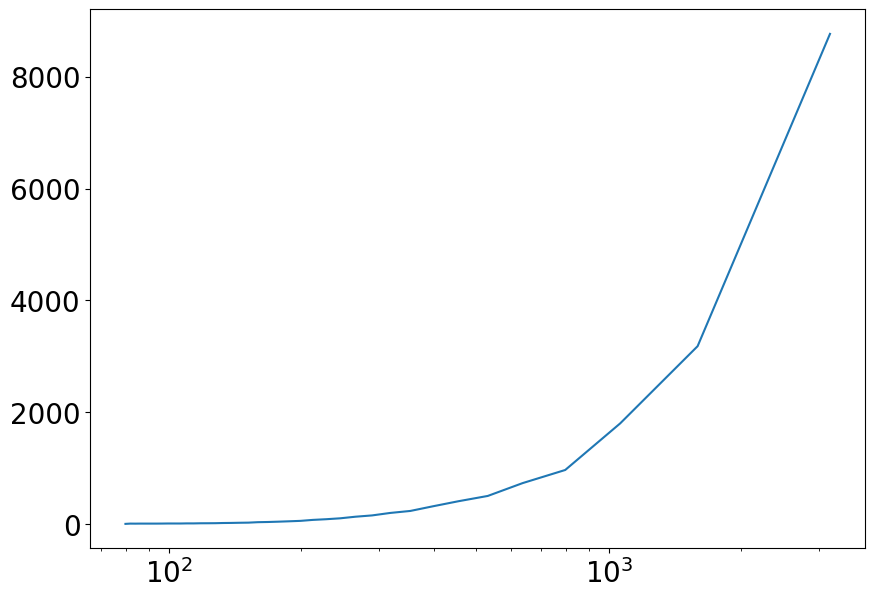

In [87]:
plt.figure()
xsize = 200
# f_scales = np.zeros(len(spectral[exp].klp))
# for k in range(len(spectral[exp].klp)):   
#     if spectral[exp].klp[k] > 0:
#         f_scales[k] = xsize/(spectral[exp].klp[k]*2).values  # m
#     elif spectral.klp[k] == 0:
#         f_scales[k] = xsize

f_scale = xsize/(spectral[exp].klp*2)
# spectral[exp].mean('time')['spec_u'].values[0]
plt.plot(f_scale/1000,spectral[exp].mean('time')['spec_u'].values[0].T)
plt.xscale('log')
# spectral[exp]['spec_u'].mean('time').plot(x='klp')

plt.figure()
iz = 0
xsize = 200
f_scale = xsize/(filtered_exp.klp*2)
plt.plot(f_scale,spectral['tke'].isel(z=iz).mean('time')/spectral['tke'].isel(z=iz).mean('time').max(),ls='-')
plt.xscale('log')

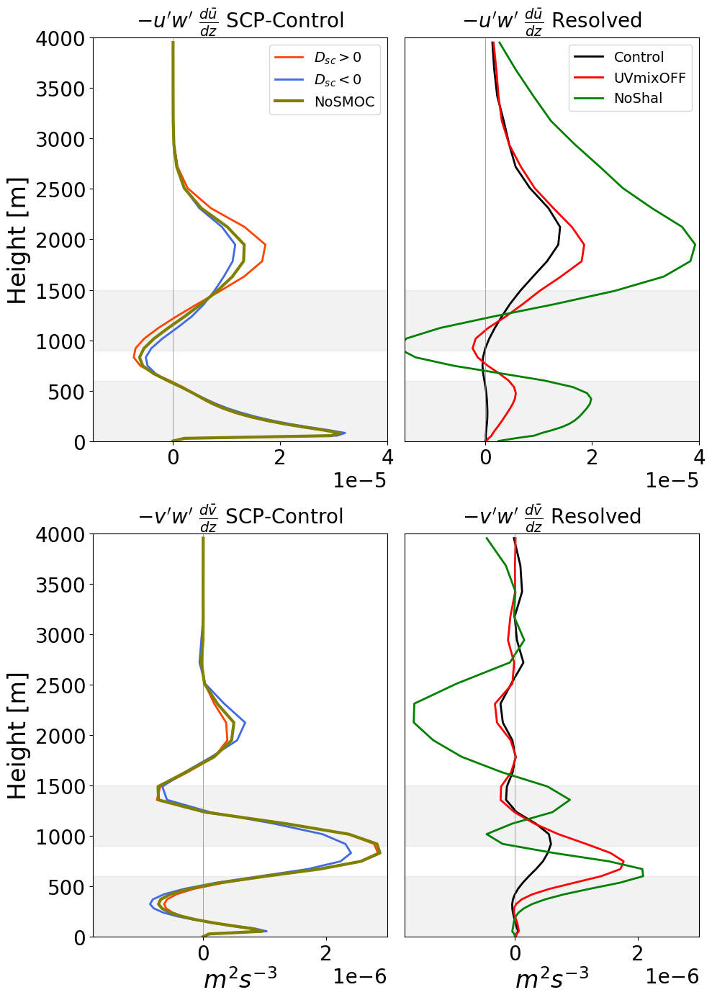

In [40]:
#%% Shear production term 
n_xplots = 2
n_yplots = 2
cmap_ = cm.coolwarm
sc_layer_base = 0
sc_layer_top = 600
c_layer_base = 900
c_layer_top = 1500

para_res = 'conv'
exp = exps[0]
sel_time=harm2d[exp].time

fig, axs = plt.subplots(n_yplots,n_xplots,figsize=(10,14))
for idx, var in enumerate(['u','v']):
    if var == 'u':
        write_title = 'Zonal tendency'
    elif var == 'v':
        write_title = 'Meridional tendency'
            
    ## K = u'w' du/dz 
    ## Tendency normalised by the wind
    # (harm2d[var].sel(z=slice(0,4000)).mean(('x','y','time'))\
    #     /harm2d[wind_var].sel(z=slice(0,4000)).mean(('x','y','time')))\
    #         .plot(y='z',lw=1.5,ax=axs[idx,2],c='k',label='Mean')
    (-harm2d[exps[0]][var+'flx_'+para_res+'_on_conv'].sel(time=sel_time).mean('time')\
     *harm2d[exps[0]][var+'_on_conv'].differentiate('z').sel(time=sel_time).mean('time'))\
             .sel(z=slice(0,4000))\
            .plot(y='z',lw=2,ax=axs[idx,0],c='orangered',label=r'$D_{sc}>0$')
    (-harm2d[exps[0]][var+'flx_'+para_res+'_on_dive'].sel(time=sel_time).mean('time')\
     *harm2d[exps[0]][var+'_on_dive'].differentiate('z').sel(time=sel_time).mean('time'))\
             .sel(z=slice(0,4000))\
            .plot(y='z',lw=2,ax=axs[idx,0],c='royalblue',label=r'$D_{sc}<0$')
    (-harm2d[exps[0]][var+'flx_'+para_res+'_off_smoc'].sel(time=sel_time).mean('time')\
     *harm2d[exps[0]][var+'_off_smoc'].differentiate('z').sel(time=sel_time).mean('time'))\
             .sel(z=slice(0,4000))\
            .plot(y='z',lw=3,ax=axs[idx,0],c='olive',label=r'NoSMOC')

    for ide,exp in enumerate(exps):
        (-harm3d[exp][var+'w'].mean(('x','y')).sel(time=sel_time).mean('time')\
             *harm2d[exp][var].differentiate('z').sel(time=sel_time).mean('time'))\
                 .sel(z=slice(0,4000))\
                .plot(y='z',lw=2,ax=axs[idx,1],c=col[ide],label=lab[ide])
    ##
    axs[idx,1].set_yticks([])
    axs[idx,1].set_ylabel('')
    for idy in [0,1]:
        axs[idx,idy].axvline(0,c='grey',lw=0.5)
        axs[idx,idy].set_ylim([0,4000])
        axs[idx,idy].axhspan(sc_layer_base, sc_layer_top, alpha=0.1, color='grey')
        axs[idx,idy].axhspan(c_layer_base, c_layer_top, alpha=0.1, color='grey')
    ##
axs[0,0].set_xlim([-1.5e-5,4e-5])
axs[0,1].set_xlim([-1.5e-5,4e-5])
axs[1,0].set_xlim([-0.18e-5,0.3e-5])
axs[1,1].set_xlim([-0.18e-5,0.3e-5])
axs[0,0].set_xlabel('')
axs[0,1].set_xlabel('')
# axs[0,0].set_title('Zonal wind',fontsize=20)
# axs[1,0].set_title('Meridional wind',fontsize=20)
axs[0,0].set_title(r"$-u'w'\ \frac{d\bar{u}}{dz}$ SCP-Control",fontsize=20)
axs[1,0].set_title(r"$-v'w'\ \frac{d\bar{v}}{dz}$ SCP-Control",fontsize=20)
axs[0,1].set_title(r"$-u'w'\ \frac{d\bar{u}}{dz}$ Resolved",fontsize=20)
axs[1,1].set_title(r"$-v'w'\ \frac{d\bar{v}}{dz}$ Resolved",fontsize=20)

axs[idx,0].set_xlabel(r'$m^2 s^{-3}$')
axs[idx,1].set_xlabel(r'$m^2 s^{-3}$')
axs[0,0].legend(fontsize=14)
axs[0,1].legend(fontsize=14)
plt.tight_layout()
plt.savefig(figure_dir+'shear_production_term.pdf')

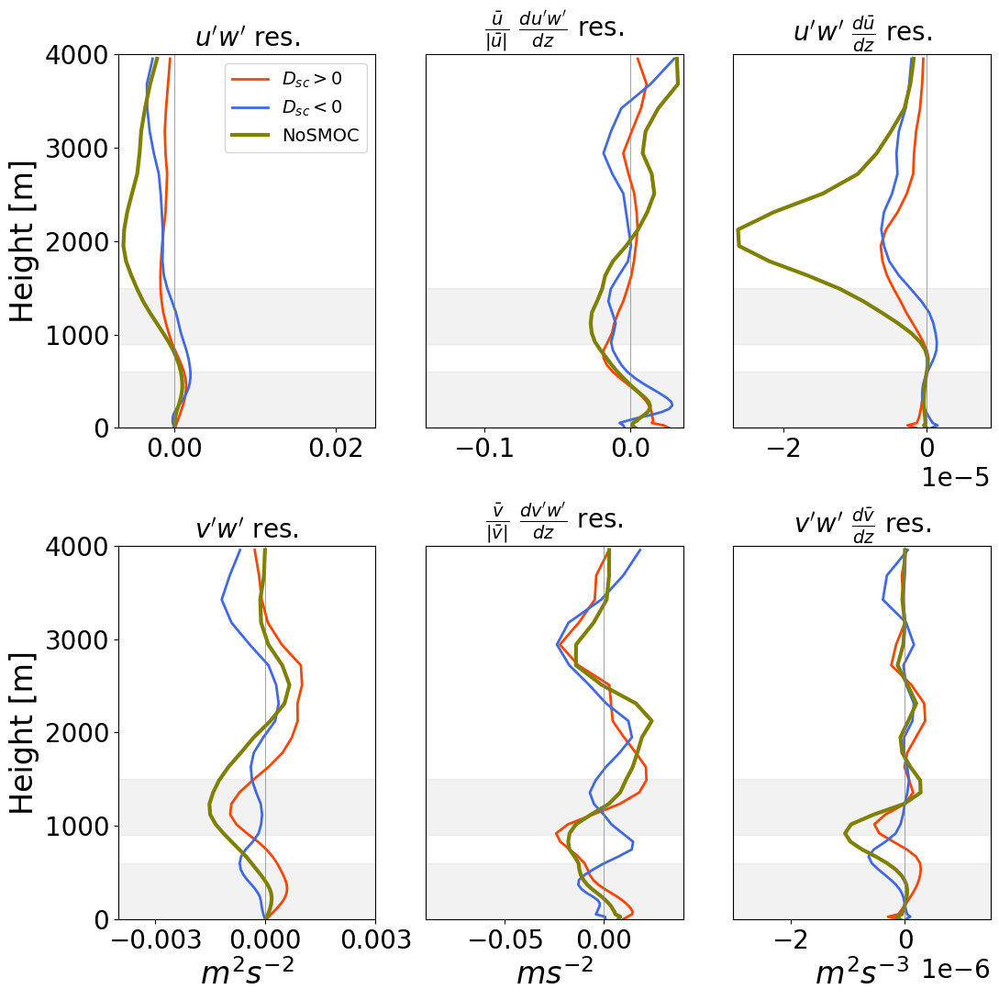

In [16]:
#%% Wind tendency from shallow convective parameterisation 
n_xplots = 3
n_yplots = 2
cmap_ = cm.coolwarm
sc_layer_base = 0
sc_layer_top = 600
c_layer_base = 900
c_layer_top = 1500

para_res = 'res'
exp = exps[0]
sel_time=harm2d[exp].time

# sel_time = harm2d['time'].where\
#     (harm2d['u_flx_param_tot'].compute().sel(z=700,method='nearest')<\
#      harm2d['u_flx_param_tot'].compute().sel(z=700,method='nearest').median(),\
#          drop=True).values

# sel_time = tm_cf_large

fig, axs = plt.subplots(n_yplots,n_xplots,figsize=(11,11))
for idx, var in enumerate(['u','v']):
    if var == 'u':
        write_title = 'Zonal tendency'
    elif var == 'v':
        write_title = 'Meridional tendency'
    ## Winds
    # # harm2d[wind_var].sel(z=slice(0,4000)).mean(('x','y','time'))\
    # #         .plot(y='z',lw=1.5,ax=axs[idx,0],c='k',label='Mean')
    # harm2d[var+'_on_conv'].sel(time=sel_time).sel(z=slice(10,4000)).mean('time')\
    #         .plot(y='z',lw=2,ax=axs[idx,0],c='orangered',label=r'$D_{sc}>0$')
    # harm2d[var+'_on_dive'].sel(time=sel_time).sel(z=slice(10,4000)).mean('time')\
    #         .plot(y='z',lw=2,ax=axs[idx,0],c='royalblue',label=r'$D_{sc}<0$')
    # harm2d[var+'_off_smoc'].sel(time=sel_time).sel(z=slice(10,4000)).mean('time')\
    #         .plot(y='z',lw=3,ax=axs[idx,0],c='olive',label=r'NoSMOC')    
    
    ## Fluxes
    # harm2d[flx_var].sel(z=slice(0,4000)).mean(('x','y','time'))\
    #         .plot(y='z',lw=1.5,ax=axs[idx,0],c='k',label='Mean')
    harm2d[exp][var+'flx_'+para_res+'_on_conv'].sel(time=sel_time).sel(z=slice(0,4000)).mean('time')\
            .plot(y='z',lw=2,ax=axs[idx,0],c='orangered',label=r'$D_{sc}>0$')
    harm2d[exp][var+'flx_'+para_res+'_on_dive'].sel(time=sel_time).sel(z=slice(0,4000)).mean('time')\
            .plot(y='z',lw=2,ax=axs[idx,0],c='royalblue',label=r'$D_{sc}<0$')
    harm2d[exp][var+'flx_'+para_res+'_off_smoc'].sel(time=sel_time).sel(z=slice(0,4000)).mean('time')\
            .plot(y='z',lw=3,ax=axs[idx,0],c='olive',label=r'NoSMOC')

    ## Tendency 
    ## Tendency normalised by the wind
    # (harm2d[var].sel(z=slice(0,4000)).mean(('x','y','time'))\
    #     /harm2d[wind_var].sel(z=slice(0,4000)).mean(('x','y','time')))\
    #         .plot(y='z',lw=1.5,ax=axs[idx,1],c='k',label='Mean')
    (harm2d[exp][var+'tend_'+para_res+'_on_conv'].sel(time=sel_time).sel(z=slice(0,4000)).mean('time')\
        /(harm2d[exp][var+'_on_conv']/np.abs(harm2d[exp][var+'_on_conv'])).sel(time=sel_time).sel(z=slice(0,4000)).mean('time'))\
            .plot(y='z',lw=2,ax=axs[idx,1],c='orangered',label=r'$D_{sc}>0$')
    (harm2d[exp][var+'tend_'+para_res+'_on_dive'].sel(time=sel_time).sel(z=slice(0,4000)).mean('time')\
        /(harm2d[exp][var+'_on_dive']/np.abs(harm2d[exp][var+'_on_dive'])).sel(time=sel_time).sel(z=slice(0,4000)).mean('time'))\
            .plot(y='z',lw=2,ax=axs[idx,1],c='royalblue',label=r'$D_{sc}<0$')
    (harm2d[exp][var+'tend_'+para_res+'_off_smoc'].sel(time=sel_time).sel(z=slice(0,4000)).mean('time')\
        /(harm2d[exp][var+'_off_smoc']/np.abs(harm2d[exp][var+'_off_smoc'])).sel(time=sel_time).sel(z=slice(0,4000)).mean('time'))\
            .plot(y='z',lw=3,ax=axs[idx,1],c='olive',label=r'NoSMOC')
            
    ## K = u'w' du/dz 
    ## Tendency normalised by the wind
    # (harm2d[var].sel(z=slice(0,4000)).mean(('x','y','time'))\
    #     /harm2d[wind_var].sel(z=slice(0,4000)).mean(('x','y','time')))\
    #         .plot(y='z',lw=1.5,ax=axs[idx,2],c='k',label='Mean')
    (harm2d[exp][var+'flx_'+para_res+'_on_conv'].sel(time=sel_time).mean('time')\
     *harm2d[exp][var+'_on_conv'].differentiate('z').sel(time=sel_time).mean('time'))\
             .sel(z=slice(0,4000))\
            .plot(y='z',lw=2,ax=axs[idx,2],c='orangered',label=r'$D_{sc}>0$')
    (harm2d[exp][var+'flx_'+para_res+'_on_dive'].sel(time=sel_time).mean('time')\
     *harm2d[exp][var+'_on_dive'].differentiate('z').sel(time=sel_time).mean('time'))\
             .sel(z=slice(0,4000))\
            .plot(y='z',lw=2,ax=axs[idx,2],c='royalblue',label=r'$D_{sc}<0$')
    (harm2d[exp][var+'flx_'+para_res+'_off_smoc'].sel(time=sel_time).mean('time')\
     *harm2d[exp][var+'_off_smoc'].differentiate('z').sel(time=sel_time).mean('time'))\
             .sel(z=slice(0,4000))\
            .plot(y='z',lw=3,ax=axs[idx,2],c='olive',label=r'NoSMOC')
    ##
    axs[idx,1].set_yticks([])
    axs[idx,1].set_ylabel('')
    axs[idx,2].set_yticks([])
    axs[idx,2].set_ylabel('')
    for idy in [0,1,2]:
        axs[idx,idy].axvline(0,c='grey',lw=0.5)
        axs[idx,idy].set_ylim([0,4000])
        axs[idx,idy].axhspan(sc_layer_base, sc_layer_top, alpha=0.1, color='grey')
        axs[idx,idy].axhspan(c_layer_base, c_layer_top, alpha=0.1, color='grey')
    # axs[idx,2].set_xlim([-0.05,0.03])
    # axs[idx,2].set_xticks(np.linspace(-0.03, 0.03, 3))
    ##
axs[0,0].set_xlim([-0.007,0.025])
axs[1,0].set_xlim([-0.004,0.003])
axs[0,1].set_xlim([-0.14,0.036])
axs[1,1].set_xlim([-0.09,0.04])
axs[0,2].set_xlim([-2.7e-5,0.9e-5])
axs[1,2].set_xlim([-0.3e-5,0.15e-5])
axs[1,0].set_xticks(np.linspace(-0.003, 0.003, 3))
axs[0,0].set_xlabel('')
axs[0,1].set_xlabel('')
axs[0,2].set_xlabel('')
# axs[0,0].set_title('Zonal wind',fontsize=20)
# axs[1,0].set_title('Meridional wind',fontsize=20)
axs[0,0].set_title(r"$u'w'$ "+para_res+'.',fontsize=20)
axs[1,0].set_title(r"$v'w'$ "+para_res+'.',fontsize=20)
axs[0,1].set_title(r"$\frac{\bar{u}}{|\bar{u}|}\ \frac{du'w'}{dz}$ "+para_res+'.',fontsize=20)
axs[1,1].set_title(r"$\frac{\bar{v}}{|\bar{v}|}\ \frac{dv'w'}{dz}$ "+para_res+'.',fontsize=20)
axs[0,2].set_title(r"$u'w'\ \frac{d\bar{u}}{dz}$ "+para_res+'.',fontsize=20)
axs[1,2].set_title(r"$v'w'\ \frac{d\bar{v}}{dz}$ "+para_res+'.',fontsize=20)
# axs[idx,0].set_xlabel(r'$m s^{-1}$')
axs[idx,0].set_xlabel(r'$m^2 s^{-2}$')
axs[idx,1].set_xlabel(r'$m s^{-2}$')
axs[idx,2].set_xlabel(r'$m^2 s^{-3}$')
# axs[idx,1].set_xlabel(r'$hour^{-1}$')
axs[0,0].legend(fontsize=14)
plt.tight_layout()
# plt.savefig(save_dir+para_res+'_flx_byregion.pdf')

Text(0.5, 0.98, 'res')

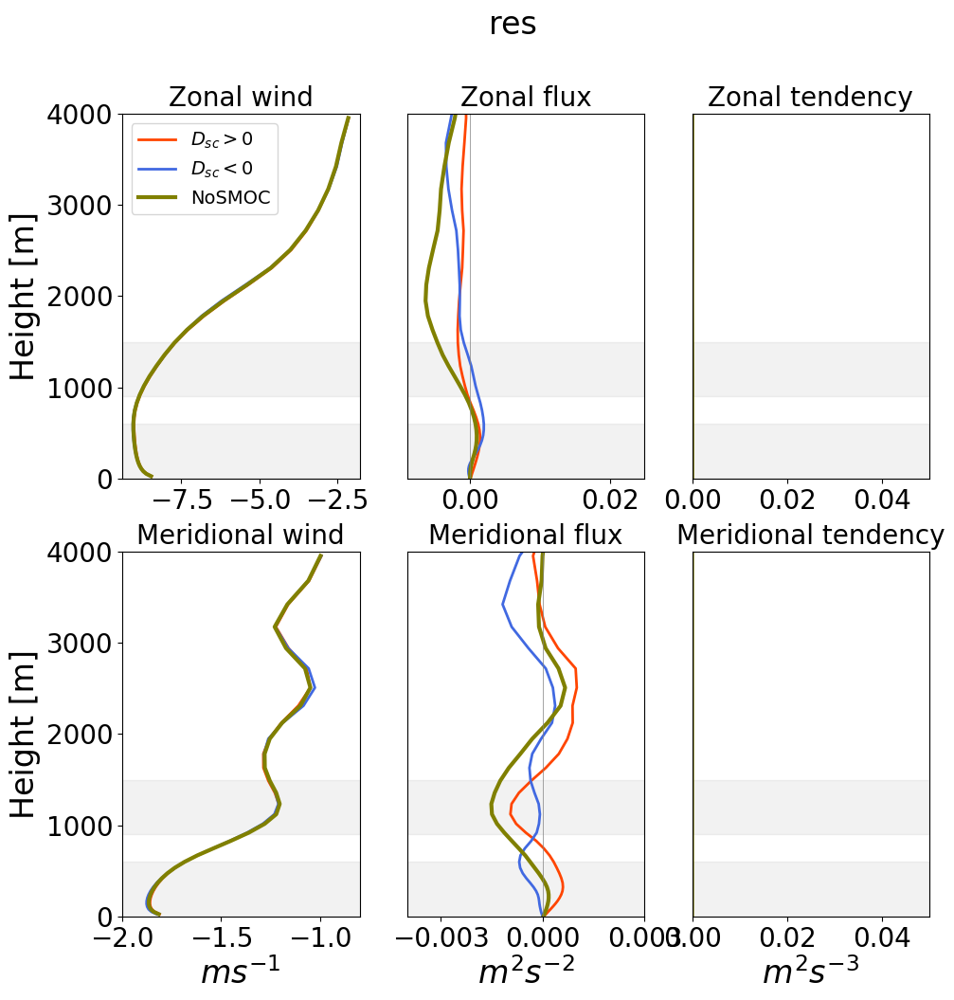

In [10]:
n_yplots = 2
n_xplots = 3

par_res = 'res'
exp = exps[0]
fig, axs = plt.subplots(n_yplots,n_xplots,figsize=(11,11))
for idx, var in enumerate(['u','v']):
    ## wind
    harm2d[exp][var+'_on_conv'].sel(z=slice(10,4000)).mean('time')\
            .plot(y='z',ax=axs[idx,0],lw=2,c='orangered',label=r'$D_{sc}>0$')
    harm2d[exp][var+'_on_dive'].sel(z=slice(10,4000)).mean('time')\
            .plot(y='z',ax=axs[idx,0],lw=2,c='royalblue',label=r'$D_{sc}<0$')
    harm2d[exp][var+'_off_smoc'].sel(z=slice(10,4000)).mean('time')\
            .plot(y='z',ax=axs[idx,0],lw=3,c='olive',label=r'NoSMOC')
    ## flux
    harm2d[exp][var+'flx_'+par_res+'_on_conv'].mean('time')\
                .plot(y='z',ax=axs[idx,1],lw=2,c='orangered',label=r'$D_{sc}>0$')
    harm2d[exp][var+'flx_'+par_res+'_on_dive'].mean('time')\
                .plot(y='z',ax=axs[idx,1],lw=2,c='royalblue',label=r'$D_{sc}<0$')
    harm2d[exp][var+'flx_'+par_res+'_off_smoc'].mean('time')\
                .plot(y='z',ax=axs[idx,1],lw=3,c='olive',label=r'NoSMOC')
    axs[idx,1].axvline(0,c='grey',lw=0.5)
    # ## tend
    # (harm2d[exp][var+'tend_'+par_res+'_on_conv'].mean('time')/(harm2d[exp][var+'_on_conv']/np.abs(harm2d[exp][var+'_on_conv'])).mean('time'))\
    #             .plot(y='z',ax=axs[idx,2],lw=2,c='orangered',label=r'$D_{sc}>0$')
    # (harm2d[exp][var+'tend_'+par_res+'_on_dive'].mean('time')/(harm2d[exp][var+'_on_dive']/np.abs(harm2d[exp][var+'_on_dive'])).mean('time'))\
    #             .plot(y='z',ax=axs[idx,2],lw=2,c='royalblue',label=r'$D_{sc}<0$')
    # (harm2d[exp][var+'tend_'+par_res+'_off_smoc'].mean('time')/(harm2d[exp][var+'_on_conv']/np.abs(harm2d[exp][var+'_on_conv'])).mean('time'))\
    #             .plot(y='z',ax=axs[idx,2],lw=3,c='olive',label=r'NoSMOC')
    # axs[idx,2].axvline(0,c='grey',lw=0.5)

    ## var production 
    (harm2d[exp][var+'flx_'+par_res+'_on_conv'].mean('time')*harm2d[exp][var+'_on_conv'].differentiate('z').mean('time'))\
                .plot(y='z',ax=axs[idx,2],lw=2,c='orangered',label=r'$D_{sc}>0$')
    (harm2d[exp][var+'flx_'+par_res+'_on_dive'].mean('time')*harm2d[exp][var+'_on_dive'].differentiate('z').mean('time'))\
                .plot(y='z',ax=axs[idx,2],lw=2,c='royalblue',label=r'$D_{sc}<0$')
    (harm2d[exp][var+'flx_'+par_res+'_off_smoc'].mean('time')*harm2d[exp][var+'_off_smoc'].differentiate('z').mean('time'))\
                .plot(y='z',ax=axs[idx,2],lw=3,c='olive',label=r'NoSMOC')
    axs[idx,2].axvline(0,c='grey',lw=0.5)
    

    for idy in [0,1,2]:
        axs[idx,idy].set_ylim([0,4000])
        axs[idx,idy].axhspan(sc_layer_base, sc_layer_top, alpha=0.1, color='grey')
        axs[idx,idy].axhspan(c_layer_base, c_layer_top, alpha=0.1, color='grey')
        axs[0,idy].set_xlabel('')


    axs[idx,1].set_yticks([])
    axs[idx,1].set_ylabel('')
    axs[idx,2].set_yticks([])
    axs[idx,2].set_ylabel('')
    # axs[idx,2].set_xlim([-0.06,None])
axs[0,1].set_xlim([-0.009,0.025])
axs[1,1].set_xlim([-0.004,0.003])
axs[0,2].set_xlim([None,0.05])
axs[1,2].set_xlim([None,0.05])

axs[0,0].set_title('Zonal wind',fontsize=20)
axs[1,0].set_title('Meridional wind',fontsize=20)
axs[0,1].set_title('Zonal flux',fontsize=20)
axs[1,1].set_title('Meridional flux',fontsize=20)
axs[0,2].set_title('Zonal tendency',fontsize=20)
axs[1,2].set_title('Meridional tendency',fontsize=20)
axs[1,0].set_xlabel(r'$m s^{-1}$')
axs[1,1].set_xlabel(r'$m^2 s^{-2}$')
axs[1,2].set_xlabel(r'$hour^{-1}$')
axs[1,2].set_xlabel(r'$m^2 s^{-3}$')
axs[1,1].set_xticks(np.linspace(-0.003, 0.003, 3))
axs[1,0].set_xlim([-2,-0.8])
axs[0,0].legend(fontsize=14)
plt.suptitle(par_res)


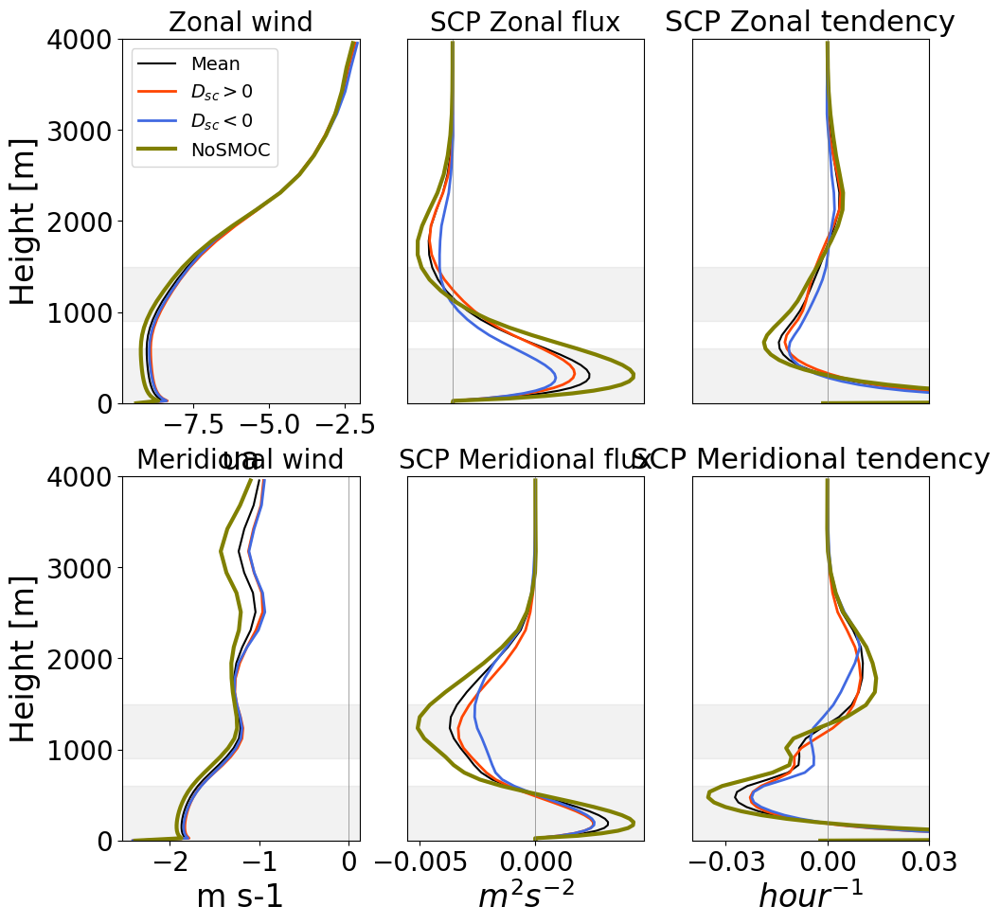

In [40]:
#%% Wind tendency from shallow convective parameterisation 
exp = exps[0]
time_interv = [0,-1]
n_xplots = 3
n_yplots = 2
cmap_ = cm.coolwarm

fig, axs = plt.subplots(n_yplots,n_xplots,figsize=(11,11))
for idx, var in enumerate(['utend_conv','vtend_conv']):
    if var == 'utend_conv':
        write_title = 'Zonal tendency'
        wind_var = 'ua'
        flx_var = 'uflx_conv'
    elif var == 'vtend_conv':
        write_title = 'Meridional tendency'
        wind_var = 'va'
        flx_var = 'vflx_conv'
    ## Winds
    # harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).sel(z=slice(0,4000)).mean(('x','y','time'))\
    #         .plot(y='z',lw=1.5,ax=axs[idx,0],c='k',label='Mean')
    harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_conv']>0).sel(z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ax=axs[idx,0],c='orangered',label=r'$D_{sc}>0$')
    harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_dive']>0).sel(z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ax=axs[idx,0],c='royalblue',label=r'$D_{sc}<0$')
    harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc']==0).sel(z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=3,ax=axs[idx,0],c='olive',label=r'NoSMOC')    
    
    ## Fluxes
    # harm3d[exp][flx_var].isel(time=slice(time_interv[0],time_interv[1])).sel(z=slice(0,4000)).mean(('x','y','time'))\
    #         .plot(y='z',lw=1.5,ax=axs[idx,1],c='k',label='Mean')
    harm3d[exp][flx_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_conv']>0).sel(z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ax=axs[idx,1],c='orangered',label=r'$D_{sc}>0$')
    harm3d[exp][flx_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_dive']>0).sel(z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ax=axs[idx,1],c='royalblue',label=r'$D_{sc}<0$')
    harm3d[exp][flx_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc']==0).sel(z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=3,ax=axs[idx,1],c='olive',label=r'NoSMOC')

    ## Tendency 
    ## Tendency normalised by the wind
    # (harm3d[exp][var].isel(time=slice(time_interv[0],time_interv[1])).sel(z=slice(0,4000)).mean(('x','y','time'))\
    #     /harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).sel(z=slice(0,4000)).mean(('x','y','time')))\
    #         .plot(y='z',lw=1.5,ax=axs[idx,2],c='k',label='Mean')
    (harm3d[exp][var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_conv']>0).sel(z=slice(0,4000)).mean(('x','y','time'))\
        /harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_conv']>0).sel(z=slice(0,4000)).mean(('x','y','time')))\
            .plot(y='z',lw=2,ax=axs[idx,2],c='orangered',label=r'$D_{sc}>0$')
    (harm3d[exp][var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_dive']>0).sel(z=slice(0,4000)).mean(('x','y','time'))\
        /harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc_dive']>0).sel(z=slice(0,4000)).mean(('x','y','time')))\
            .plot(y='z',lw=2,ax=axs[idx,2],c='royalblue',label=r'$D_{sc}<0$')
    (harm3d[exp][var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc']==0).sel(z=slice(0,4000)).mean(('x','y','time'))\
        /harm3d[exp][wind_var].isel(time=slice(time_interv[0],time_interv[1])).where(filtered[exp].sel(klp=5)['smoc']==0).sel(z=slice(0,4000)).mean(('x','y','time')))\
            .plot(y='z',lw=3,ax=axs[idx,2],c='olive',label=r'NoSMOC')
    ##
    axs[idx,1].set_yticks([])
    axs[idx,1].set_ylabel('')
    axs[idx,2].set_yticks([])
    axs[idx,2].set_ylabel('')
    for idy in [0,1,2]:
        axs[idx,idy].axvline(0,c='grey',lw=0.5)
        axs[idx,idy].set_ylim([0,4000])
        axs[idx,idy].axhspan(sc_layer_base, sc_layer_top, alpha=0.1, color='grey')
        axs[idx,idy].axhspan(c_layer_base, c_layer_top, alpha=0.1, color='grey')
    axs[idx,2].set_xlim([-0.04,0.03])
    axs[idx,2].set_xticks(np.linspace(-0.03, 0.03, 3))
    axs[idx,2].set_title(write_title,fontsize=22)
    ##
axs[0,0].set_xlim([None,-2])
axs[0,0].set_xlabel('')
axs[0,1].set_xlabel('')
axs[0,2].set_xlabel('')
axs[0,0].set_title('Zonal wind',fontsize=20)
axs[1,0].set_title('Meridional wind',fontsize=20)
axs[0,1].set_title('Zonal flux',fontsize=20)
axs[1,1].set_title('Meridional flux',fontsize=20)
axs[idx,0].set_xlabel(r'$m s^{-1}$')
axs[idx,1].set_xlabel(r'$m^2 s^{-2}$')
axs[idx,2].set_xlabel(r'$hour^{-1}$')
axs[0,0].legend(fontsize=14)
# plt.savefig(figure_dir+'wind_tend_subsamp_norm_by_wind.pdf')
plt.savefig(figure_dir+'wind_prof_subsamp_norm_by_wind.pdf')

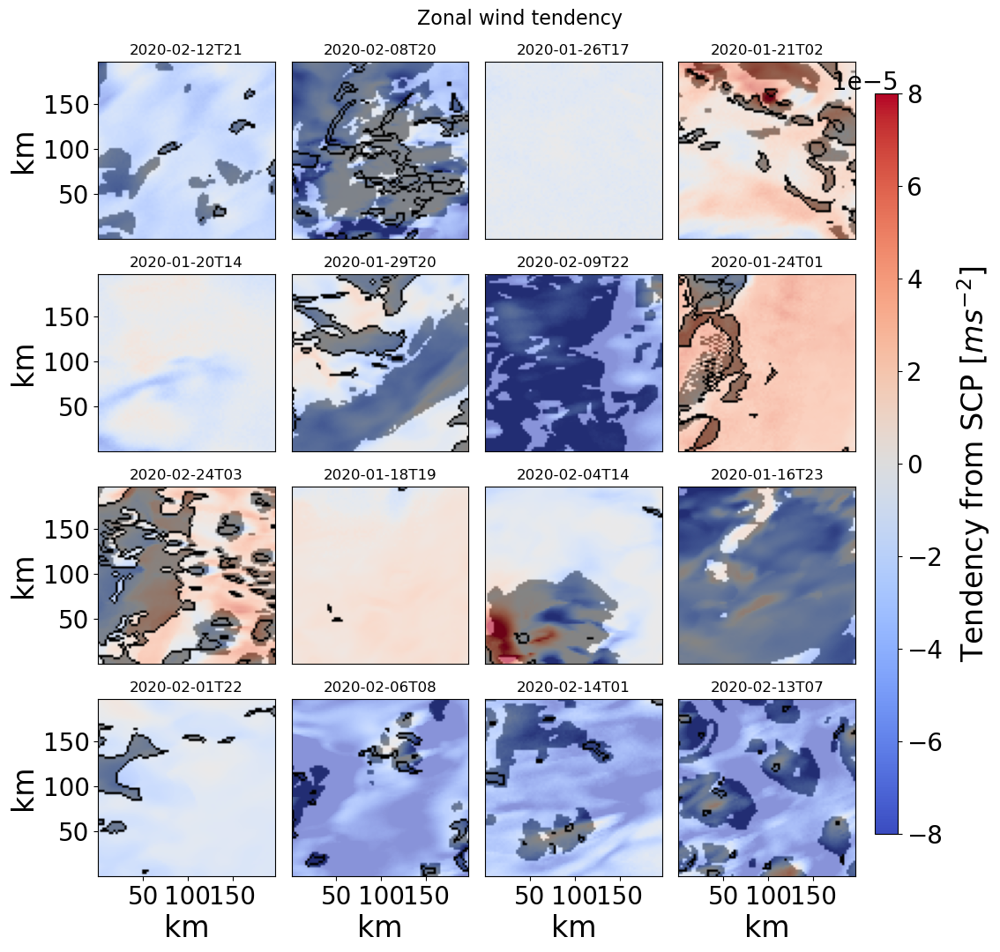

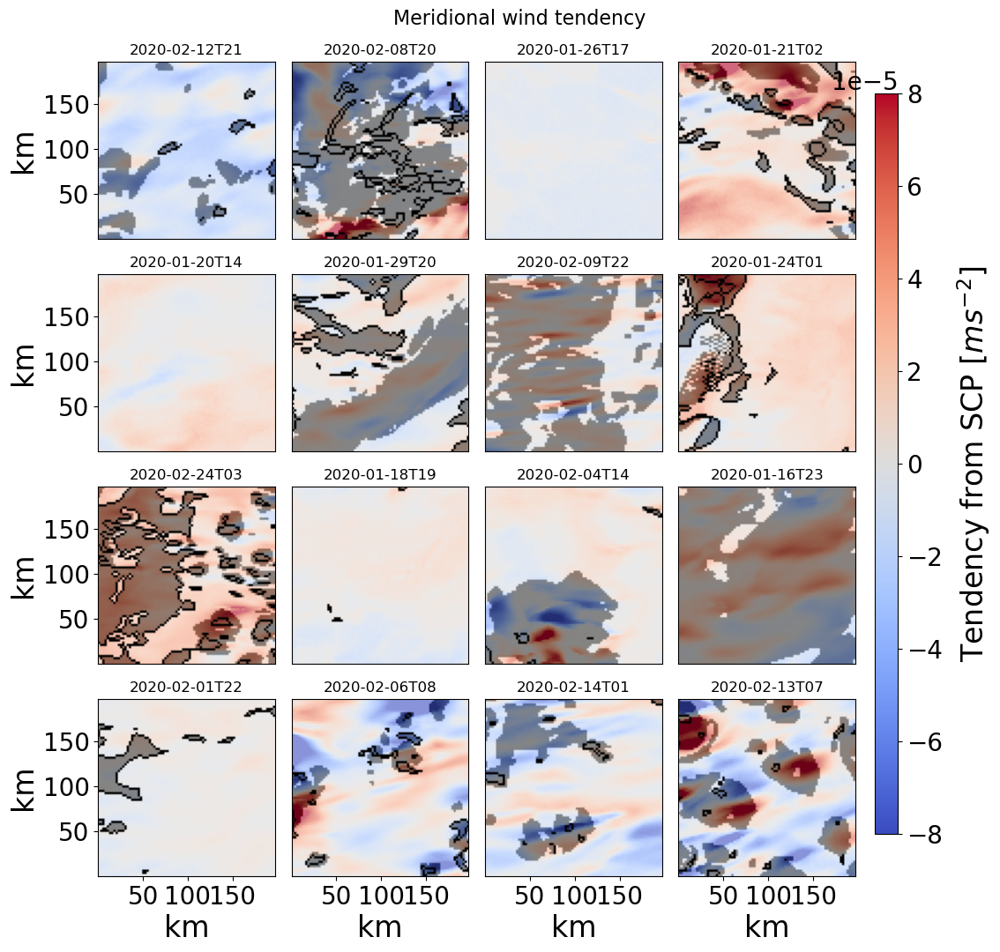

In [93]:
#%% Snapshots of tendencies for many dates
klp=5
iz = [900,1500] # m
exp = exps[0]
n_xplots = 4
n_yplots = 4 
var_shade= 'cc_1km'
vmin_ = -0.00008
vmax_ = 0.00008
cmap_ = 'coolwarm'
cmap_ = cm.coolwarm
cmap_.set_bad(color='white')
ticklabels= np.array([50,100,150]) # in km 

for id, var in enumerate(['utend_conv','vtend_conv']):
    if var == 'utend_conv':
        times = np.random.choice(harm3d[exp]['time'], 16, replace=False)
    fig, axs = plt.subplots(n_xplots,n_yplots,figsize=(13,12))
    plt.subplots_adjust(right=0.8,wspace=0.001)
    # for idt, sel_time in enumerate([np.datetime64('2020-01-07T22'),np.datetime64('2020-01-17T12'),np.datetime64('2020-02-11T05')\
    #                                ,np.datetime64('2020-01-20T16'),np.datetime64('2020-01-25T15'),np.datetime64('2020-02-01T19')\
    #                                ,np.datetime64('2020-02-05T10'),np.datetime64('2020-01-12T05'),np.datetime64('2020-02-20T22')]):
    for idt, sel_time in enumerate(times):
        
        idx = np.floor(idt/n_xplots).astype(int),idt-(n_xplots*np.floor(idt/n_xplots)).astype(int)
        if var_shade == 'cc_conv':
            cloud_mask = (harm3d[exp]['cc_4km']-harm3d[exp]['cc_1to4km']).sel(time=sel_time).values
        else: 
            cloud_mask = harm3d[exp].sel(time=sel_time)[var_shade].values
        # Find connected components in the cloud_mask
        labels = measure.label(cloud_mask, connectivity=2)  # Assuming 8-connectivity
        # Create an empty array for the outline mask
        outline_mask = np.zeros_like(cloud_mask, dtype=bool)
        # Iterate through each connected component and find its boundary pixels
        for label in range(1, labels.max() + 1):
            component_mask = labels == label
            contour = measure.find_contours(component_mask, 0.8)
            # Add the boundary pixels to the outline mask
            for points in contour:
                outline_mask[np.round(points[:, 0]).astype(int), np.round(points[:, 1]).astype(int)] = True 
        
        if var in harm3d[exp]:
            axs[idx].set_facecolor((2/255, 45/255, 109/255))
            background = harm3d[exp].sel(z=slice(iz[0],iz[1])).sel(time=sel_time)[var].mean('z').values   
            ## only plot regions where w is positive (upward motion)
            # background = harm3d[exp].where(harm3d[exp]['wa_p']>0).sel(z=slice(iz[0],iz[1])).sel(time=sel_time)[var].mean('z').values 
        im = axs[idx].imshow(background,cmap=cmap_,vmin=vmin_,vmax=vmax_, origin='lower',\
                extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
            
        # Set the alpha channel of outline_mask
        outline_mask_rgba = np.zeros((outline_mask.shape[0], outline_mask.shape[1], 4), dtype=np.uint8)
        if var == 'cl_top':
            outline_mask_rgba[..., :3] = [241, 90, 34]  # Set RGB to orange where True
        outline_mask_rgba[..., 3] = outline_mask * 255  # Set alpha to 255 (fully opaque) where True
        # Plot the outline with alpha blending
        axs[idx].imshow(outline_mask_rgba, origin='lower',\
                    extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
        # plot the shading 
        cloud_mask = harm3d[exp].sel(time=sel_time)['cc_4km'].values
        axs[idx].imshow(cloud_mask,cmap='binary', origin='lower',alpha=0.4,\
                    extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
        axs[idx].set_aspect('equal', adjustable='box')
        axs[idx].set_title('')
        ## x
        if idx[0] ==n_yplots-1:
            axs[idx].set_xlabel('km')            
            axs[idx].set_xticks(ticklabels*1000 +min(harm3d[exp].x).values)
            axs[idx].set_xticklabels(ticklabels)
        else:
            axs[idx].set_xlabel('')
            axs[idx].set_xticks([])
        ## y
        axs[idx].set_ylabel('')
        axs[idx].set_yticks([])
        if idx[1] == 0:
            axs[idx].set_yticks(ticklabels*1000 +min(harm3d[exp].y).values)
            axs[idx].set_yticklabels(ticklabels)
            axs[idx].set_ylabel('km')
        axs[idx].set_title(str(sel_time)[0:13],fontsize=12)

    if var == 'utend_conv':
        fig.suptitle('Zonal wind tendency', fontsize=16, y=0.93)  # You can customize the title and position as needed
    elif var == 'vtend_conv':
        fig.suptitle('Meridional wind tendency', fontsize=16, y=0.93)  # You can customize the title and position as needed    
    cbar_ax = fig.add_axes([0.81, 0.15, 0.02, 0.7])  # Adjust the position and size as needed
    cbar =fig.colorbar(im, cax=cbar_ax, orientation='vertical')
    # cbar.set_label(r'Convective momentum flux [$m^2 s^{2}$]', labelpad=10) 
    cbar.set_label(r'Tendency from SCP [$m s^{-2}$]', labelpad=10) 

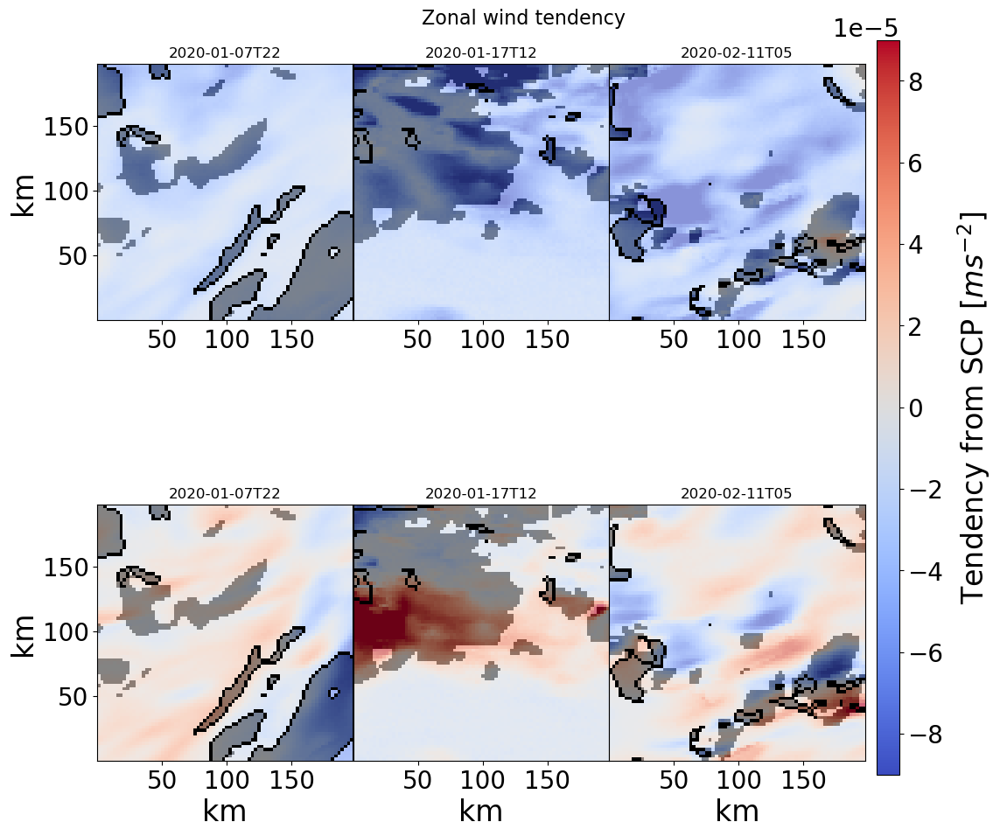

In [44]:
#%% CTRL snapshot : param mom flux and cloud field
# idtime= filtered[exp].time[15]
klp=5
iz = [900,1500] # m
exp = exps[0]
var_shade= 'cc_1km'
var ='uflx_conv'
# vmin_ = 0.0015
# vmax_ = 0.05
vmin_ = -0.013
vmax_ = 0.013
vmin_ = -0.00009
vmax_ = 0.00009
cmap_ = 'coolwarm'
cmap_ = cm.coolwarm
cmap_.set_bad(color='white')
ticklabels= np.array([50,100,150]) # in km 

fig, axs = plt.subplots(2,3,figsize=(13,12))
plt.subplots_adjust(right=0.8,wspace=0.001)
for idt, sel_time in enumerate([np.datetime64('2020-01-07T22'),np.datetime64('2020-01-17T12'),np.datetime64('2020-02-11T05')]):
# for idt, sel_time in enumerate([np.datetime64('2020-01-14T05'),np.datetime64('2020-01-22T22'),np.datetime64('2020-02-15T12')]):
    # Extract the 'cloud_mask' variable as a numpy array
    # for idx,var in enumerate(['uflx_conv','vflx_conv']):
    for idx,var in enumerate(['utend_conv','vtend_conv']):
        if var_shade == 'cc_conv':
            cloud_mask = (harm3d[exp]['cc_4km']-harm3d[exp]['cc_1to4km']).sel(time=sel_time).values
        else: 
            cloud_mask = harm3d[exp].sel(time=sel_time)[var_shade].values
        # Find connected components in the cloud_mask
        labels = measure.label(cloud_mask, connectivity=2)  # Assuming 8-connectivity
        # Create an empty array for the outline mask
        outline_mask = np.zeros_like(cloud_mask, dtype=bool)
        # Iterate through each connected component and find its boundary pixels
        for label in range(1, labels.max() + 1):
            component_mask = labels == label
            contour = measure.find_contours(component_mask, 0.8)
            # Add the boundary pixels to the outline mask
            for points in contour:
                outline_mask[np.round(points[:, 0]).astype(int), np.round(points[:, 1]).astype(int)] = True 
        
        if var in harm3d[exp]:
            axs[idx,idt].set_facecolor((2/255, 45/255, 109/255))
            background = harm3d[exp].sel(z=slice(iz[0],iz[1])).sel(time=sel_time)[var].mean('z').values   
            ## only plot regions where w is positive (upward motion)
            # background = harm3d[exp].where(harm3d[exp]['wa_p']>0).sel(z=slice(iz[0],iz[1])).sel(time=sel_time)[var].mean('z').values 
        im = axs[idx,idt].imshow(background,cmap=cmap_,vmin=vmin_,vmax=vmax_, origin='lower',\
                extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
            
        # Set the alpha channel of outline_mask
        outline_mask_rgba = np.zeros((outline_mask.shape[0], outline_mask.shape[1], 4), dtype=np.uint8)
        if var == 'cl_top':
            outline_mask_rgba[..., :3] = [241, 90, 34]  # Set RGB to orange where True
        outline_mask_rgba[..., 3] = outline_mask * 255  # Set alpha to 255 (fully opaque) where True
        # Plot the outline with alpha blending
        axs[idx,idt].imshow(outline_mask_rgba, origin='lower',\
                    extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
        # plot the shading 
        cloud_mask = harm3d[exp].sel(time=sel_time)['cc_4km'].values
        axs[idx,idt].imshow(cloud_mask,cmap='binary', origin='lower',alpha=0.4,\
                    extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
            
        axs[idx,idt].set_aspect('equal', adjustable='box')
        axs[idx,idt].set_title('')
        ## x
        if idx ==1:
            axs[idx,idt].set_xlabel('km')            
        axs[idx,idt].set_xticks(ticklabels*1000 +min(harm3d[exp].x).values)
        axs[idx,idt].set_xticklabels(ticklabels)
        ## y
        axs[idx,idt].set_ylabel('')
        axs[idx,idt].set_yticks([])
        if idt == 0:
            axs[idx,idt].set_yticks(ticklabels*1000 +min(harm3d[exp].y).values)
            axs[idx,idt].set_yticklabels(ticklabels)
            axs[idx,idt].set_ylabel('km')
        axs[idx,idt].set_title(str(sel_time))

fig.suptitle('Zonal wind tendency', fontsize=16, y=0.88)  # You can customize the title and position as needed
# fig.suptitle('Meridional wind tendency', fontsize=16, y=0.02)  # You can customize the title and position as needed

cbar_ax = fig.add_axes([0.81, 0.15, 0.02, 0.7])  # Adjust the position and size as needed
cbar =fig.colorbar(im, cax=cbar_ax, orientation='vertical')
# cbar.set_label(r'Convective momentum flux [$m^2 s^{2}$]', labelpad=10) 
cbar.set_label(r'Tendency from SCP [$m s^{-2}$]', labelpad=10) 


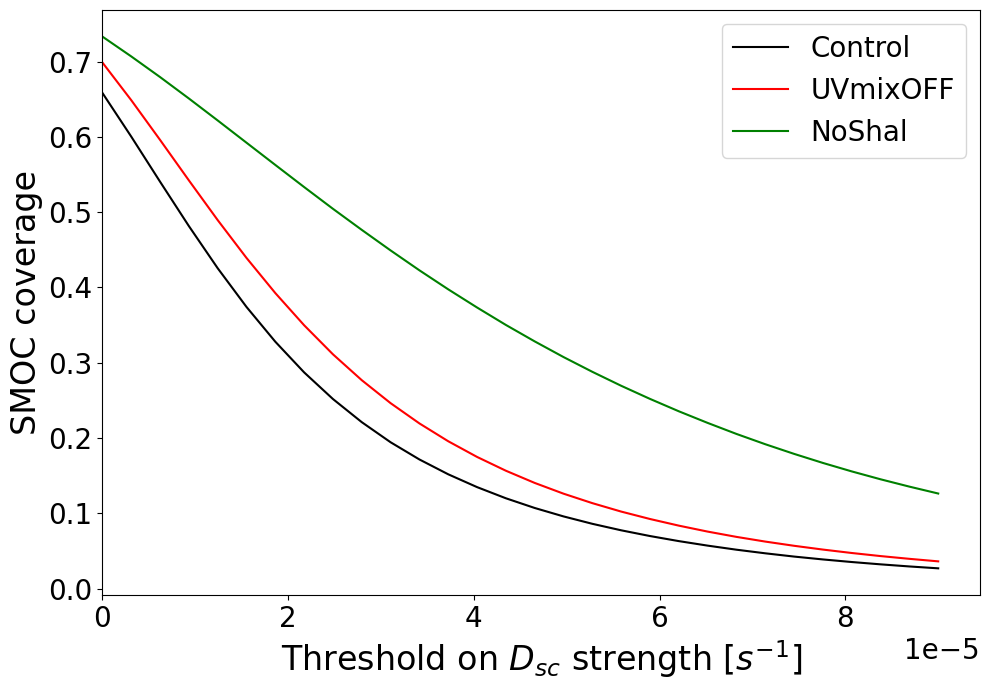

In [58]:
#%% SMOC coverage sensitivity to strength
plt.figure()
for ide,exp in enumerate(exps): 
    smoc_sensitivity[exp]['smoc_coverage'].mean('time').plot(x='thresh_div',label=lab[ide],c=col[ide])
# plt.xscale('log')
plt.xlim([0,None])
plt.legend(fontsize=20)
plt.xlabel(r'Threshold on $D_{sc}$ strength [$s^{-1}$]')
plt.ylabel(r'SMOC coverage')
plt.tight_layout()
plt.savefig(figure_dir+'smoc_sensitivity_to_Thresh.pdf')


KeyboardInterrupt: 

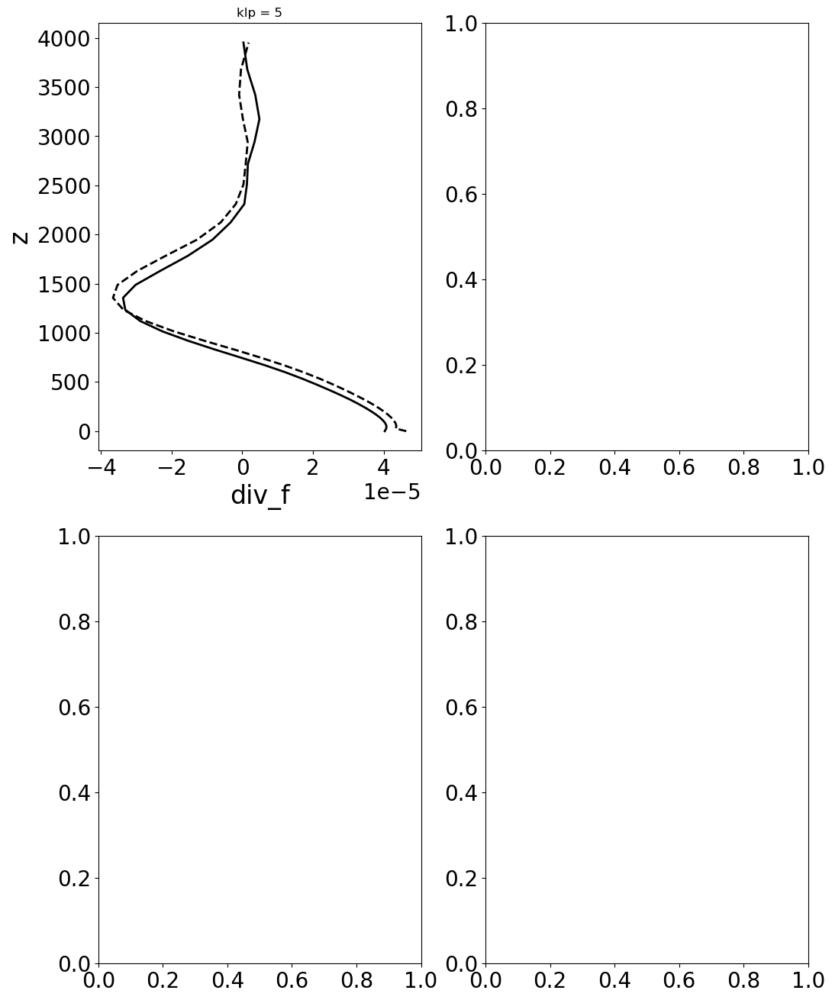

In [32]:
#%% Divergence profiles grouped
fig, axs = plt.subplots(2,2,figsize=(12,16))
for idx, var in enumerate(['smoc_conv','smoc_dive']):
    for ide, exp in enumerate(exps[1:]):
        ## first plot the control 
        # select only cloudy pixels 
        (-filtered[exps[0]]['div_f']).where(filtered[exps[0]]['time'].isin(time_g1[group][exp]))\
            .where(harm3d[exps[0]]['cc_1_5km']>0).where(filtered[exps[0]][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ls='-',c=col[0],ax=axs[idx,ide],label=lab[0])
        (-filtered[exps[0]]['div_f']).where(filtered[exps[0]]['time'].isin(time_g2[group][exp]))\
            .where(harm3d[exps[0]]['cc_1_5km']>0).where(filtered[exps[0]][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ls='--',c=col[0],ax=axs[idx,ide],label=lab[0])        
        ## then the experiments
        (-filtered[exp]['div_f']).where(filtered[exp]['time'].isin(time_g1[group][exp]))\
            .where(harm3d[exp]['cc_1_5km']>0).where(filtered[exp][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ls='-',c=col[ide+1],label='CC '+exps[ide+1][24:]+' > ctrl',ax=axs[idx,ide])
        (-filtered[exp]['div_f']).where(filtered[exp]['time'].isin(time_g2[group][exp]))\
            .where(harm3d[exp]['cc_1_5km']>0).where(filtered[exp][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
            .plot(y='z',lw=2,ls='--',c=col[ide+1],label='CC '+exps[ide+1][24:]+' < ctrl',ax=axs[idx,ide])

        ## first plot the control 
        # # sleect all SMOCs
        # (-filtered[exps[0]]['div_f']).where(filtered[exps[0]]['time'].isin(time_g1[group][exp]))\
        #     .where(filtered[exps[0]][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
        #     .plot(y='z',lw=2,ls='-',c=col[0],ax=axs[idx,ide],label=lab[0])
        # (-filtered[exps[0]]['div_f']).where(filtered[exps[0]]['time'].isin(time_g2[group][exp]))\
        #     .where(filtered[exps[0]][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
        #     .plot(y='z',lw=2,ls='--',c=col[0],ax=axs[idx,ide],label=lab[0])
        # ## then the experiments
        # (-filtered[exp]['div_f']).where(filtered[exp]['time'].isin(time_g1[group][exp]))\
        #     .where(filtered[exp][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
        #     .plot(y='z',lw=2,ls='-',c=col[ide+1],label='CC '+exps[ide+1][24:]+' > ctrl',ax=axs[idx,ide])
        # (-filtered[exp]['div_f']).where(filtered[exp]['time'].isin(time_g2[group][exp]))\
        #     .where(filtered[exp][var]>0).sel(klp=5,z=slice(0,4000)).mean(('x','y','time'))\
        #     .plot(y='z',lw=2,ls='--',c=col[ide+1],label='CC '+exps[ide+1][24:]+' < ctrl',ax=axs[idx,ide])
        
        ##
        axs[idx,ide].set_ylim([0,4000])
        axs[idx,ide].set_yticks([]) 
        axs[idx,ide].set_ylabel('')
        axs[idx,ide].set_xlabel('')
        axs[idx,ide].axvline(0, color='grey', linestyle='-', linewidth=0.5)
        axs[idx,ide].axhspan(sc_layer_base, sc_layer_top, alpha=0.1, color='grey')
        axs[idx,ide].axhspan(c_layer_base, c_layer_top, alpha=0.1, color='grey')
        axs[idx,ide].set_title('')
        axs[idx,ide].spines['top'].set_visible(False)
        axs[idx,ide].spines['right'].set_visible(False)

    axs[idx,0].set_ylabel('Height (m)')
    axs[idx,0].set_yticks([500,1500,2500,3500]) 
    
axs[1,0].set_xlabel(r'Divergence ($s^{-1}$)')
axs[1,1].set_xlabel(r'Divergence ($s^{-1}$)')
axs[0,0].legend(fontsize=16)
axs[0,1].legend(fontsize=16)
plt.suptitle('Divergence profile where cloudy above a smoc')
plt.tight_layout()
plt.savefig(figure_dir+'divergence_profiles.pdf')
    

In [80]:
## use these objects as a cloud mask for cloudmetrics 
threshold_div = 0.1e-4 ## threshold for subcloud layer convergence and divergence.
for exp in exps:
    ## identify dipols / smocs
    filtered[exp]['smoc'] = ((filtered[exp]['Dsc']/filtered[exp]['Dc'])<0)\
                        .where(abs(filtered[exp]['Dsc'])>threshold_div,other=0)

In [1]:
## find outline of clouds for 'snap_time' 
crossxz = harm3d[exp].sel(z=slice(0,4000)).sel(y=100*1000 +min(harm3d[exp].y).values,time='2020-01-17T12')
crossyz = harm3d[exp].sel(z=slice(0,4000)).sel(x=50*1000 +min(harm3d[exp].x).values,time='2020-02-11T05')
for section in ['xz','yz']:
    if section =='xz':
        mask = np.nan_to_num(crossxz['cl'].where(crossxz['cl']>0.5))
    if section =='yz':
        mask = np.nan_to_num(crossyz['cl'].where(crossyz['cl']>0.5))
    mask[mask > 0] = 3
    kernel = np.ones((4,4))
    C      = ndi.convolve(mask, kernel, mode='constant', cval=0)
    outer  = np.where( (C>=3) & (C<=12 ), 1, 0)
    # add variable cloud contour
    # works only for 1 time stamp 
    if section =='xz':
        crossxz['cloud'] = (('z', 'x'), outer)
    if section =='yz':
        crossyz['cloud'] = (('z', 'y'), outer)
crossxz['x']=filtered[exp]['y'].values

NameError: name 'harm3d' is not defined

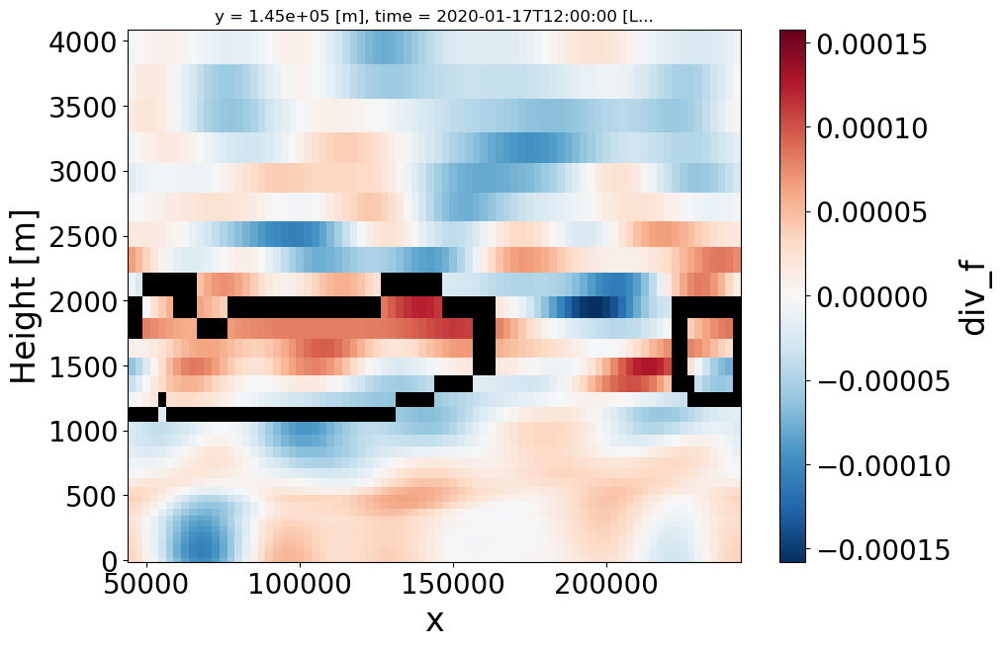

In [121]:
#%% Cross section of cloud and divergence
plt.figure()
filtered[exp].sel(z=slice(0,4000)).sel(x=100*1000 +min(filtered[exp].x).values,time='2020-01-17T12',klp=klp)['div_f'].plot()
crossxz['cloud'].where(crossxz['cloud'] > 0).plot(cmap='binary',\
                                add_colorbar=False,vmin=0,vmax=0.5)

In [131]:
#%% Moisture budget at the surface
factor_pr = 3600 *(24/0.0346)
Lv      =   2.53e6        # J/kg
area_med = 1000*(domain_med*domain_med) # m^2
rho = calc_rho(harm_srf_med[exp]['ps'],harm_srf_med[exp]['tos'],harm_srf_med[exp]['huss']) #kg/m^3
#
qu_flx = rho * harm_srf_med[exp]['huss'] * harm_srf_med[exp]['uas']  # m/s
qv_flx = rho * harm_srf_med[exp]['huss'] * harm_srf_med[exp]['vas']
dqu_dx = qu_flx.isel(x=-1).sum('y') - qu_flx.isel(x=0).sum('y')
dqv_dy = qv_flx.isel(y=-1).sum('x') - qu_flx.isel(y=0).sum('x')
## 
P = harm_srf_med[exp]['pr'].mean(('x','y')) * factor_pr   # W m^{-2}
E = harm_srf_med[exp]['hfls'].mean(('x','y'))             # W m^{-2} 
h_moist_div = Lv * (dqu_dx + dqv_dy) / area_med           # W m^{-2}
v_moist_div = 100 #vertical velocity at the surface is zero!
storage = harm_srf_med[exp]['huss'].mean(('x','y')).diff('time',label='upper') * step**-1
diffusion = E - P - h_moist_div - v_moist_div - storage # as residual 

# ######
# #%% Moisture budget at 1st level
# factor_pr = 3600 *(24/0.0346)
# Lv      =   2.53e6        # J/kg
# area_sml = 1000*(domain_sml*domain_sml) # m^2
# rho = calc_rho(harm3d[exp]['p'],harm3d[exp]['ta'],harm3d[exp]['hus']) #kg/m^3
# #
# u  = harm2d[exp]['u']
# v  = harm2d[exp]['v']
# w  = harm2d[exp]['wa']
# qt = harm2d[exp]['qt']

# #
# qu_flx = rho * qt * u  # 
# qv_flx = rho * qt * v
# qw_flx = rho * qt * w
# dqu_dx = qu_flx.isel(x=-1).sum('y') - qu_flx.isel(x=0).sum('y')
# dqv_dy = qv_flx.isel(y=-1).sum('x') - qu_flx.isel(y=0).sum('x')
# dqw_dz = qw_flx.diff('z').sum(('x','y'))
# ## 
# P = harm2d[exp]['rain'] * factor_pr                   # W m^{-2}
# # E = harm3d[exp]['hfls'].mean(('x','y'))             # W m^{-2} 
# h_moist_div = Lv * (dqu_dx + dqv_dy) /area_sml          # W m^{-2}
# v_moist_div = Lv * dqw_dz /area_sml                     # W m^{-2}
# storage = qt.diff('time',label='upper') * step**-1
# diffusion = E - P - h_moist_div - v_moist_div - storage # as residual 
# diff_evap = - P - h_moist_div - v_moist_div - storage # as residual 

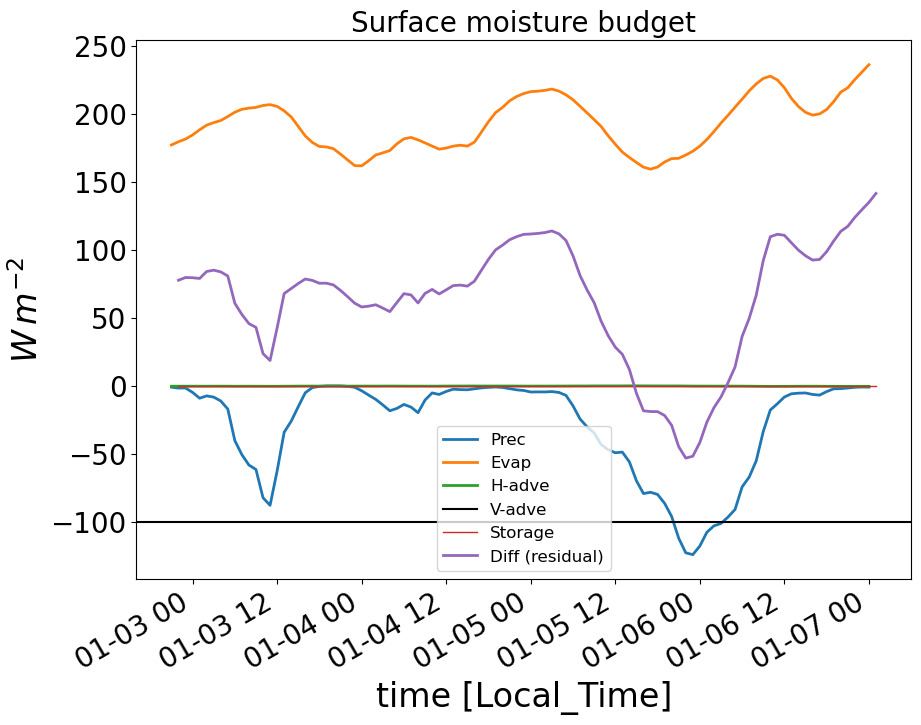

In [132]:
#%% Plot Moisture budget at the surface
time_sel = 100
plt.figure()
###### surface 
(-P).isel(time=slice(0,time_sel)).plot(lw=2,label='Prec')
E.isel(time=slice(0,time_sel)).plot(lw=2,label='Evap')
(-h_moist_div).isel(time=slice(0,time_sel)).plot(lw=2,label='H-adve')
plt.axhline(-v_moist_div,label='V-adve',c='k')
# (-v_moist_div).isel(time=slice(0,time_sel)).plot(lw=2,label='V-adve')
storage.isel(time=slice(0,time_sel)).plot(lw=1,label='Storage')
diffusion.isel(time=slice(0,time_sel)).plot(lw=2,label='Diff (residual)')

###### surface 
# (-P).isel(z=0).isel(time=slice(0,time_sel)).plot(lw=2,label='Prec')
# E.isel(time=slice(0,time_sel)).plot(lw=2,label='Evap')
# (-h_moist_div).isel(z=0).isel(time=slice(0,time_sel)).plot(lw=2,label='H-adve')
# (-v_moist_div).isel(z=0).isel(time=slice(0,time_sel)).plot(lw=2,c='k',label='V-adve')
# # (-v_moist_div).isel(time=slice(0,time_sel)).plot(lw=2,label='V-adve')
# storage.isel(z=0).isel(time=slice(0,time_sel)).plot(lw=1,label='Storage')
# diff_evap.isel(z=0).isel(time=slice(0,time_sel)).plot(lw=2,label='Diff+evap (residual)')

plt.ylabel(r'$W \, m^{-2}$')
plt.title('Surface moisture budget',fontsize=20)
plt.legend()

In [127]:
list(cat.barbados.bco)
# bco_radar = cat.barbados.bco.radar_reflectivity.to_dask()
# bco_meteo = cat.barbados.bco.meteorology.to_dask()
# bco_meteo
bco_radar

<xarray.Dataset>
Dimensions:     (time: 2037350, range: 605)
Coordinates:
  * range       (range) float64 155.9 187.1 218.2 ... 1.896e+04 1.899e+04
  * time        (time) datetime64[ns] 2020-01-12T16:19:26 ... 2020-02-29T23:5...
Data variables: (12/23)
    HSDco       (time, range) float32 dask.array<chunksize=(63668, 19), meta=np.ndarray>
    HSDcx       (time, range) float32 dask.array<chunksize=(63668, 19), meta=np.ndarray>
    LDR         (time, range) float32 dask.array<chunksize=(63668, 19), meta=np.ndarray>
    LDRg        (time, range) float32 dask.array<chunksize=(63668, 19), meta=np.ndarray>
    MeltHei     (time) float32 dask.array<chunksize=(127335,), meta=np.ndarray>
    RMS         (time, range) float32 dask.array<chunksize=(63668, 19), meta=np.ndarray>
    ...          ...
    longitude   (time) float64 dask.array<chunksize=(63668,), meta=np.ndarray>
    mask        (time, range) int8 dask.array<chunksize=(63668, 38), meta=np.ndarray>
    northangle  (time) float32 dask.array<chunksize=(127335,), meta=np.ndarray>
    status      (time) float32 dask.array<chunksize=(127335,), meta=np.ndarray>
    tpow        (time) float32 dask.array<chunksize=(127335,), meta=np.ndarray>
    zenith      (time) float32 dask.array<chunksize=(127335,), meta=np.ndarray>
Attributes: (12/16)
    Altitude:        11 m
    Conventions:     CF-1.7
    DOI:             10.25326/55
    contact_person:  Lutz Hirsch (lutz.hirsch@mpimet.mpg.de)
    created_with:    mmclx_to_netcdf_OOP.py with its last modification on Sat...
    creation_date:   Sun Mar  1 07:21:58 2020
    ...              ...
    python_version:  3.6.9 |Anaconda, Inc.| (default, Jul 30 2019, 19:07:31) ...
    reference:       Ka Band Cloud Radar MIRA-3x, METEK GmbH www.metek.de
    source:          /pool/OBS/BARBADOS_CLOUD_OBSERVATORY/Level_1/B_Reflectiv...
    system:          MIRA36
    title:           MIRA-3x Cloud Radar Data
    version:         1.1.1-434-g3e3deca

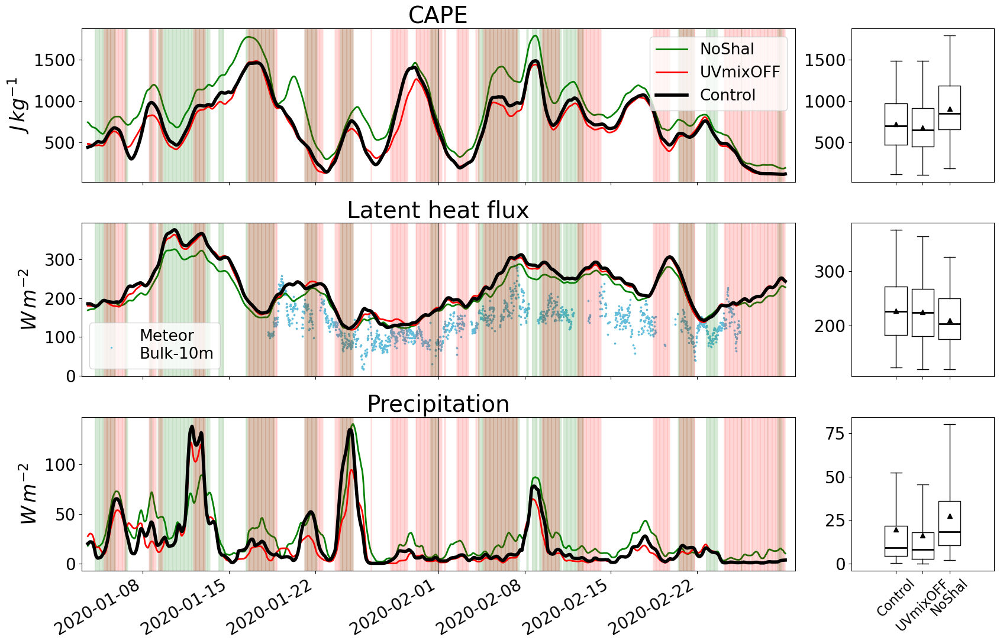

In [128]:
#%% Surface fluxes and precipitation 
bottom, top = 0.1, 0.9
left, right = 0.01, 0.9
fig, axs = plt.subplots(3,2,figsize=(17,11), gridspec_kw={'width_ratios': [5,1]})
fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, \
                    hspace=0.15, wspace=0.1)
iteration = 1.2
labels = []
for ide, exp in reversed(list(enumerate(exps))):
    if exp == exps[0]:
        line =4
    else:
        line =2
    iteration -=0.3
    label = lab[ide]  # Get the label from the 'lab' array
    labels.append(label)  # Append the label to the list
    for idx,var in enumerate(['cape','hfls','pr']):
        if var =='pr':
            factor = 3600 *(24/0.0346)
            title  = 'Precipitation'
            # unit   = r'$mm \, hour^{-1}$'
            unit   = r'$W \, m^{-2}$'
        elif var =='hfls':
            factor = 1
            title  = 'Latent heat flux'
            unit   = r'$W \, m^{-2}$'
            ## plot bulk LHF from meteor
            # meteor_flx['LHF_bulk_bow'].plot.scatter(ax=axs[idx,0],c=col_obs[1])
            axs[idx,0].scatter(meteor_flx.time,meteor_flx['LHF_bulk_bow'],c=col_obs[1],s=2,label=r'Meteor'+"\n"+'Bulk-10m')
        
        elif var =='hfss':
            factor = 1
            title  = 'Sensible heat flux'
            unit   = r'$W \, m^{-2}$'
        elif var =='cape':
            factor = 1
            title  = 'CAPE'
            unit   = r'$J \, kg^{-1}$'
        else: 
            factor =1
            title =  var
            unit = '?'

        (factor*harm_srf_med_synopt[exp][var])\
                .plot(x='time',ls='-',ax=axs[idx,0],lw=line,c=col[ide],label=lab[ide])

        if exp in time_g1['delta_cc']:
            for ii in time_g2['delta_cc'][exp].values:
                axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)
        
        axs[idx,0].set_title(title,fontsize =28)
        axs[idx,0].set_ylabel(unit)
    ## boxplots    
        filtered_data = (factor*harm_srf_med_synopt[exp][var])\
                .where(~harm_srf_med_synopt[exp][var].isnull().compute(),drop=True).values

        axs[idx,1].boxplot(filtered_data,\
                    positions=[round(iteration,1)],\
            whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.25,\
                medianprops=dict(color="k", lw=2),\
                meanprops={"markerfacecolor":"black",'markeredgecolor':'black'})  

axs[idx,1].set_xticklabels(labels, rotation=45 )
axs[idx,1].tick_params(axis='x', which='major', labelsize=16)
axs[idx,1].set_ylabel('')
for idx,var in enumerate(axs): 
    axs[idx,0].axvline(np.datetime64('2020-02-01T00'), color='k', linestyle='-', linewidth=0.5)
    axs[idx,0].set_xlim((srt_time,end_time))
    axs[idx,0].set_xlabel(r'')
    axs[idx,1].set_xlabel(r'')
    
axs[0,0].tick_params(labelbottom=False) 
axs[1,0].tick_params(labelbottom=False) 
axs[0,1].tick_params(labelbottom=False) 
axs[1,1].tick_params(labelbottom=False) 
axs[0,0].legend(fontsize=19)
axs[1,0].legend(['Meteor'+"\n"+'Bulk-10m',],fontsize=19)
plt.tight_layout()
plt.savefig(figure_dir+'tmser_srf_obs.pdf')

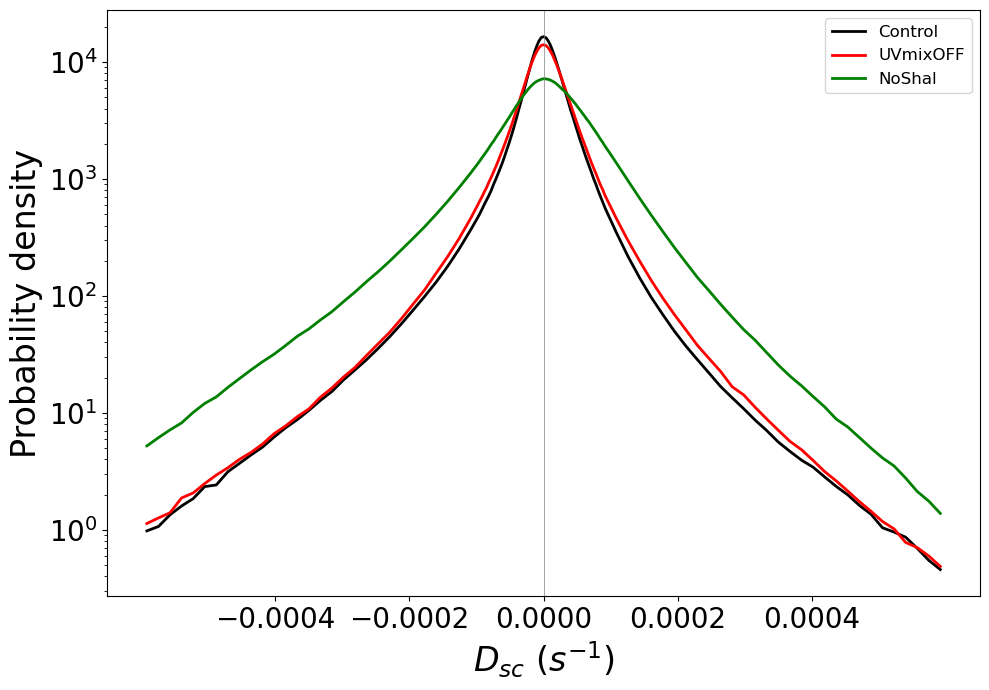

In [158]:
var = 'Dsc'
# bins = np.linspace(-0.0004, 0.0004,100)
bins = np.concatenate([
    np.linspace(-0.0006, -0.0001, 30),
    np.linspace(-0.0001, 0.0001, 60)[1:-2],
    np.linspace(0.0001, 0.0006, 30)
])
plt.figure()
for ide,exp in enumerate(exps):
    h = histogram(filtered[exp][var].isel(time=slice(0,-1)), bins=[bins],density=True)
    # display(h)
    h.plot(color=col[ide],lw=2,label=lab[ide])
plt.axvline(0,c='grey',lw=0.5)
plt.xticks(np.linspace(-0.0004, 0.0004, 5))
plt.xlabel(r'$D_{sc}$ ($s^{-1}$)')
plt.ylabel(r'Probability density')

plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.savefig(figure_dir+'Dsc_PDF.pdf')


KeyboardInterrupt: 

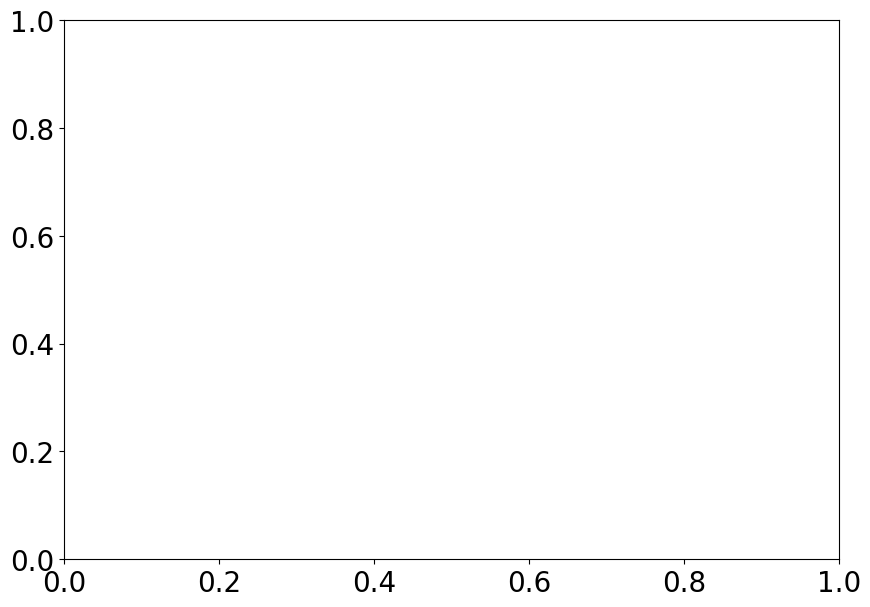

In [28]:
#%% Histogram of conv/dive smocs below a cloud
# what is the percentage of cloudy pixel that are above a converging / diverging smoc? 
# Plot the histogram
from matplotlib.ticker import MaxNLocator, FuncFormatter
var_cloud ='1'
fig, ax = plt.subplots()
for ide,exp in enumerate(exps): 
    ## diverging
    counts, edges, patches = ax.hist(harm2d[exp][var_cloud+'cl_frac_on_dive'], bins=25,facecolor='none')
    # Plot a line connecting the tops of the bars
    bin_centers = 0.5 * (edges[:-1] + edges[1:])
    scaled_counts = counts / len(harm2d[exp].time)  # Scale y-axis values by total number of occurences
    ax.plot(bin_centers, scaled_counts, linestyle='-', color=col[ide],label=lab[ide]+' - Diverging')
    # Add a squared mark at the bottom indicating the mean for diverging
    mean_diverging = np.mean(harm2d[exp][var_cloud+'cl_frac_on_dive'])
    ax.plot(mean_diverging, 0, marker='s',  markersize=10,linestyle='None', color=col[ide])
    
    ## converging 
    counts, edges, patches = ax.hist(harm2d[exp][var_cloud+'cl_frac_on_conv'], bins=25,facecolor='none')
    # Plot a line connecting the tops of the bars
    bin_centers = 0.5 * (edges[:-1] + edges[1:])
    scaled_counts = counts / len(harm2d[exp].time)  # Scale y-axis values by total number of occurences
    ax.plot(bin_centers, scaled_counts, linestyle='--', color=col[ide],label=lab[ide]+' - Converging')
    # Add a squared mark at the bottom indicating the mean for converging
    mean_converging = np.mean(harm2d[exp][var_cloud+'cl_frac_on_conv'])
    ax.plot(mean_converging, 0, marker='s', markersize=10,linestyle='None',mfc='none', color=col[ide])
    
# Add a vertical black line at x=0.5
ax.axvline(x=0.5, color='black', linestyle='-', linewidth=0.5)
ax.set_xlim(0, 1)
# Set the y-axis ticks and format tick labels to display 2 decimals
ax.yaxis.set_major_locator(MaxNLocator(nbins=5, prune='both'))
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.2f}'.format(x)))
#
ax.set_ylim(0, 0.18)
# ax.set_title('% of cloudy areas above a smoc',fontsize = 20)
ax.set_xlabel('% of cloudy areas above a smoc')
ax.set_ylabel('Probability of occurrence')
ax.legend()
plt.tight_layout()
plt.savefig(figure_dir+'probab_cl_on_smoc.pdf')
plt.close()

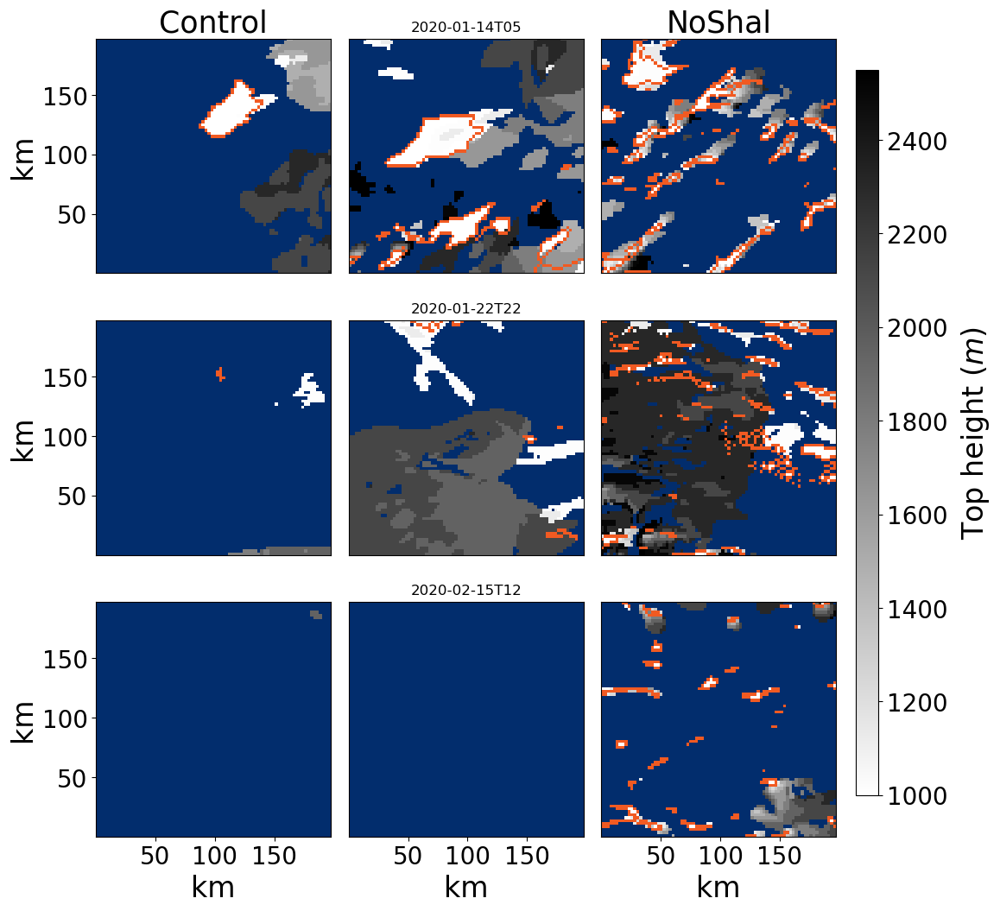

In [2]:
#%% aereal snapshot
# idtime= filtered[exp].time[15]
klp=5
iz =200 # m
var_shade= 'cc_1km'
# var= 'u_pf'
# var= 'ua_p'
var ='Dsc'
var ='cl_top'
if var == 'Dsc':
    vmin_ = -0.00015
    vmax_ = - vmin_
    cmap_='coolwarm'
else:
    vmin_ = 1000
    vmax_ = 2550
    cmap_ = 'binary'
    
ticklabels= np.array([50,100,150]) # in km 

name_ext = 'group_2'

fig, axs = plt.subplots(3,3,figsize=(13,12))
plt.subplots_adjust(right=0.8,wspace=0.001)
# for idt, sel_time in enumerate([np.datetime64('2020-01-07T22'),np.datetime64('2020-01-17T12'),np.datetime64('2020-02-11T05')]):
for idt, sel_time in enumerate([np.datetime64('2020-01-14T05'),np.datetime64('2020-01-22T22'),np.datetime64('2020-02-15T12')]):

    for ide,exp in enumerate(exps):   
        # Extract the 'cloud_mask' variable as a numpy array
        if var_shade == 'cc_conv':
            cloud_mask = (harm3d[exp]['cc_4km']-harm3d[exp]['cc_1to4km']).sel(time=sel_time).values
        else: 
            cloud_mask = harm3d[exp].sel(time=sel_time)[var_shade].values
        # Find connected components in the cloud_mask
        labels = measure.label(cloud_mask, connectivity=2)  # Assuming 8-connectivity
        # Create an empty array for the outline mask
        outline_mask = np.zeros_like(cloud_mask, dtype=bool)
        # Iterate through each connected component and find its boundary pixels
        for label in range(1, labels.max() + 1):
            component_mask = labels == label
            contour = measure.find_contours(component_mask, 0.8)
            # Add the boundary pixels to the outline mask
            for points in contour:
                outline_mask[np.round(points[:, 0]).astype(int), np.round(points[:, 1]).astype(int)] = True 
        
        if var in harm3d[exp]:
            axs[idt,ide].set_facecolor((2/255, 45/255, 109/255))
            if harm3d[exp][var].ndim == 3:
                background = harm3d[exp].sel(time=sel_time)[var].values
            else: 
                background = harm3d[exp].sel(z=iz,method='nearest').sel(time=sel_time)[var].values            
        elif var in filtered[exp]:   
            if filtered[exp][var].ndim == 4:
                ### Convert from Divegence to Convergence adding a minus sign
                background = - filtered[exp].where(filtered[exp].smoc).sel(klp=klp,time=sel_time)[var].values 
            else:
                background = filtered[exp].sel(z=iz,method='nearest').sel(klp=klp,time=sel_time)[var].values
        im = axs[idt,ide].imshow(background,cmap=cmap_,vmin=vmin_,vmax=vmax_, origin='lower',\
                extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
            
        # Set the alpha channel of outline_mask
        outline_mask_rgba = np.zeros((outline_mask.shape[0], outline_mask.shape[1], 4), dtype=np.uint8)
        if var == 'cl_top':
            outline_mask_rgba[..., :3] = [241, 90, 34]  # Set RGB to orange where True
        outline_mask_rgba[..., 3] = outline_mask * 255  # Set alpha to 255 (fully opaque) where True
        # Plot the outline with alpha blending
        axs[idt,ide].imshow(outline_mask_rgba, origin='lower',\
                    extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
        # plot the shading 
        if var == 'Dsc':
            axs[idt,ide].imshow(cloud_mask,cmap='binary', origin='lower',alpha=0.4,\
                    extent=[harm3d[exp].x.min(), harm3d[exp].x.max(), harm3d[exp].y.min(), harm3d[exp].y.max()])
            
        axs[idt,ide].set_aspect('equal', adjustable='box')
        axs[idt,ide].set_title('')
        if idt == 0:
            axs[idt,ide].set_title(lab[ide],fontsize =25)
        ## x
        axs[idt,ide].set_xlabel('')
        axs[idt,ide].set_xticks([])
        if idt == 2:
            axs[idt,ide].set_xlabel('km')
            axs[idt,ide].set_xticks(ticklabels*1000 +min(harm3d[exp].x).values)
            axs[idt,ide].set_xticklabels(ticklabels)
        ## y
        axs[idt,ide].set_ylabel('')
        axs[idt,ide].set_yticks([])
    axs[idt,0].set_yticks(ticklabels*1000 +min(harm3d[exp].y).values)
    axs[idt,0].set_yticklabels(ticklabels)
    axs[idt,0].set_ylabel('km')
    axs[idt,1].set_title(str(sel_time))
if var in filtered[exp]:  
    cbar_ax = fig.add_axes([0.81, 0.15, 0.02, 0.7])  # Adjust the position and size as needed
    cbar =fig.colorbar(im, cax=cbar_ax, orientation='vertical',format='%.1e')
    cbar.set_label(r'$D_{sc}$', labelpad=10) 
else:  
    cbar_ax = fig.add_axes([0.81, 0.15, 0.02, 0.7])  # Adjust the position and size as needed
    cbar =fig.colorbar(im, cax=cbar_ax, orientation='vertical')
    cbar.set_label(r'Top height ($m$)', labelpad=10) 

# plt.suptitle(str(sel_time),fontsize =28)
# plt.tight_layout()
# plt.savefig(figure_dir+'snapshots_'+var+name_ext+'.pdf')


/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


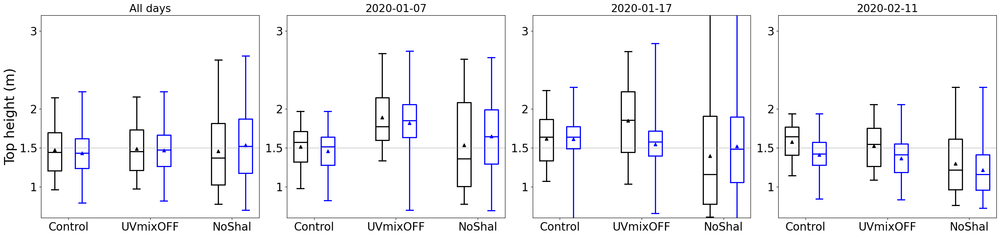

In [31]:
#%% Cloud top distribution as boxplots
# sel_time = harm_obj[exp].time ## to select all times 

# Create a boxplot
fig, axs = plt.subplots(2,3,figsize=(25,6))

# Set numerical positions
positions = [1,4,7,]  # You can adjust this position as needed
pos = []
for element in positions:
    pos.append(element + 0.5)

for idt, sel_time in enumerate(['2020','2020-01-07','2020-01-17','2020-02-11']):
    
    for ide, exp in enumerate(exps):
        for idx, temp_hist in enumerate([harm_obj[exp].sel(time=sel_time).mean('time'), harm_srf_sml[exp].sel(time=sel_time).mean('time')]):

            axs[idt].bxp([{'label': lab[ide],
                    'mean': temp_hist['mean_cl_top'],
                    'whishi': temp_hist['max_cl_top'],
                    'whislo': temp_hist['min_cl_top'],
                    'q1': temp_hist['q1_cl_top'],
                    'med': temp_hist['q2_cl_top'],
                    'q3': temp_hist['q3_cl_top']},],
                    vert=True,
                    showfliers= False,
                    showmeans = True,
                    positions = [positions[ide]+idx],
                    widths = 0.5,
                    whiskerprops = dict(linestyle='-', linewidth=2, color=['black','blue'][idx]),
                    capprops = dict(linestyle='-', linewidth=2, color=['black','blue'][idx]),
                    medianprops = dict(linestyle='-', linewidth=2, color=['black','blue'][idx]),
                    boxprops = dict(linestyle='-', linewidth=2, color=['black','blue'][idx]),
                    meanprops = {"markerfacecolor":['black','blue'][idx],'markeredgecolor':['black','blue'][idx]})
    

    # Set custom labels for the positions
    axs[idt].axhline(1500, color='grey', linestyle='-', linewidth=0.5)
    axs[idt].set_xticks(pos)
    axs[idt].set_xticklabels(lab)
    axs[idt].set_ylim([600,3200])
    axs[idt].set_title(sel_time,fontsize=19)
    if sel_time == '2020':
        axs[idt].set_title('All days',fontsize=19)
    axs[idt].set_yticks([1000,1500,2000,3000])
    axs[idt].set_yticklabels([1,1.5,2,3])
axs[0].set_ylabel('Top height (m)')
# plt.suptitle('Distribution of cloud top and grid-box top')
#     plt.savefig(figure_dir+'cl_top_ditrib'+sel_time+'.pdf')
plt.tight_layout()
plt.savefig(figure_dir+'cl_top_distrib.pdf')

(0.0, 23.0)

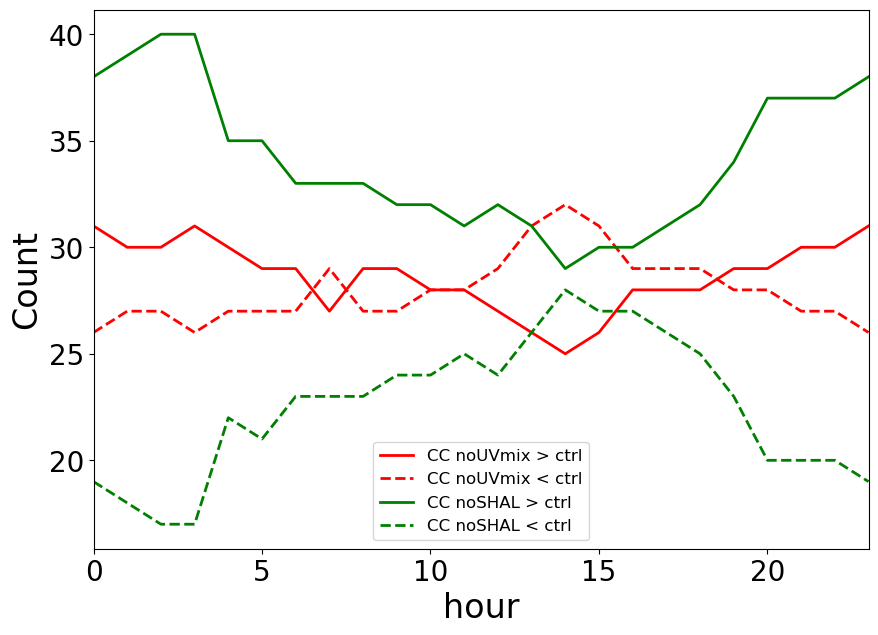

In [26]:
#%% time distribution in groups
group = 'delta_cc'

plt.figure()
for ide, exp in enumerate(exps[1:]):
    time_g1[group][exp].groupby('time.hour').count().plot(lw=2,ls='-',c=col[ide+1],\
                                                         label='CC '+exps[ide+1][24:]+' > ctrl')
    time_g2[group][exp].groupby('time.hour').count().plot(lw=2,ls='--',c=col[ide+1],
                                                         label='CC '+exps[ide+1][24:]+' < ctrl')
    
plt.legend()
plt.ylabel('Count')
plt.xlim([0,23])


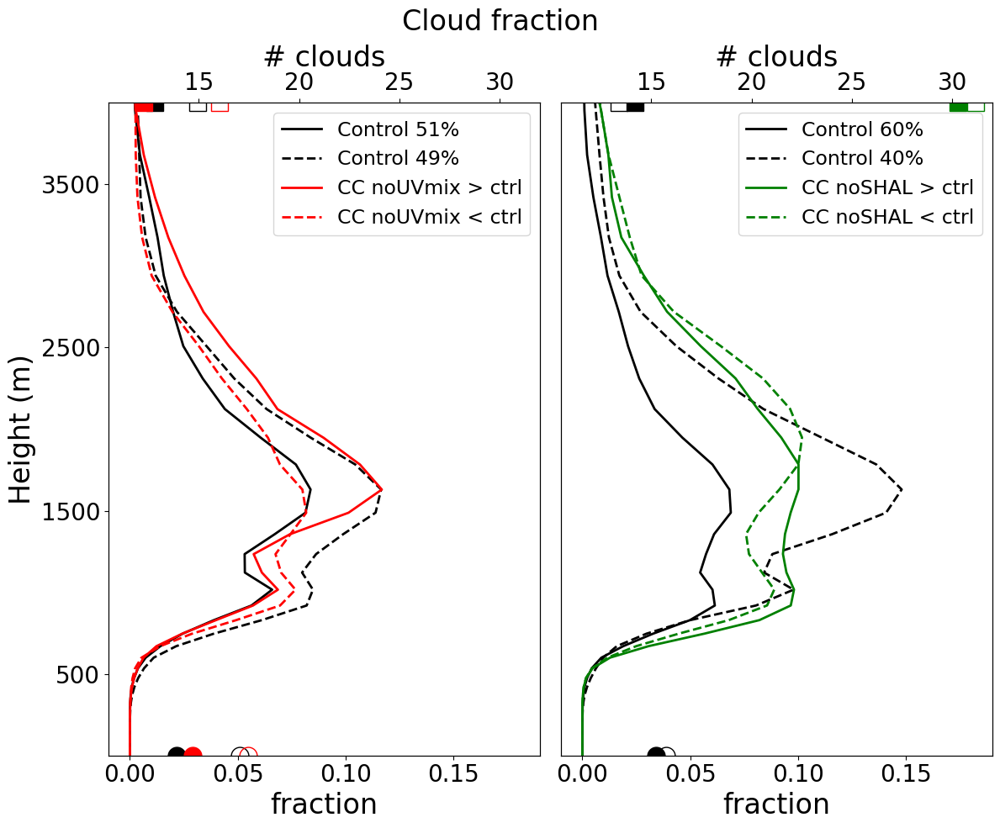

In [27]:
#%% Cloud fraction profiles by cloud cover
group = 'delta_cc'
var = 'cl'
fig, axs = plt.subplots(1,2,figsize=(12,10))

for ide, exp in enumerate(exps[1:]):
    ## first plot the control 
    harm2d[exps[0]][var].where(harm2d[exps[0]]['time'].isin(time_g1[group][exp])).mean('time').plot(y='z',lw=2,ls='-',\
                                                c=col[0],ax=axs[ide],\
            label=lab[0]+' '+ str(round(100*len(time_g1[group][exp])/(len(ds_org_4km_synopt[exp].time)-31)))+'% ')
    harm2d[exps[0]][var].where(harm2d[exps[0]]['time'].isin(time_g2[group][exp])).mean('time').plot(y='z',lw=2,ls='--',\
                                                c=col[0],ax=axs[ide],\
           label=lab[0]+' '+ str(round(100*len(time_g2[group][exp])/(len(ds_org_4km_synopt[exp].time)-31)))+'% ')
    
    # then the 2 experimants
    harm2d[exp][var].where(harm2d[exp]['time'].isin(time_g1[group][exp])).mean('time').plot(y='z',lw=2,ls='-',\
                                                c=col[ide+1],label='CC '+exps[ide+1][24:]+' > ctrl',ax=axs[ide])
    
    harm2d[exp][var].where(harm2d[exp]['time'].isin(time_g2[group][exp])).mean('time').plot(y='z',lw=2,ls='--',\
                                                c=col[ide+1],label='CC '+exps[ide+1][24:]+' < ctrl',ax=axs[ide])
    ax2 = axs[ide].twiny()
    # Plot mean number of objects CC_4km
    ## first the control 
    temp1 = ds_org_4km[exps[0]]['num_objects'].sel(time=time_g1[group][exp]).mean('time').values
    temp2 = ds_org_4km[exps[0]]['num_objects'].sel(time=time_g2[group][exp]).mean('time').values
    ax2.plot(temp1,4000,marker='s', linestyle='None',\
                                       markersize=15, c=col[0])
    ax2.plot(temp2,4000,marker='s', linestyle='None',\
                                       markersize=15,mfc='none', mec=col[0])
    ## then the experiments 
    temp1 = ds_org_4km[exp]['num_objects'].sel(time=time_g1[group][exp]).mean('time').values
    temp2 = ds_org_4km[exp]['num_objects'].sel(time=time_g2[group][exp]).mean('time').values
    ax2.plot(temp1,4000,marker='s', linestyle='None',\
                                       markersize=15, c=col[ide+1])
    ax2.plot(temp2,4000,marker='s', linestyle='None',\
                                       markersize=15,mfc='none', mec=col[ide+1])
#     # Plot mean number of objects CC_1.5km
#     ## first the control 
#     temp1 = ds_org_1_5km[exps[0]]['num_objects'].sel(time=time_g1[group][exp]).mean('time').values
#     temp2 = ds_org_1_5km[exps[0]]['num_objects'].sel(time=time_g2[group][exp]).mean('time').values
#     ax2.plot(temp1,0,marker='o', linestyle='None',\
#                                        markersize=15, c=col[0])
#     ax2.plot(temp2,0,marker='o', linestyle='None',\
#                                        markersize=15,mfc='none', mec=col[0])
#     ## then the experiments 
#     temp1 = ds_org_1_5km[exp]['num_objects'].sel(time=time_g1[group][exp]).mean('time').values
#     temp2 = ds_org_1_5km[exp]['num_objects'].sel(time=time_g2[group][exp]).mean('time').values
#     ax2.plot(temp1,0,marker='o', linestyle='None',\
#                                        markersize=15, c=col[ide+1])
#     ax2.plot(temp2,0,marker='o', linestyle='None',\
#                                        markersize=15,mfc='none', mec=col[ide+1])
    
    # Customize the secondary x-axis
    ax2.set_xlabel('# clouds')
    ax2.set_xlim((10.5,32))
    axs[ide].set_ylim([0,4000])
    axs[ide].set_xlim([-0.01,0.19])
    axs[ide].set_yticks([]) 
    axs[ide].set_ylabel('')
    axs[ide].set_xlabel('fraction')

                
axs[0].set_ylabel('Height (m)')
axs[0].set_yticks([500,1500,2500,3500]) 

axs[0].legend(fontsize=17)
axs[1].legend(fontsize=17)
plt.suptitle('Cloud fraction')
plt.tight_layout()
plt.savefig(figure_dir+'cl_frac_by_cover.pdf')

In [1]:
#%% Wind profiles by cloud cover
layer=[0,200]
group = 'delta_cc'
fig, axs = plt.subplots(2,5,figsize=(19,14))
# for idx,var in enumerate(['u','v','wa','thv','qt']):
for idx,var in enumerate(['u','v','wa','thv','rh']):
    if var == 'thv':
        xlim_1 = [-0.51,0.51]
        xlim_2 = [297.5,321]
        # xlim_2 = [None,None]
        unit   = 'K'
        factor = 1
    elif var == 'qt':
        xlim_1 = [-0.26,0.15]
        xlim_2 = [0,1.5]
        # xlim_2 = [None,None]
        unit   = r'g kg$^{-1}$'
        factor = 100
    elif var == 'rh':
        xlim_1 = [-10,15]
        xlim_2 = [0,100]
        unit   = r'%'
        factor = 100
    else:
        xlim_1 = [None,None]
        xlim_2 = [None,None]
        unit   = None
        factor = 1
    for ide, exp in enumerate(exps[1:]):
        # if var in ['thv','rh']:
        #     ax2 = axs[ide,idx].twiny()
        #     ## plot JOANNE
        #     (factor*joanne[var]).sel(alt=slice(200,4000)).mean('sonde_id').plot(y='alt',ax=ax2,ls=':',c=col_obs[0],lw=2)
        #     (factor*radio_bco[var]).sel(alt=slice(200,4000)).mean('sounding').plot(y='alt',ax=ax2,ls=':',c=col_obs[1],lw=2)
        # elif var in ['u','v']:
        #     joanne[var].sel(alt=slice(200,4000)).mean('sonde_id').plot(y='alt',ax=axs[ide,idx],\
        #                                                                    label='Joanne',ls=':',c=col_obs[0],lw=2)
        #     radio_bco[var].sel(alt=slice(200,4000)).mean('sounding').plot(y='alt',ax=axs[ide,idx],\
        #                                                                    label='BCO',ls=':',c=col_obs[1],lw=2)
        for idt, time_sel in enumerate([time_g1[group][exp],time_g2[group][exp]]):
            labels = [r'CC|'+lab[ide+1]+"\n"+'> CC|ctrl' , r'CC|'+lab[ide+1]+"\n"+'< CC|ctrl']
            ds_3d_ctrl = harm3d[exps[0]].sel(time=time_sel)
            ds_3d_exp  = harm3d[exp].sel(time=time_sel)
            ds_2d_ctrl = harm2d[exps[0]].sel(time=time_sel)
            ds_2d_exp  = harm2d[exp].sel(time=time_sel)
            ##########################
            ## first plot the control 
            cl_pixels    = ds_3d_ctrl.where((ds_3d_ctrl['cl_top']<4500)&(ds_3d_ctrl['cl_top']>200))
            clcore_piels = cl_pixels.where(cl_pixels['wa']>0)
            rest_pixels  = ds_3d_ctrl.where(clcore_piels['cl'].isnull())
            if (var == 'wa'):
                clcore_piels[var].mean(('x','y'))\
                        .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[ide,idx],\
                                                label=labels[idt],lw=3,c=col[0],ls=['-','--'][idt])
                # rest_pixels[var].mean(('x','y'))\
                #         .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[ide,idx],\
                #                                 lw=3,c=col[0],ls=['-','--'][idt])
            elif var in ['u','v']: 
                (factor*ds_2d_ctrl[var]\
                    .mean('time').isel(z=slice(1,-1))).plot(y='z',\
                    ls=['-','--'][idt],ax=axs[ide,idx],label=labels[idt],lw=3,c=col[0])

            elif var in ['thv','qt','rh']:
                (ds_2d_ctrl[var]\
                    .mean('time').isel(z=slice(1,-1))).plot(y='z',\
                        ls=['-','--'][idt],ax=ax2,label=labels[idt],lw=3,c=col[0])
                # ax2.set_xlabel(unit)
                ax2.set_xlabel('')
                ax2.set_xlim(xlim_2)
                ax2.set_title('')
                ax2.spines['right'].set_visible(False)
                
            ##########################   
            ## then the 2 experimants
            cl_pixels = ds_3d_exp.where((ds_3d_exp['cl_top']<4500)&(ds_3d_exp['cl_top']>200))
            clcore_piels = cl_pixels.where(cl_pixels['wa']>0)
            rest_pixels = ds_3d_exp.where(clcore_piels['cl'].isnull())
            if (var == 'wa'):
                clcore_piels[var].mean(('x','y'))\
                        .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[ide,idx],\
                                                label=lab[ide+1],lw=2,c=col[ide+1],ls=['-','--'][idt])
                # rest_pixels[var].mean(('x','y'))\
                #         .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[ide,idx],\
                #                                 lw=2,c=col[ide+1],ls=['-','--'][idt])
                axs[ide,idx].set_xlabel(r'$m \, s^{-1}$')
            elif var in ['u','v']: 
                ds_2d_exp[var]\
                        .mean('time').isel(z=slice(1,-1)).plot(y='z',\
                                ls=['-','--'][idt],ax=axs[ide,idx],lw=2,c=col[ide+1])
            elif var in ['thv','rh']:
                ((ds_2d_exp - ds_2d_ctrl.interp(z=ds_2d_exp.z))[var]\
                        .mean('time').isel(z=slice(1,-1))).plot(y='z',\
                                ls=['-','--'][idt],ax=axs[ide,idx],label=lab[ide+1]+' - ctrl',lw=2,c=col[ide+1])       

        ##########################  
        if var in ['thv','qt','rh']:
            axs[ide,idx].axvline(0,c='grey',lw=0.5)
            axs[ide,idx].set_xlim(xlim_1)
            # align.xaxes(ax2, (factor*ds_2d_ctrl[var].mean('time').isel(z=1)).values,\
            #             axs[ide,idx], 0, xlim_1[0]/(xlim_1[0]-xlim_1[1]))
        axs[ide,idx].spines['top'].set_visible(False)
        axs[ide,idx].spines['right'].set_visible(False)
        # axs[ide,idx].axhline(layer[0],c='grey',lw=0.3)
        # axs[ide,idx].axhline(layer[1],c='grey',lw=0.3)
        axs[ide,idx].set_yticks([]) 
        axs[ide,idx].set_ylabel('')
        axs[ide,idx].set_xlabel('')
        axs[ide,idx].set_title('')
        axs[ide,idx].set_ylim([0,4000])
        axs[ide,0].set_xlim([-11,-0.5])
        axs[ide,1].set_xlim([-2.7,+0.5])  
        axs[ide,1].axvline(0,c='grey',lw=0.5)
        axs[ide,2].set_xlim([-0.01,0.15])  
        axs[ide,2].axvline(0,c='grey',lw=0.5)
        axs[ide,0].set_yticks([500,1500,2500,3500]) 
        axs[ide,0].set_ylabel('Height (m)')
    if var in ['thv','qt','rh']:
        axs[1,idx].set_xlabel('Delta ('+unit+')')
    else:
        axs[1,idx].set_xlabel(r'$m \, s^{-1}$')
axs[0,0].set_title('Zonal u',fontsize=25)
axs[0,1].set_title('Meridional v',fontsize=25)
axs[0,2].set_title('Vertical w',fontsize=25)
axs[0,3].set_title(r'$\Theta_v$ (K)',fontsize=25)
# axs[0,4].set_title(r'q$_t$ (g kg$^{-1}$)',fontsize=25)
axs[0,4].set_title(r'RH (%)',fontsize=25)
# axs[3].legend(fontsize=17)
# axs[0,0].legend(fontsize=16,frameon=False)
# axs[1,0].legend(fontsize=16,frameon=False)
# axs[0,2].legend([r'Cloudy updraft','rest'],fontsize=19)
plt.tight_layout()
# plt.savefig(figure_dir+'mean_prof_rh_byCC_noLegend.pdf')

NameError: name 'plt' is not defined

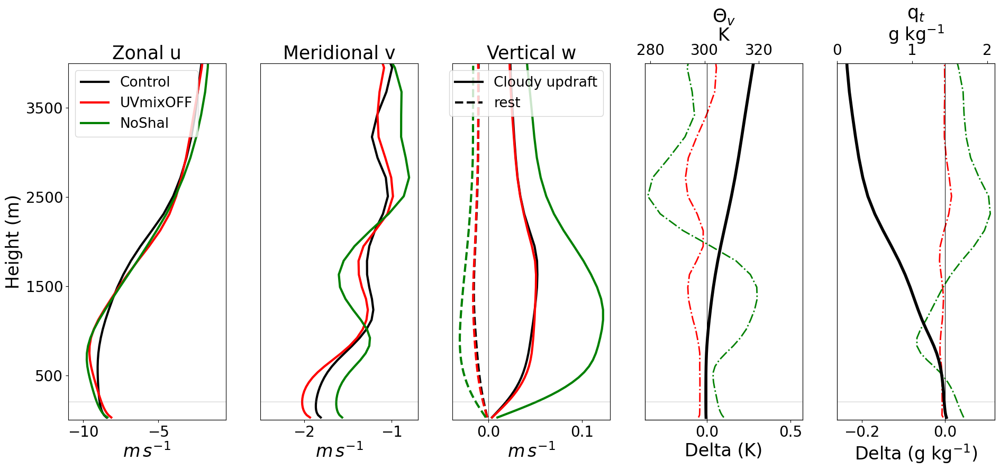

In [5]:
#%% Wind profiles 
layer=[0,200]
fig, axs = plt.subplots(1,5,figsize=(19,9))
for idx,var in enumerate(['u','v','wa','thv','qt']):
    if var == 'thv':
        xlim_1 = [-0.37,0.57]
        xlim_2 = [278,336]
        unit   = 'K'
        factor = 1
    elif var == 'qt':
        xlim_1 = [-0.26,0.12]
        xlim_2 = [0,2.1]
        unit   = r'g kg$^{-1}$'
        factor = 100
    for ide, exp in enumerate(exps):
        ## mean of all 
        # harm3d[exp][var].isel(z=slice(1,-1)).mean(['x','y','time'])\
        #     .plot(y='z',ls=sty[ide],ax=axs[idx,0],label=lab,lw=3,c=col[ide])
        cl_pixels = harm3d[exp].where((harm3d[exp]['cl_top']<4500)&(harm3d[exp]['cl_top']>200))
        clcore_piels = cl_pixels.where(cl_pixels['wa']>0)
        rest_pixels = harm3d[exp].where(clcore_piels['cl'].isnull())
        if (var == 'wa'):
            clcore_piels[var].mean(('x','y'))\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[idx],\
                                            label=lab[ide],lw=3,c=col[ide],ls='-')
            rest_pixels[var].mean(('x','y'))\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[idx],\
                                            lw=3,c=col[ide],ls='--')
            axs[idx].set_xlabel(r'$m \, s^{-1}$')
        elif var in ['u','v']: 
            harm2d[exp][var]\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',\
                            ls='-',ax=axs[idx],label=lab[ide],lw=3,c=col[ide])
#             harm2d[exp][var].sel(time=time_g2[group].time)\
#                     .mean('time').isel(z=slice(1,-1)).plot(y='z',\
#                             ls='--',ax=axs[idx],label=lab[ide],lw=3,c=col[ide])
            axs[idx].set_xlabel(r'$m \, s^{-1}$')
        elif var in ['thv','qt']:
            if exp == 'HA43h22tg3_clim_noHGTQS':
                ax2 = axs[idx].twiny()
                (factor*harm2d[exp][var]\
                    .mean('time').isel(z=slice(1,-1))).plot(y='z',\
                        ls='-',ax=ax2,label=lab[ide],lw=4,c=col[ide])
                ax2.set_xlabel(unit)
                ax2.set_xlim(xlim_2)
            else: 
                (factor*(harm2d[exp] - harm2d['HA43h22tg3_clim_noHGTQS'].interp(z=harm3d[exp].z))[var]\
                        .mean('time').isel(z=slice(1,-1))).plot(y='z',\
                                ls='-.',ax=axs[idx],label=lab[ide]+' - ctrl',lw=2,c=col[ide])
            axs[idx].axvline(0,c='k',lw=0.5)
            axs[idx].set_xlabel('Delta ('+unit+')')
            axs[idx].set_xlim(xlim_1)
            
    axs[idx].axhline(layer[0],c='grey',lw=0.3)
    axs[idx].axhline(layer[1],c='grey',lw=0.3)
#     axs[idx].spines['top'].set_visible(False)
#     axs[idx].spines['right'].set_visible(False)
    axs[idx].set_yticks([]) 
    axs[idx].set_ylabel('')
    axs[idx].set_ylim([0,4000])
axs[0].set_xlim([-11,-0.5])
axs[1].set_xlim([-2.5,-0.7])   
axs[2].axvline(0,c='k',lw=0.5)
axs[0].set_yticks([500,1500,2500,3500]) 
axs[0].set_ylabel('Height (m)')
axs[0].set_title('Zonal u',fontsize=25)
axs[1].set_title('Meridional v',fontsize=25)
axs[2].set_title('Vertical w',fontsize=25)
axs[3].set_title(r'$\Theta_v$',fontsize=25)
axs[4].set_title(r'q$_t$',fontsize=25)
# axs[3].legend(fontsize=17)
axs[0].legend(fontsize=19)
axs[2].legend([r'Cloudy updraft','rest'],fontsize=19)
plt.tight_layout()
plt.savefig(figure_dir+'mean_prof.pdf')

KeyboardInterrupt: 

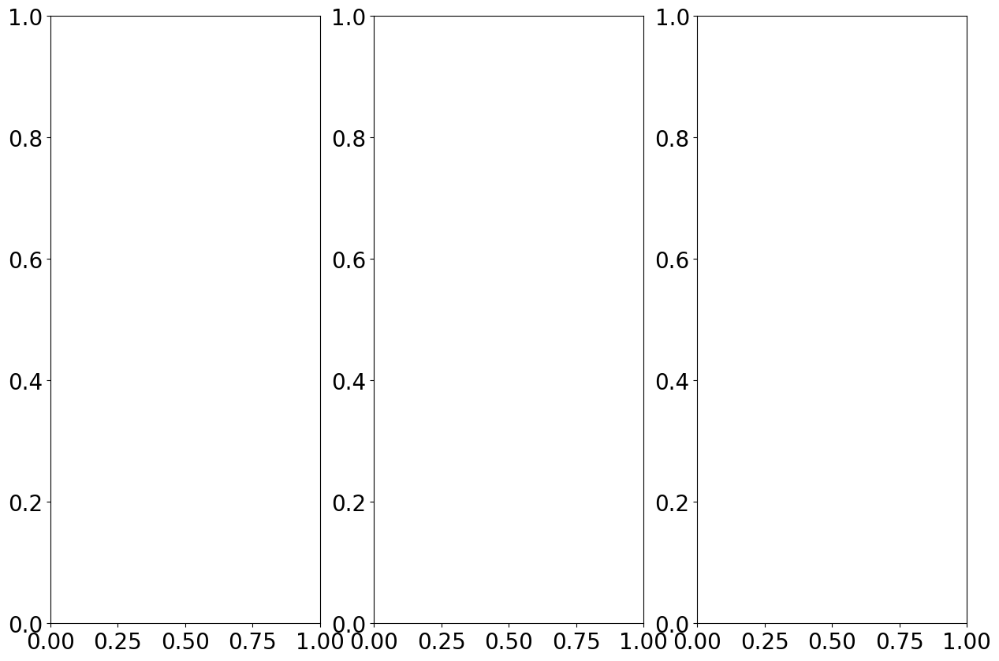

In [33]:
#%% Thermodynamic variables
fig, axs = plt.subplots(1,3,figsize=(15,10))

for ide, exp in reversed(list(enumerate(exps))):
    for idx,var in enumerate(['thv','qt','cl']):
        if var == 'thv':
            xlim_1 = [-0.37,0.57]
            xlim_2 = [278,336]
            unit   = 'K'
            factor = 1
        elif var == 'qt':
            xlim_1 = [-0.26,0.12]
            xlim_2 = [0,2.1]
            unit   = r'g kg$^{-1}$'
            factor = 100
        elif var == 'cl':
            xlim_1 = [None,None]
            xlim_2 = [None,None]
            unit   = r'fraction'
            factor = 1
                
        if (var in harm2d[exp]) & (var != 'cl'):
            if exp == 'HA43h22tg3_clim_noHGTQS':
                ax2 = axs[idx].twiny()
                (factor*harm2d[exp][var]\
                    .mean('time').isel(z=slice(1,-1))).plot(y='z',\
                        ls='-',ax=ax2,label=lab[ide],lw=4,c=col[ide])
                ax2.set_xlabel(unit)
                ax2.set_xlim(xlim_2)
            else:
                (factor*(harm2d[exp] - harm2d['HA43h22tg3_clim_noHGTQS'].interp(z=harm3d[exp].z))[var]\
                        .mean('time').isel(z=slice(1,-1))).plot(y='z',\
                                ls='--',ax=axs[idx],label=lab[ide]+' - ctrl',lw=2,c=col[ide])
                axs[idx].axvline(0,c='k',lw=0.5)
                axs[idx].set_xlabel('Delta ('+unit+')')
                axs[idx].set_xlim(xlim_1)
                
        else: 
            # cloud fraction  
            harm2d[exp][var].mean('time').plot(y='z',lw=3,ls='-',\
                                                        c=col[ide],label=lab[ide],ax=axs[idx])
            
            axs[idx].set_xlabel(unit)
            axs[idx].set_xticks([0,0.03,0.06,0.09]) 
        
        
        axs[idx].set_ylim([0,4000])
        axs[idx].set_yticks([]) 
        axs[idx].set_ylabel('')

                
axs[0].set_ylabel('Height (m)')
axs[0].set_yticks([500,1500,2500,3500]) 
axs[0].set_title(r'Virtual potenrial temperature ',fontsize=25)
axs[1].set_title('Total specific humidity',fontsize=25)
axs[2].set_title('Cloud fraction',fontsize=25)
axs[2].legend(fontsize=19)
axs[1].legend(fontsize=17)
plt.tight_layout()
# plt.savefig(figure_dir+'mean_termo_prof.pdf')

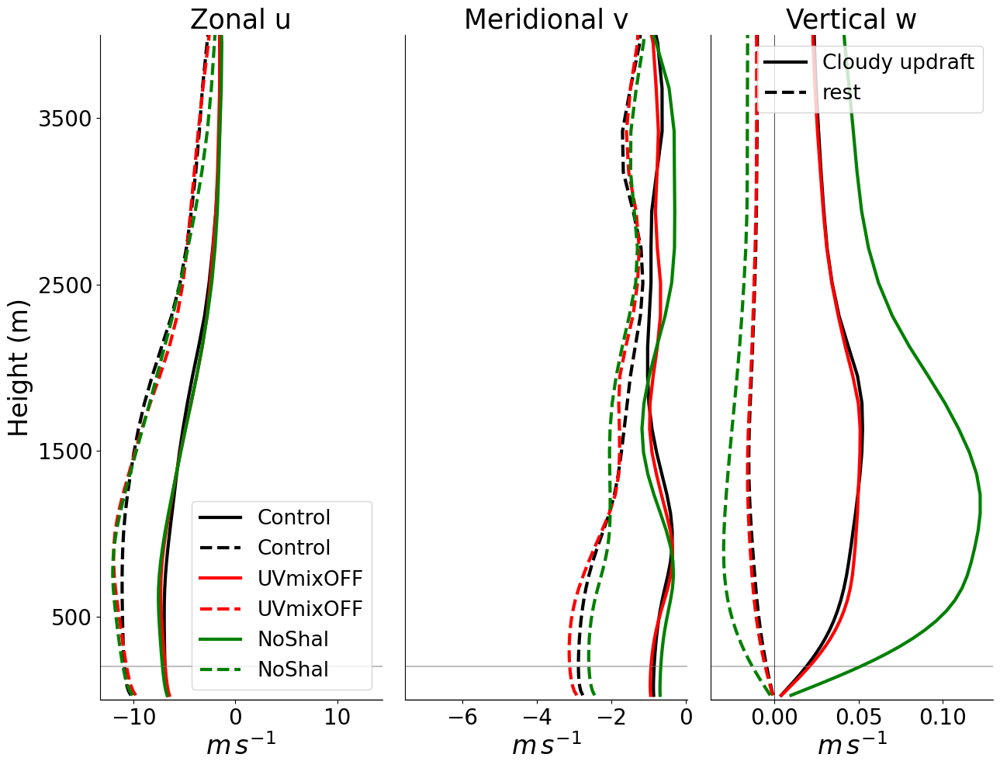

In [38]:
#%% Wind profiles 
layer=[0,200]
fig, axs = plt.subplots(1,3,figsize=(13,10))
for idx,var in enumerate(['u','v','wa']):
    for ide, exp in enumerate(exps):
        ## mean of all 
        
        # harm3d[exp][var].isel(z=slice(1,-1)).mean(['x','y','time'])\
        #     .plot(y='z',ls=sty[ide],ax=axs[idx,0],label=lab,lw=3,c=col[ide])
        
        
        cl_pixels = harm3d[exp].where((harm3d[exp]['cl_top']<4500)&(harm3d[exp]['cl_top']>200))
        clcore_piels = cl_pixels.where(cl_pixels['wa']>0)
        rest_pixels = harm3d[exp].where(clcore_piels['cl'].isnull())
        
        if (var == 'wa'):
            clcore_piels[var].mean(('x','y'))\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[idx],\
                                            label=lab[ide],lw=3,c=col[ide],ls='-')
            rest_pixels[var].mean(('x','y'))\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[idx],\
                                            lw=3,c=col[ide],ls='--')
        
        else: 
            harm2d[exp][var]\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',\
                            ls='-',ax=axs[idx],label=lab[ide],lw=3,c=col[ide])
#             harm2d[exp][var].sel(time=time_g2[group].time)\
#                     .mean('time').isel(z=slice(1,-1)).plot(y='z',\
#                             ls='--',ax=axs[idx],label=lab[ide],lw=3,c=col[ide])
            
            
            
        axs[idx].axhline(layer[0],c='grey',lw=0.3)
        axs[idx].axhline(layer[1],c='grey',lw=0.3)
        axs[idx].spines['top'].set_visible(False)
        axs[idx].spines['right'].set_visible(False)
        axs[idx].set_yticks([]) 
        axs[idx].set_ylabel('')
        
        axs[idx].set_ylim([0,4000])
        axs[idx].set_xlabel(r'$m \, s^{-1}$')
axs[0].set_xlim([-11,-0.5])
axs[1].set_xlim([-2.5,-0.7])   
axs[2].axvline(0,c='k',lw=0.5)
axs[0].set_yticks([500,1500,2500,3500]) 
axs[0].set_ylabel('Height (m)')
axs[0].set_title('Zonal u',fontsize=25)
axs[1].set_title('Meridional v',fontsize=25)
axs[2].set_title('Vertical w',fontsize=25)
axs[0].legend(fontsize=19)
axs[2].legend([r'Cloudy updraft','rest'],fontsize=19)
plt.tight_layout()
# plt.savefig(figure_dir+'mean_wind_prof.pdf')

In [55]:
goes16 = xr.concat([cat.satellites.GOES16['latlongrid'](date=d).to_dask().chunk() for d in pd.date_range('2020-01-12','2020-01-14')], dim='time')

In [11]:
save_dir

NameError: name 'save_dir' is not defined

'/scratch/acmsavazzi/data/HARMONIE/'

In [ ]:
save_dir = os.path.abspath('../../HARMONIE_paper/data/')+'/'
for exp in exps:
    # harm2d_synopt[exp].time.attrs.pop("units", None)
    # harm2d_synopt[exp].to_netcdf(save_dir+exp+'/'+exp[16:]+'_harm2d_synopt.nc', compute=True)
    # harm_obj_synopt[exp].to_netcdf(save_dir+exp+'/'+exp[16:]+'_harm_obj_synopt.nc', compute=True)
    ds_org_4km_synopt[exp].to_netcdf(save_dir+exp+'/'+exp[16:]+'_ds_org_4km_synopt.nc', compute=True)

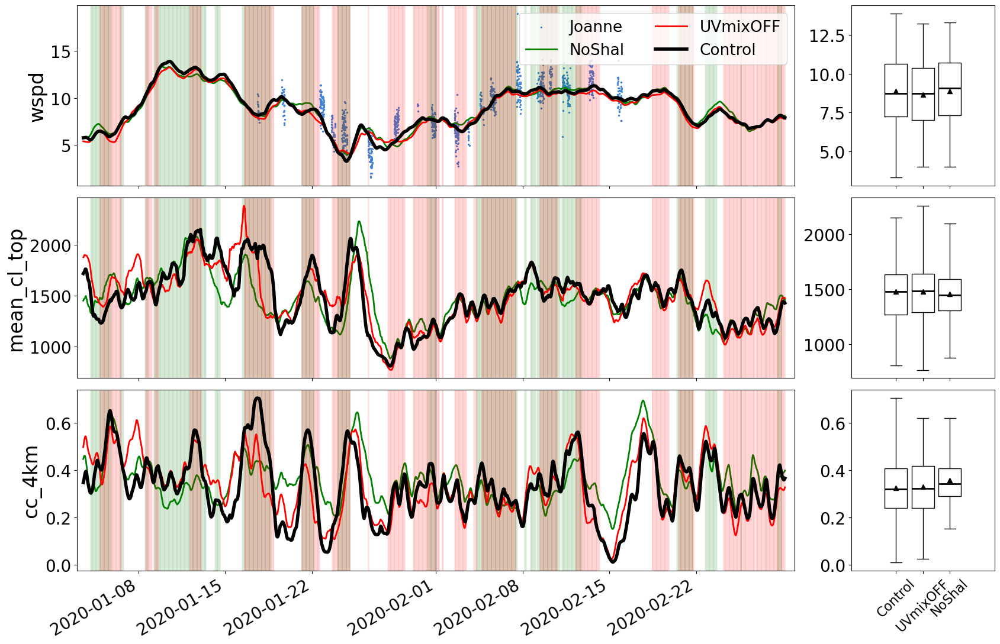

In [3]:
#%% Surface winds and clouds
bottom, top = 0.1, 0.9
left, right = 0.01, 0.9
fig, axs = plt.subplots(3,2,figsize=(17,11), gridspec_kw={'width_ratios': [5,1]})
fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, \
                    hspace=0.15, wspace=0.1)
iteration = 1.2
labels = []
layer=[0,200]
# Observations
axs[0,0].scatter(joanne.launch_time,joanne['wspd'].sel(alt=slice(layer[0],layer[1])).mean('alt'),\
                 c=col_obs[0],s=2,label='Joanne')

for ide, exp in reversed(list(enumerate(exps))):
    
    if exp == exps[0]:
        line =4
    else:
        line =2
    iteration -=0.3
    label = lab[ide]  # Get the label from the 'lab' array
    labels.append(label)  # Append the label to the list
    # HARMONIE
    harm2d_synopt[exp]['wspd'].\
        sel(z=slice(layer[0],layer[1])).mean('z')\
            .plot(x='time',ls='-',lw=line,c=col[ide],label=lab[ide],ax=axs[0,0])
    harm_obj_synopt[exp]['mean_cl_top']\
            .plot(x='time',ls='-',lw=line,c=col[ide],ax=axs[1,0])
    harm2d_synopt[exp]['cc_4km']\
            .plot(x='time',ls='-',lw=line,c=col[ide],ax=axs[2,0])

    ## boxplots    
    filtered_data = {}
    filtered_data[0] = harm2d_synopt[exp]['wspd']\
            .where(~harm2d_synopt[exp]['wspd'].isnull().compute(),drop=True)\
            .sel(z=slice(layer[0],layer[1])).mean('z').values
    filtered_data[1] = harm_obj_synopt[exp]['mean_cl_top']\
            .where(~harm_obj_synopt[exp]['mean_cl_top'].isnull().compute(),drop=True).values
    filtered_data[2] = harm2d_synopt[exp]['cc_4km']\
            .where(~harm2d_synopt[exp]['cc_4km'].isnull().compute(),drop=True).values

    for idx, data in enumerate(filtered_data):
        axs[idx,1].boxplot(filtered_data[idx],\
                    positions=[round(iteration,1)],\
            whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.25,\
                medianprops=dict(color="k", lw=2),\
                meanprops={"markerfacecolor":"black",'markeredgecolor':'black'})  

    for idx,var in enumerate(axs): 
        if exp in time_g1['delta_cc']:
            for ii in time_g2['delta_cc'][exp].values:
                axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)

axs[idx,1].set_xticklabels(labels, rotation=45 )
axs[idx,1].tick_params(axis='x', which='major', labelsize=16)
axs[idx,1].set_ylabel('')
for idx,var in enumerate(axs): 
    axs[idx,0].axvline(np.datetime64('2020-02-01T00'), color='k', linestyle='-', linewidth=0.5)
    axs[idx,0].set_xlim((srt_time,end_time))
    axs[idx,0].set_xlabel(r'')
    axs[idx,1].set_xlabel(r'')
    
axs[0,0].tick_params(labelbottom=False) 
axs[1,0].tick_params(labelbottom=False) 
axs[0,1].tick_params(labelbottom=False) 
axs[1,1].tick_params(labelbottom=False) 
axs[0,0].legend(fontsize=19,ncol=2)
plt.tight_layout()
# plt.savefig(figure_dir+'tmser_wspd.pdf')

In [14]:
## wind speed time series    
### Not working@
bottom, top = 0.1, 0.9
left, right = 0.01, 0.9

fig, axs = plt.subplots(3,2,figsize=(17,11), gridspec_kw={'width_ratios': [5,1]})
fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, \
                    hspace=0.15, wspace=0.1)
iteration = 1.2
labels = []
layer=[0,200]
for ide, exp in reversed(list(enumerate(exps))):
    iteration -=0.3
    label = lab[ide]  # Get the label from the 'lab' array
    labels.append(label)  # Append the label to the list
    if exp == 'HA43h22tg3_clim_noHGTQS':
        line = 4
        axs[0,0].axhline(np.sqrt(harm2d_synopt[exp]['u']**2 + harm2d_synopt[exp]['v']**2).\
                    mean('time').sel(z=slice(layer[0],layer[1])).mean('z'),ls='-',lw=2,c=col[ide])        
        axs[1,0].axhline(harm_obj_synopt[exp]['mean_cl_top'].mean('time'),\
                   ls='-',lw=2,c=col[ide])
        axs[2,0].axhline(harm2d_synopt[exp]['cc_4km'].mean('time'),\
                   ls='-',lw=2,c=col[ide])
    else: 
        line =2
    np.sqrt(harm2d_synopt[exp]['u']**2 + harm2d_synopt[exp]['v']**2).\
        sel(z=slice(layer[0],layer[1])).mean('z')\
            .plot(x='time',ls='-',lw=line,c=col[ide],label=lab[ide],ax=axs[0,0])
    harm_obj_synopt[exp]['mean_cl_top']\
            .plot(x='time',ls='-',lw=line,c=col[ide],ax=axs[1,0])
    harm2d_synopt[exp]['cc_4km']\
            .plot(x='time',ls='-',lw=line,c=col[ide],ax=axs[2,0])

    ## boxplots
    filtered_data = {}
    filtered_data[0] = np.sqrt(harm2d_synopt[exp]['u']**2 + harm2d_synopt[exp]['v']**2)\
            .where(~np.sqrt(harm2d_synopt[exp]['u']**2 + harm2d_synopt[exp]['v']**2).isnull(),drop=True)\
            .sel(z=slice(layer[0],layer[1])).mean('z').values
    filtered_data[1] = harm_obj_synopt[exp]['mean_cl_top']\
            .where(~harm_obj_synopt[exp]['mean_cl_top'].isnull(),drop=True).values
    filtered_data[2] = harm2d_synopt[exp]['cc_4km']\
            .where(~harm2d_synopt[exp]['cc_4km'].isnull(),drop=True).values

    for idx, data in enumerate(filtered_data):
        axs[idx,1].boxplot(filtered_data[idx],\
                    positions=[round(iteration,1)],\
            whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.25,\
                medianprops=dict(color="k", lw=2),\
                meanprops={"markerfacecolor":"black",'markeredgecolor':'black'})  
        
    for idx,var in enumerate(axs): 
        if exp in time_g1['delta_cc']:
            for ii in time_g2['delta_cc'][exp].values:
                axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)
    #     for ii in perc_diff[exp].where(abs(perc_diff[exp]['mean_length_scale'])>0.5,drop=True)['time'].values:
    #         axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)

axs[idx,1].set_xticklabels(labels, rotation=45 )
axs[idx,1].tick_params(axis='x', which='major', labelsize=16)
axs[idx,1].set_ylabel('')

for idx,var in enumerate(axs): 
    axs[idx,0].axvline(np.datetime64('2020-02-01T00'), color='k', linestyle='-', linewidth=0.5)
#     for ii in time_g1[group].time.values:
#         axs[idx,0].axvline(ii,color='orange',alpha=0.07,lw=1.5)

    #     for ii in time_g2[group].time.values:
    #         axs.axvline(ii,color='b',alpha=0.02)
    axs[idx,0].set_xlim((srt_time,end_time))
    axs[idx,0].set_xlabel(r'')
    axs[idx,1].set_xlabel(r'')
axs[0,0].set_ylabel(r'$m \, s^{-1}$')
axs[1,0].set_ylabel(r'$m$')
axs[2,0].set_ylabel(r'fraction')
axs[0,0].set_title(r'Wind speed in the lower '+str(layer[1])+' m',fontsize=25)
axs[1,0].set_title(r'Mean cloud top',fontsize=25)
axs[2,0].set_title(r'Cloud cover',fontsize=25)

axs[0,0].tick_params(labelbottom=False) 
axs[1,0].tick_params(labelbottom=False) 
axs[0,1].tick_params(labelbottom=False) 
axs[1,1].tick_params(labelbottom=False) 
axs[0,0].legend(fontsize=19)
plt.tight_layout()
# plt.savefig(figure_dir+'tmser_wspd.pdf')

Error in callback <function _draw_all_if_interactive at 0x15550f26ea20> (for post_execute):
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/IPython/core/events.py", line 93, in trigger
    available_events = {}
                    ^^^^^^
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/matplotlib/pyplot.py", line 120, in _draw_all_if_interactive
    from matplotlib.quiver import Barbs, Quiver, QuiverKey
        ^^^^^^^^^^
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/matplotlib/_pylab_helpers.py", line 132, in draw_all
    manager.canvas.draw_idle()
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/matplotlib/backend_bases.py", line 2082, in draw_idle
    format : str, optional
            ^^^^^^^^^^^^^^^
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/matplotlib/backends/backend_agg.py", line 388, in draw
    self.figure.draw(self.renderer)
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/matplotlib/artist.py", l

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/IPython/core/formatters.py", line 223, in catch_format_error
    r = method(self, *args, **kwargs)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/IPython/core/formatters.py", line 340, in __call__
    return printer(obj)
           ^^^^^^^^^^^^
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/IPython/core/pylabtools.py", line 152, in print_figure
    fig.canvas.print_figure(bytes_io, **kw)
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/matplotlib/backend_bases.py", line 2366, in print_figure
    Interactive backends should implement this in a more native way.
                         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/matplotlib/backend_bases.py", line 2232, in <lambda>
    """
        
  File "/scratc

<Figure size 1700x1100 with 6 Axes>

/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/core/concat.py:527: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  common_dims = tuple(pd.unique([d for v in vars for d in v.dims]))
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/plot/dataarray_plot.py:1277: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  primitive = ax.scatter(*[p.to_numpy().ravel() for p in plts], **kwargs)
/scratch/acmsavazzi/.conda/myenv/lib/python3.11/site-packages/xarray/core/concat.py:527: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  common_dims = tuple(pd.unique([d for v in vars for d in v.dims]))
/scratch/acmsavazzi/.conda/m

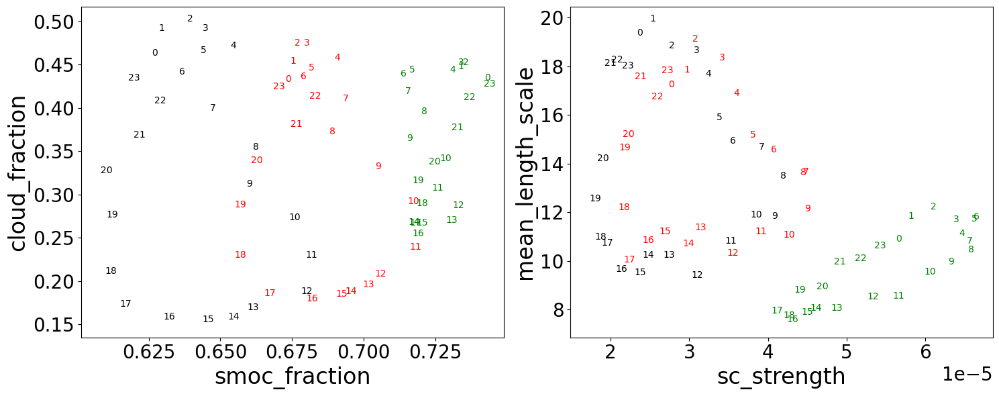

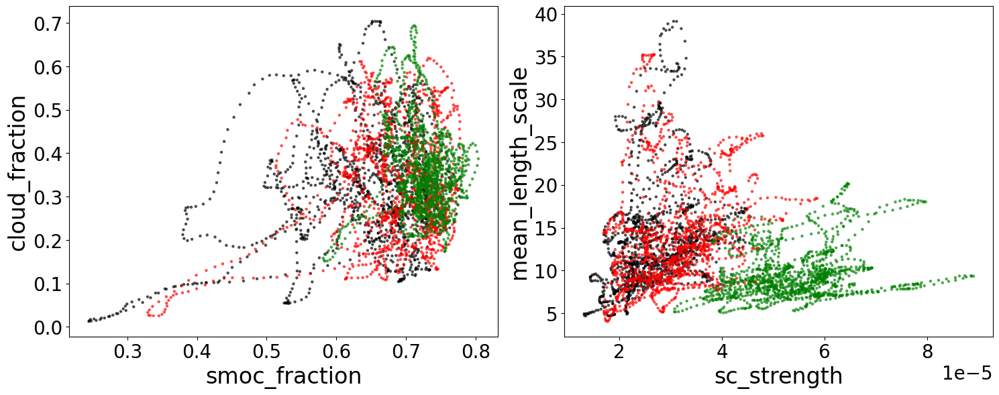

In [2]:
#%% Correlation scatter - Clouds vs SMOCs
klp = 5
fig, axs = plt.subplots(1,2,figsize=(15,6))
for idx,var in enumerate([['cloud_fraction','smoc_fraction'],['mean_length_scale','sc_strength']]):
    var_cl = var[0]
    var_sm = var[1]
    for ide, exp in enumerate(exps):
        ds = xr.merge([ds_org_4km[exp][var_cl],\
                                  ds_org_smoc_mean[exp].sel(klp=klp).rename({'cloud_fraction': 'smoc_fraction'})[var_sm]])
        # Calculate the mean by hour
        ds_mean_hourly = ds.groupby('time.hour').mean()
        # ds.plot.scatter(x=var_sm, y=var_cl,ax=axs[idx],color=col[ide],alpha=0.7,s=10, edgecolors='none')
        ds_mean_hourly.plot.scatter(x=var_sm, y=var_cl,hue='hour',ax=axs[idx],marker='',\
                                                add_colorbar=False,add_legend=False)
        # Annotate each point with the 'hour' value
        for i, txt in enumerate(ds_mean_hourly['hour'].values):
            axs[idx].text(ds_mean_hourly[var_sm][i], ds_mean_hourly[var_cl][i], str(txt), fontsize=10, color=col[ide])
    axs[idx].set_title('')
# axs[idx].set_ylim((0,40))
plt.tight_layout()
plt.savefig(figure_dir+'scatter_diurnal_cycle.pdf')
# plt.close()

### scatter using synoptic 
fig, axs = plt.subplots(1,2,figsize=(15,6))
for idx,var in enumerate([['cloud_fraction','smoc_fraction'],['mean_length_scale','sc_strength']]):
    var_cl = var[0]
    var_sm = var[1]
    for ide, exp in enumerate(exps):
        ds = xr.merge([ds_org_4km_synopt[exp][var_cl],\
                                  ds_org_smoc_mean_synopt[exp].sel(klp=klp).rename({'cloud_fraction': 'smoc_fraction'})[var_sm]])
        # plot
        ds.plot.scatter(x=var_sm, y=var_cl,ax=axs[idx],color=col[ide],alpha=0.7,s=10, edgecolors='none')
    axs[idx].set_title('')
# axs[idx].set_ylim((0,40))
plt.tight_layout()
plt.savefig(figure_dir+'scatter_synoptic.pdf')
# plt.close()

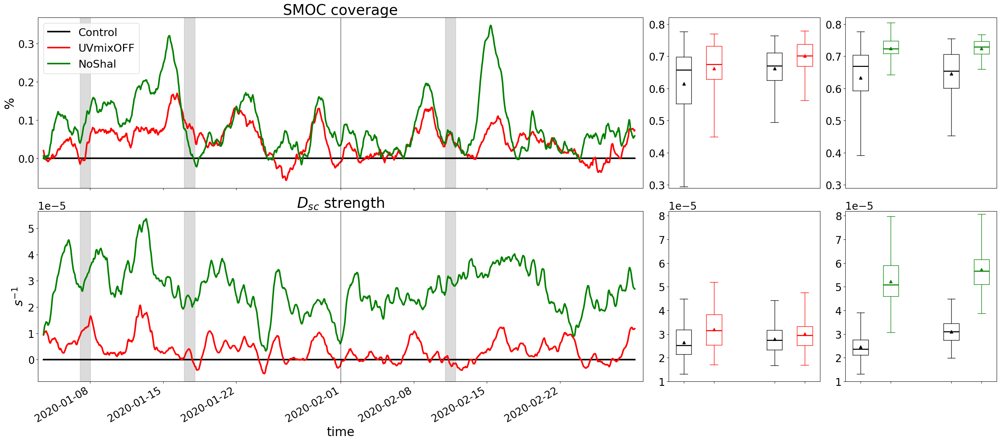

In [27]:
#%% Cloud statistics for SMOCS coverage and strength 2 boxplots
### full time series 
klp = 5 
vars_to_plot = ['cloud_fraction','sc_strength']
for id_sm, ds_org in enumerate([ds_org_smoc_mean_synopt,]):
    # save_ext = '_smocs'+['_conv','_dive'][id_sm]
    save_ext = '_smocs_byCC'
    bottom, top = 0.1, 0.9
    left, right = 0.01, 0.9
    fig, axs = plt.subplots(len(vars_to_plot),3,figsize=(27,12), gridspec_kw={'width_ratios': [4,1,1]})
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, \
                        hspace=0.15, wspace=0.1)
    iteration = 0
    labels = []
    for ide, exp in enumerate(exps):
        iteration +=1
        label = lab[ide]  # Get the label from the 'lab' array
        labels.append(label)  # Append the label to the list
        for idx,var in enumerate(vars_to_plot):
            if var =='cloud_fraction':
                factor = 1
                title  = 'SMOC coverage'
                unit   = r'%'
                lim =   [None,None]
            elif var =='sc_strength':
                factor = 1
                title  = r'$D_{sc}$ strength'
                unit   = r'$s^{-1}$'
                lim =   [None,None]
            else:
                factor = 1
                title = var
                unit   = r''
                lim =   [None,None]
            (ds_org[exp].sel(klp=klp)[var]-ds_org['HA43h22tg3_clim_noHGTQS'].sel(klp=klp)[var]).plot(\
                        x='time',ls=['-','--'][id_sm],ax=axs[idx,0],lw=3,c=col[ide],label=lab[ide])        
            # vertical line between months  
            axs[idx,0].axvline(np.datetime64('2020-02-01T00'), color='k', linestyle='-', linewidth=0.5)
            # Fill the area between the vertical lines
            axs[idx,0].axvspan(np.datetime64('2020-01-07T00:30'),\
                             np.datetime64('2020-01-08T00:30'), alpha=0.1, color='grey')
            axs[idx,0].axvspan(np.datetime64('2020-01-17T00:30'),\
                             np.datetime64('2020-01-18T00:30'), alpha=0.1, color='grey')  
            axs[idx,0].axvspan(np.datetime64('2020-02-11T00:30'),\
                             np.datetime64('2020-02-12T00:30'), alpha=0.1, color='grey')

            # axs[idx].set_xlim(0,23)
            axs[idx,0].set_title(title,fontsize =28)
            axs[idx,0].set_ylabel(unit)
#             axs[idx,0].set_ylim(lim)
            axs[idx,0].set_xlim((srt_time,end_time))
            ## boxplots
            if exp != exps[2]:
                for idy,group in enumerate([time_g1['delta_cc'],time_g2['delta_cc']]):
                    filtered_data = ds_org[exp].sel(time=group[exps[1]]).sel(klp=klp)[var].where(~ds_org[exp].sel(klp=klp)[var].isnull().compute(), drop=True).values
                    axs[idx,1].boxplot(filtered_data,\
                                positions=[round(ide+3*idy,1)],\
                            whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.51,\
                            medianprops=dict(color=col[ide], lw=2),boxprops=dict(color=col[ide]),\
                            whiskerprops=dict(color=col[ide]),capprops=dict(color=col[ide]),\
                            meanprops={"markerfacecolor":col[ide],'markeredgecolor':col[ide]})  
                
                    axs[idx,1].tick_params(axis='x', which='major', labelsize=19)
            if exp != exps[1]:
                for idy,group in enumerate([time_g1['delta_cc'],time_g2['delta_cc']]):
                    filtered_data = ds_org[exp].sel(time=group[exps[2]]).sel(klp=klp)[var].where(~ds_org[exp].sel(klp=klp)[var].isnull().compute(), drop=True).values
                    axs[idx,2].boxplot(filtered_data,\
                                positions=[round(ide/2+3*idy,1)],\
                            whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.51,\
                            medianprops=dict(color=col[ide], lw=2),boxprops=dict(color=col[ide]),\
                            whiskerprops=dict(color=col[ide]),capprops=dict(color=col[ide]),\
                            meanprops={"markerfacecolor":col[ide],'markeredgecolor':col[ide]})  
                    axs[idx,2].tick_params(axis='x', which='major', labelsize=19)


            if idx < len(vars_to_plot)-1:
                axs[idx,2].set_ylabel('')
                axs[idx,1].set_ylabel('')
                axs[idx,0].set_xlabel('')
                axs[idx,1].set_xlabel('')
                axs[idx,2].set_xlabel('')
                axs[idx,1].set_xticks([])
                axs[idx,2].set_xticks([])
                axs[idx,0].tick_params(labelbottom=False) 
                axs[idx,1].tick_params(labelbottom=False) 

            axs[idx,1].set_ylabel('')
            axs[idx,2].set_xlabel('')
            axs[idx,1].tick_params(labelbottom=False) 
            axs[idx,2].tick_params(labelbottom=False) 
    # plt.suptitle('Cloud mask for '+save_ext)
#     axs[idx,0].set_xlabel('time')
    axs[0,1].set_ylim([0.29,0.82])
    axs[0,2].set_ylim([0.29,0.82])
    axs[1,1].set_ylim([1e-5,8.2e-5])
    axs[1,2].set_ylim([1e-5,8.2e-5])
    # axs[1,1].set_xticklabels([r'control\n_{CC_{UVmixOFF}>CC_{control}}$','control$_{CC_{UVmixOFF}<CC_{control}}$',\
    #                           'UVmixOFF$_{CC_{UVmixOFF}>CC_{control}}$','UVmixOFF$_{CC_{UVmixOFF}<CC_{control}}$'], rotation=45)
    # axs[1,2].set_xticklabels(['control$_{CC_{NoSHAL}>CC_{control}}$','control$_{CC_{NoSHAL}<CC_{control}}$',\
    #                           'NoSHAL$_{CC_{NoSHAL}>CC_{control}}$','NoSHAL$_{CC_{NoSHAL}<CC_{control}}$'], rotation=45)
    axs[0,0].legend(loc="upper left", fontsize=21)   
    plt.tight_layout()
    plt.savefig(figure_dir+'tmser_cl_metrics'+save_ext+'.pdf')
    # plt.close()

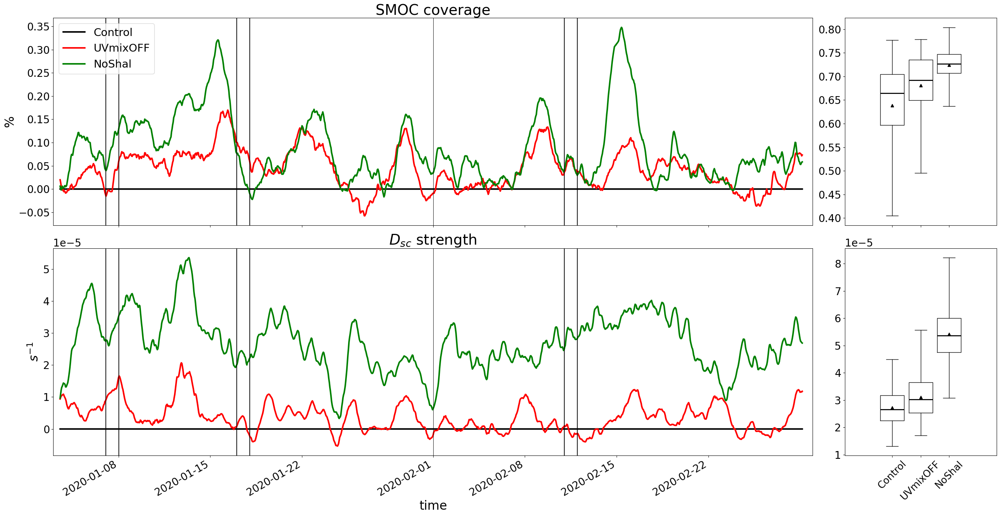

In [6]:
#%% Cloud statistics for SMOCS coverage and strength 
### full time series 
klp = 5 
vars_to_plot = ['cloud_fraction','sc_strength']
for id_sm, ds_org in enumerate([ds_org_smoc_mean_synopt,]):
    # save_ext = '_smocs'+['_conv','_dive'][id_sm]
    save_ext = '_smocs'
    bottom, top = 0.1, 0.9
    left, right = 0.01, 0.9
    fig, axs = plt.subplots(len(vars_to_plot),2,figsize=(27,14), gridspec_kw={'width_ratios': [5,1]})
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, \
                        hspace=0.15, wspace=0.1)
    iteration = 0
    labels = []
    for ide, exp in enumerate(exps):
        iteration +=0.3
        label = lab[ide]  # Get the label from the 'lab' array
        labels.append(label)  # Append the label to the list
        for idx,var in enumerate(vars_to_plot):
            if var =='cloud_fraction':
                factor = 1
                title  = 'SMOC coverage'
                unit   = r'%'
                lim =   [None,None]
            elif var =='sc_strength':
                factor = 1
                title  = r'$D_{sc}$ strength'
                unit   = r'$s^{-1}$'
                lim =   [None,None]
            else:
                factor = 1
                title = var
                unit   = r''
                lim =   [None,None]
            (ds_org[exp].sel(klp=klp)[var]-ds_org['HA43h22tg3_clim_noHGTQS'].sel(klp=klp)[var]).plot(\
                        x='time',ls=['-','--'][id_sm],ax=axs[idx,0],lw=3,c=col[ide],label=lab[ide])        
            # vertical line between months  
            axs[idx,0].axvline(np.datetime64('2020-02-01T00'), color='k', linestyle='-', linewidth=0.5)
                
#             for ii in perc_diff[exp].where(abs(perc_diff[exp]['mean_length_scale'])>0.5,drop=True)['time'].values:
#                 axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)

 
            if exp in time_g1['delta_cc']:
                for ii in time_g2['delta_cc'][exp].values:
                    axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)

            axs[idx,0].axvline(np.datetime64('2020-01-07T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-01-08T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-02-11T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-02-12T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-01-17T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-01-18T00'), color='k', linestyle='-', linewidth=1)
            ##
            # axs[idx,0].axvline(np.datetime64('2020-01-14T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-15T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-22T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-23T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-02-15T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-02-16T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx].set_xlim(0,23)
            axs[idx,0].set_title(title,fontsize =28)
            axs[idx,0].set_ylabel(unit)
#             axs[idx,0].set_ylim(lim)
            axs[idx,0].set_xlim((srt_time,end_time))
            ## boxplots
            filtered_data = ds_org[exp].sel(klp=klp)[var].where(~ds_org[exp].sel(klp=klp)[var].isnull().compute(), drop=True).values
            axs[idx,1].boxplot(filtered_data,\
                        positions=[round(iteration,1)],\
                    whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.25,\
                    medianprops=dict(color="k", lw=2),\
                    meanprops={"markerfacecolor":"black",'markeredgecolor':'black'})  
            axs[idx,1].set_xticklabels(labels, rotation=45 )
            axs[idx,1].tick_params(axis='x', which='major', labelsize=19)
            if idx < len(vars_to_plot)-1:
                axs[idx,1].set_ylabel('')
                axs[idx,0].set_xlabel('')
                axs[idx,1].set_xlabel('')
                axs[idx,0].tick_params(labelbottom=False) 
                axs[idx,1].tick_params(labelbottom=False) 
    # plt.suptitle('Cloud mask for '+save_ext)
#     axs[idx,0].set_xlabel('time')
    axs[0,0].legend(loc="upper left", fontsize=21)   
    plt.tight_layout()
    # plt.savefig(figure_dir+'tmser_cl_metrics'+save_ext+'.pdf')
    # plt.close()

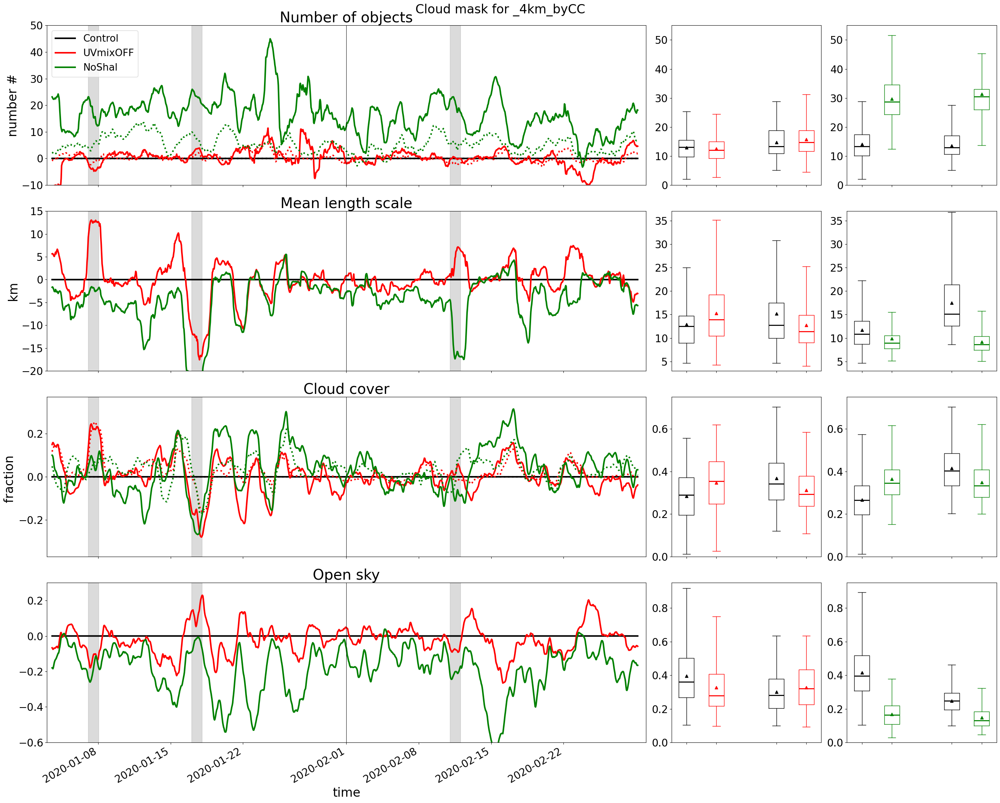

In [23]:
#%% Cloud statistics 2 boxplots
### ful time series 
for ds_org in [ds_org_4km_synopt,]:
    save_ext = '_4km_byCC'
    bottom, top = 0.1, 0.9
    left, right = 0.01, 0.9

    fig, axs = plt.subplots(4,3,figsize=(27,22), gridspec_kw={'width_ratios': [4,1,1]})
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, \
                        hspace=0.15, wspace=0.1)
    iteration = 0
    labels = []
    for ide, exp in enumerate(exps):
        iteration +=0.3
        label = lab[ide]  # Get the label from the 'lab' array
        labels.append(label)  # Append the label to the list
        for idx,var in enumerate(['num_objects','mean_length_scale','cloud_fraction','open_sky']):
#         for idx,var in enumerate(['num_objects','mean_length_scale']):
            if var =='cloud_fraction':
                factor = 1
                title  = 'Cloud cover'
                unit   = r'fraction '
                lim =   [-0.37,0.37]
                #lim =   [-0.08,0.2]
                (harm2d_synopt[exp]['cc_1_5to4km']-harm2d_synopt['HA43h22tg3_clim_noHGTQS']['cc_1_5to4km'])\
                    .plot(x='time',ax=axs[idx,0],ls=':',lw=3,c=col[ide])
            elif var =='num_objects':
                factor = 1
                title  = 'Number of clouds'
                unit   = r'number #'
                lim =   [-10,50]
                #lim =   [-17,7]
                (harm_obj_synopt[exp]['num_high_obj']-harm_obj_synopt['HA43h22tg3_clim_noHGTQS']['num_high_obj'])\
                    .plot(x='time',c=col[ide],lw=3,ls=':',ax=axs[idx,0])
                # (harm_obj_synopt[exp]['num_low_obj']-harm_obj_synopt['HA43h22tg3_clim_noHGTQS']['num_low_obj'])\
                #     .plot(x='time',c=col[ide],lw=3,ls='--',ax=axs[idx,0])
            elif var =='iorg':
                factor = 1
                title  = r'$I_{org}$'
                unit   = r'$I_{org}$'
            elif var == 'mean_length_scale':
                factor = 1
                title  ='Mean length scale'
                unit   = r'km'
                lim =   [-20,15]
                #lim =   [-3,10]
            elif var == 'open_sky':
                factor = 1
                title  ='Open sky'
                unit   = r''
                lim =   [-0.6,0.3]
                #lim =   [-0.25,0.15]
            else:
                factor = 1
                title = var

            (ds_org[exp][var]-ds_org['HA43h22tg3_clim_noHGTQS'][var]).plot(\
                        x='time',ls='-',ax=axs[idx,0],lw=3,c=col[ide],label=lab[ide])        
            # vertical line between months  
            axs[idx,0].axvline(np.datetime64('2020-02-01T00'), color='k', linestyle='-', linewidth=0.5)
                
            # Fill the area between the vertical lines
            axs[idx,0].axvspan(np.datetime64('2020-01-07T00:30'),\
                             np.datetime64('2020-01-08T00:30'), alpha=0.1, color='grey')
            axs[idx,0].axvspan(np.datetime64('2020-01-17T00:30'),\
                             np.datetime64('2020-01-18T00:30'), alpha=0.1, color='grey')  
            axs[idx,0].axvspan(np.datetime64('2020-02-11T00:30'),\
                             np.datetime64('2020-02-12T00:30'), alpha=0.1, color='grey')  
            
            # axs[idx,0].axvline(np.datetime64('2020-01-07T00'), color='k', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-08T00'), color='k', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-02-11T00'), color='k', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-02-12T00'), color='k', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-17T00'), color='k', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-18T00'), color='k', linestyle='-', linewidth=1)
            
            # axs[idx].set_xlim(0,23)
            axs[idx,0].set_title(title,fontsize =28)
            axs[idx,0].set_ylabel(unit)
            axs[idx,0].set_ylim(lim)
            axs[idx,0].set_xlim((srt_time,end_time))

            ## boxplots
            if exp != exps[2]:
                for idy,group in enumerate([time_g1['delta_cc'],time_g2['delta_cc']]):
                    filtered_data = ds_org[exp].sel(time=group[exps[1]])[var].where(~ds_org[exp][var].isnull().compute(), drop=True).values
                    axs[idx,1].boxplot(filtered_data,\
                                positions=[round(ide+3*idy,1)],\
                            whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.51,\
                            medianprops=dict(color=col[ide], lw=2),boxprops=dict(color=col[ide]),\
                            whiskerprops=dict(color=col[ide]),capprops=dict(color=col[ide]),\
                            meanprops={"markerfacecolor":col[ide],'markeredgecolor':col[ide]})  
                
                    axs[idx,1].tick_params(axis='x', which='major', labelsize=19)
            if exp != exps[1]:
                for idy,group in enumerate([time_g1['delta_cc'],time_g2['delta_cc']]):
                    filtered_data = ds_org[exp].sel(time=group[exps[2]])[var].where(~ds_org[exp][var].isnull().compute(), drop=True).values
                    axs[idx,2].boxplot(filtered_data,\
                                positions=[round(ide/2+3*idy,1)],\
                            whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.51,\
                            medianprops=dict(color=col[ide], lw=2),boxprops=dict(color=col[ide]),\
                            whiskerprops=dict(color=col[ide]),capprops=dict(color=col[ide]),\
                            meanprops={"markerfacecolor":col[ide],'markeredgecolor':col[ide]})  
                    axs[idx,2].tick_params(axis='x', which='major', labelsize=19)

            axs[idx,1].set_ylabel('')
            axs[idx,2].set_xlabel('')
            axs[idx,1].tick_params(labelbottom=False) 
            axs[idx,2].tick_params(labelbottom=False) 
            axs[idx,1].set_ylim([0,55])
    
    # plt.suptitle('Cloud mask for '+save_ext)
    axs[0,0].set_xlabel('')
    axs[0,0].tick_params(labelbottom=False) 
    axs[1,0].set_xlabel('')
    axs[1,0].tick_params(labelbottom=False) 
    axs[2,0].set_xlabel('')
    axs[2,0].tick_params(labelbottom=False) 
    axs[idx,0].set_xlabel('time')
    axs[0,1].set_xlabel('')
    axs[1,1].set_xlabel('')
    axs[2,1].set_xlabel('')
    
    axs[0,1].set_ylim([0,55])
    axs[0,2].set_ylim([0,55])
    axs[1,1].set_ylim([3,37])
    axs[1,2].set_ylim([3,37])
    axs[2,1].set_ylim([0,0.75])
    axs[2,2].set_ylim([0,0.75])
    axs[3,1].set_ylim([0,0.95])
    axs[3,2].set_ylim([0,0.95])
    # axs[idx,1].set_xticklabels([r'Control'+ "\n" +'$_{CC_{UVmixOFF}>CC_{control}}$','Control'+ "\n" +'$_{CC_{UVmixOFF}<CC_{control}}$',\
    #                           'UVmixOFF'+ "\n" +'$_{CC_{UVmixOFF}>CC_{control}}$','UVmixOFF'+ "\n" +'$_{CC_{UVmixOFF}<CC_{control}}$'], rotation=45)
    # axs[idx,2].set_xticklabels(['Control'+ "\n" +'$_{CC_{NoSHAL}>CC_{control}}$','Control'+ "\n" +'$_{CC_{NoSHAL}<CC_{control}}$',\
    #                           'NoSHAL'+ "\n" +'$_{CC_{NoSHAL}>CC_{control}}$','NoSHAL'+ "\n" +'$_{CC_{NoSHAL}<CC_{control}}$'], rotation=45)
    axs[0,0].legend(loc="upper left", fontsize=19)   
    plt.tight_layout()
    plt.savefig(figure_dir+'tmser_cl_metrics'+save_ext+'.pdf')

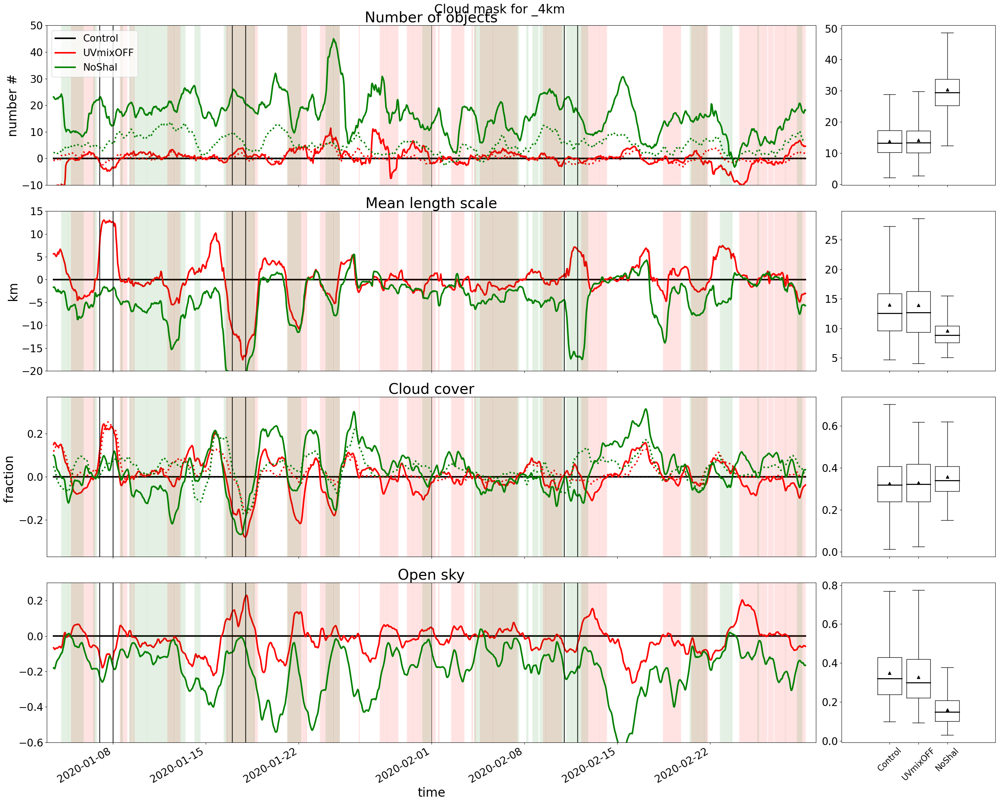

In [53]:
#%% Cloud statistics
### ful time series 
for ds_org in [ds_org_4km_synopt,]:
    save_ext = '_4km'
    bottom, top = 0.1, 0.9
    left, right = 0.01, 0.9

    fig, axs = plt.subplots(4,2,figsize=(27,22), gridspec_kw={'width_ratios': [5,1]})
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, \
                        hspace=0.15, wspace=0.1)
    iteration = 0
    labels = []
    for ide, exp in enumerate(exps):
        iteration +=0.3
        label = lab[ide]  # Get the label from the 'lab' array
        labels.append(label)  # Append the label to the list
        for idx,var in enumerate(['num_objects','mean_length_scale','cloud_fraction','open_sky']):
#         for idx,var in enumerate(['num_objects','mean_length_scale']):
            if var =='cloud_fraction':
                factor = 1
                title  = 'Cloud cover'
                unit   = r'fraction '
                lim =   [-0.37,0.37]
                #lim =   [-0.08,0.2]
                (harm2d_synopt[exp]['cc_1_5to4km']-harm2d_synopt['HA43h22tg3_clim_noHGTQS']['cc_1_5to4km'])\
                    .plot(x='time',ax=axs[idx,0],ls=':',lw=3,c=col[ide])
            elif var =='num_objects':
                factor = 1
                title  = 'Number of objects'
                unit   = r'number #'
                lim =   [-10,50]
                #lim =   [-17,7]
                (harm_obj_synopt[exp]['num_high_obj']-harm_obj_synopt['HA43h22tg3_clim_noHGTQS']['num_high_obj'])\
                    .plot(x='time',c=col[ide],lw=3,ls=':',ax=axs[idx,0])
            elif var =='iorg':
                factor = 1
                title  = r'$I_{org}$'
                unit   = r'$I_{org}$'
            elif var == 'mean_length_scale':
                factor = 1
                title  ='Mean length scale'
                unit   = r'km'
                lim =   [-20,15]
                #lim =   [-3,10]
            elif var == 'open_sky':
                factor = 1
                title  ='Open sky'
                unit   = r''
                lim =   [-0.6,0.3]
                #lim =   [-0.25,0.15]
            else:
                factor = 1
                title = var

            (ds_org[exp][var]-ds_org['HA43h22tg3_clim_noHGTQS'][var]).plot(\
                        x='time',ls='-',ax=axs[idx,0],lw=3,c=col[ide],label=lab[ide])        
            # vertical line between months  
            axs[idx,0].axvline(np.datetime64('2020-02-01T00'), color='k', linestyle='-', linewidth=0.5)
#             for ii in time_g1[group].time.values:
#                 axs[idx,0].axvline(ii,color='orange',alpha=0.04,lw=1.5)

            if exp in time_g1['delta_cc']:
                for ii in time_g2['delta_cc'][exp].values:
                    axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)
            # for ii in perc_diff[exp].where(abs(perc_diff[exp]['mean_length_scale'])>0.5,drop=True)['time'].values:
            #     axs[idx,0].axvline(ii,color=col[ide],alpha=0.08,lw=1.5)
                
            # Fill the area between the vertical lines
#             axs[idx,0].axvspan(np.datetime64('2020-01-07T00:30'),\
#                              np.datetime64('2020-01-08T00:30'), alpha=0.1, color='grey')
#             axs[idx,0].axvspan(np.datetime64('2020-02-11T00:30'),\
#                              np.datetime64('2020-02-12T00:30'), alpha=0.1, color='grey')            
            axs[idx,0].axvline(np.datetime64('2020-01-07T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-01-08T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-02-11T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-02-12T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-01-17T00'), color='k', linestyle='-', linewidth=1)
            axs[idx,0].axvline(np.datetime64('2020-01-18T00'), color='k', linestyle='-', linewidth=1)
            ##
            # axs[idx,0].axvline(np.datetime64('2020-01-14T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-15T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-22T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-01-23T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-02-15T00'), color='b', linestyle='-', linewidth=1)
            # axs[idx,0].axvline(np.datetime64('2020-02-16T00'), color='b', linestyle='-', linewidth=1)
            
            # axs[idx].set_xlim(0,23)
            axs[idx,0].set_title(title,fontsize =28)
            axs[idx,0].set_ylabel(unit)
            axs[idx,0].set_ylim(lim)
            axs[idx,0].set_xlim((srt_time,end_time))
                
            ## boxplots
            filtered_data = ds_org[exp][var].where(~ds_org[exp][var].isnull(), drop=True).values
            axs[idx,1].boxplot(filtered_data,\
                        positions=[round(iteration,1)],\
                whis=1.8,showfliers=False,showmeans=True,meanline=False,widths=0.25,\
                    medianprops=dict(color="k", lw=2),\
                    meanprops={"markerfacecolor":"black",'markeredgecolor':'black'})  

        axs[idx,1].set_xticklabels(labels, rotation=45 )
        axs[idx,1].tick_params(axis='x', which='major', labelsize=16)
        axs[idx,1].set_ylabel('')
    
    plt.suptitle('Cloud mask for '+save_ext)
    axs[0,0].set_xlabel('')
    axs[0,0].tick_params(labelbottom=False) 
    axs[1,0].set_xlabel('')
    axs[1,0].tick_params(labelbottom=False) 
    axs[2,0].set_xlabel('')
    axs[2,0].tick_params(labelbottom=False) 
    axs[idx,0].set_xlabel('time')
    axs[0,1].set_xlabel('')
    axs[0,1].tick_params(labelbottom=False) 
    axs[1,1].set_xlabel('')
    axs[1,1].tick_params(labelbottom=False) 
    axs[2,1].set_xlabel('')
    axs[2,1].tick_params(labelbottom=False) 
    axs[0,0].legend(loc="upper left", fontsize=19)   
    plt.tight_layout()
    plt.savefig(figure_dir+'tmser_cl_metrics'+save_ext+'.pdf')

In [10]:
harm_obj[exp]

<xarray.Dataset>
Dimensions:          (time: 1391)
Coordinates:
  * time             (time) datetime64[ns] 2020-01-02T21:00:00 ... 2020-02-29...
Data variables:
    num_objects      (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    mean_cl_top      (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    max_cl_top       (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    min_cl_top       (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    q1_cl_top        (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    q2_cl_top        (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    q3_cl_top        (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    num_high_obj     (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    num_low_obj      (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    mean_size        (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    size_q1_lowest   (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>
    size_q3_highest  (time) float64 dask.array<chunksize=(1391,), meta=np.ndarray>

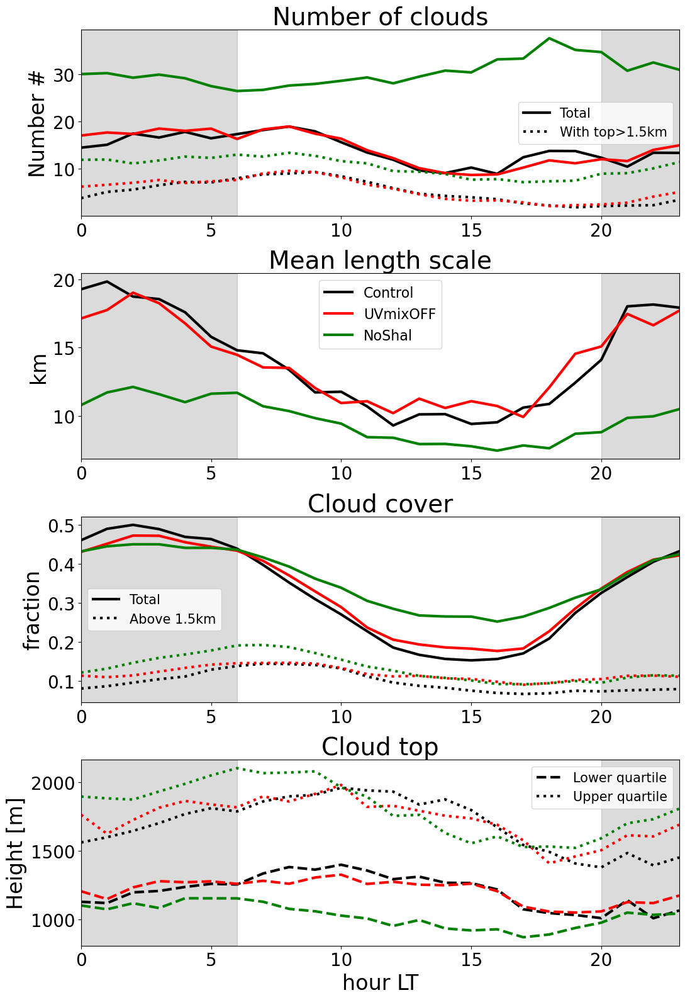

In [15]:
#%% cloud statistics 
## 3 panel plot 
fig, axs = plt.subplots(4,1,figsize=(11,16))
for ide, exp in enumerate(exps):
    # for idx,var in enumerate(['mean_length_scale','num_objects','open_sky']):
    for idx,var in enumerate(['num','mean_length_scale','cc','cl_top']):
        if var =='cloud_fraction':
            factor = 1
            title  = 'Cloud fraction'
            unit   = r'fraction '
        elif var =='num_objects':
            factor = 1
            title  = 'Number of objects'
            unit   = r'number #'
        elif var =='iorg':
            factor = 1
            title  = r'$I_{org}$'
            unit   = r'$I_{org}$'
        elif var == 'mean_length_scale':
            factor = 1
            title  ='Mean length scale'
            unit   = r'km'
        elif var == 'open_sky':
            factor = 1
            title  ='Open sky'
            unit   = r''
        elif var == 'cc':
            title  ='Cloud cover'
            unit   = r'fraction'
        else:
            factor = 1
            title = var
        
        if var in list(ds_org_4km[exp]):
            ds_org_4km[exp][var].groupby('time.hour').mean('time').plot(\
                        x='hour',ls='-',ax=axs[idx],lw=3,c=col[ide],label=lab[ide])
        
        elif var in list(harm_srf[exp]):
            harm_srf[exp][var].mean(dim=('x','y')).groupby('time.hour').mean('time')\
                .plot(x='hour',ls=sty[ide],ax=axs[idx],lw=3,c=col[ide],label=lab[ide])
        #     harm3d[exp]['cl'].sel(z=slice(0,6000)).max('z').\
        #         mean(['x','y']).groupby('time.hour').mean('time').\
        #             plot(x='hour',c=col[ide],ls='--',lw=3,ax=axs[idx],label='0 - 6km')
        
        elif var == 'cl_top':
            harm_obj[exp]['q1_cl_top'].groupby('time.hour').mean('time').plot(c=col[ide],lw=3,ls='--',ax=axs[idx])
            harm_obj[exp]['q3_cl_top'].groupby('time.hour').mean('time').plot(c=col[ide],lw=3,ls=':' ,ax=axs[idx])
            axs[idx].set_ylabel(r'Height  [m]')
            title  = 'Cloud top'
            unit   = r'Height [m]'
        elif var == 'num':
            harm_obj[exp]['num_objects'].groupby('time.hour').mean('time').plot(c=col[ide],lw=3,ls='-' ,ax=axs[idx])
            harm_obj[exp]['num_high_obj'].groupby('time.hour').mean('time').plot(c=col[ide],lw=3,ls=':',ax=axs[idx])
            # harm_obj[exp]['num_low_obj'].groupby('time.hour').mean('time').plot(c=col[ide],lw=3,ls='--' ,ax=axs[idx])
            
            axs[idx].set_ylabel(r'Height  [m]')
            title  = 'Number of clouds'
            unit   = r'Number #'  
        elif var == 'size':
            #(6.25*harm_obj[exp]['size_q1_lowest']).groupby('time.hour').mean('time').plot(c=col[ide],lw=3,ls='--',ax=axs[idx])
            (6.25*harm_obj[exp]['size_q3_highest']).groupby('time.hour').mean('time').plot(c=col[ide],lw=3,ls='-' ,ax=axs[idx])
            axs[idx].set_ylabel(r'Height  [m]')
            #axs[idx].set_yscale("log") 
            title  = 'Area'
            unit   = r'$km^2$'  
        elif var == 'cc':
            # harm2d[exp]['cc_4km'].\
            #     groupby('time.hour').mean()\
            #         .plot(x='hour',ax=axs[idx],ls='-',lw=3,c=col[ide])
            ds_org_4km[exp]['cloud_fraction'].\
                groupby('time.hour').mean()\
                    .plot(x='hour',ax=axs[idx],ls='-',lw=3,c=col[ide])
            harm2d[exp]['cc_1_5to4km'].\
                groupby('time.hour').mean()\
                    .plot(x='hour',ax=axs[idx],ls=':',lw=3,c=col[ide])
            
        # Fill the area between the vertical lines
        axs[idx].axvspan(20, 23, alpha=0.1, color='grey')
        axs[idx].axvspan(0, 6, alpha=0.1, color='grey')
        axs[idx].set_xlim(0,23)
        axs[idx].set_title(title,fontsize =28)
        axs[idx].set_ylabel(unit)
axs[0].set_xlabel('')
axs[1].set_xlabel('')
axs[2].set_xlabel('')
axs[3].set_xlabel('hour LT')
axs[0].legend(['Total','With top>1.5km'],fontsize=15) 
axs[1].legend(fontsize=16)   
axs[2].legend(['Total','Above 1.5km'],fontsize=15) 
axs[3].legend(['Lower quartile','Upper quartile'],fontsize=15) 
plt.tight_layout()
plt.savefig(figure_dir+'diurnal_cl_metrics_4km.pdf')

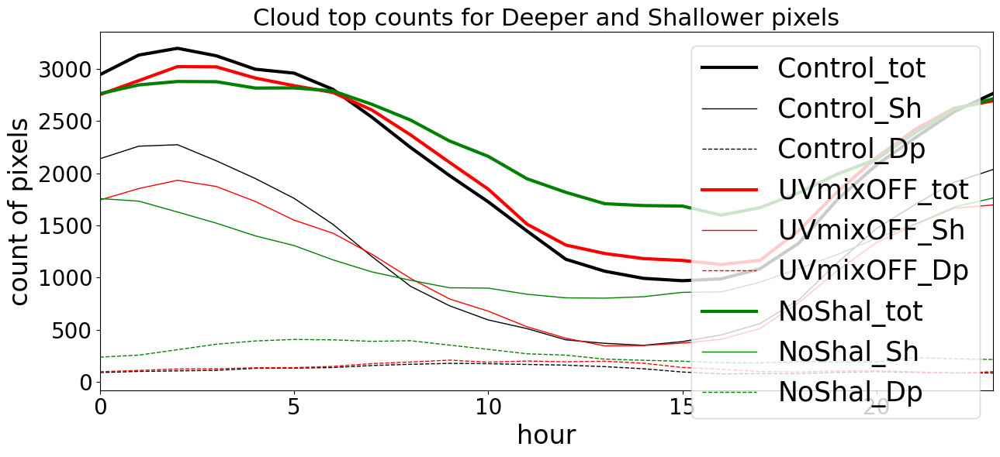

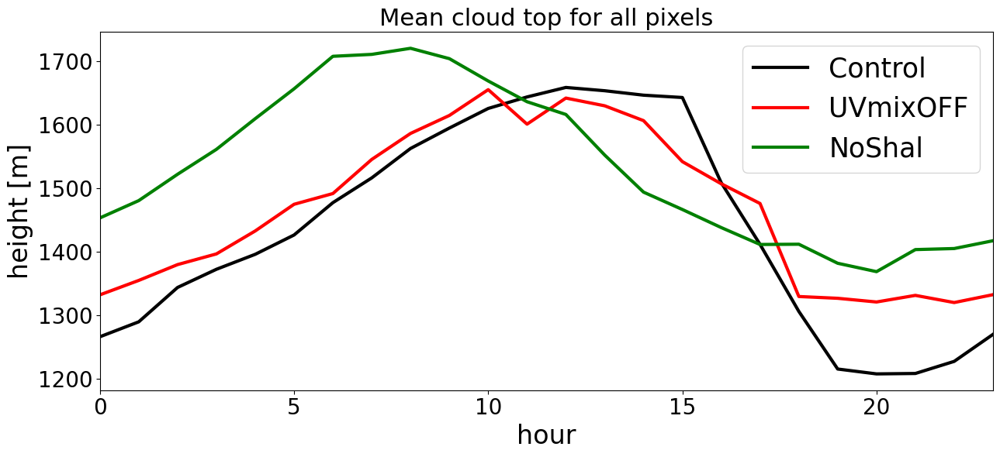

In [3]:
#%% cloud top counts
var = 'cl_top'
plt.figure(figsize=(13,6))
for ide, exp in enumerate(exps):
    (harm3d[exp][var]<4000).sum(dim=('x','y')).groupby('time.hour').mean()\
        .plot(color=col[ide],label=lab[ide]+'_tot',lw=3)
    (harm3d[exp][var]<1500).sum(dim=('x','y')).groupby('time.hour').mean()\
        .plot(color=col[ide],label=lab[ide]+'_Sh',lw=1)
    ((harm3d[exp][var]<4000)&(harm3d[exp][var]>2500)).sum(dim=('x','y')).groupby('time.hour').mean()\
            .plot(color=col[ide],label=lab[ide]+'_Dp',ls='--',lw=1)
plt.ylabel(r'count of pixels')
plt.legend(fontsize=25)
plt.title('Cloud top counts for Deeper and Shallower pixels',fontsize=22)
plt.xlim([0,23])
plt.tight_layout()  

plt.figure(figsize=(13,6))
for ide, exp in enumerate(exps):
    (harm3d[exp][var]).mean(dim=('x','y')).groupby('time.hour').mean()\
        .plot(color=col[ide],label=lab[ide],lw=3)
plt.ylabel(r'height [m]')
plt.legend(fontsize=25)
plt.title('Mean cloud top for all pixels',fontsize=22)
plt.xlim([0,23])
plt.tight_layout()  

# fig, ax1 = plt.subplots(figsize=(13,6))
# for ide, exp in enumerate(exps):
#     harm_obj[exp]['q1_cl_top'].groupby('time.hour').mean('time').plot(c=col[ide],ls='--',ax=ax1)
#     harm_obj[exp]['q3_cl_top'].groupby('time.hour').mean('time').plot(c=col[ide],ls='-' ,ax=ax1)
# plt.ylabel(r'Height  [m]')
# plt.legend(['Lower quartile','Upper quartile'],fontsize=25)
# plt.title('Cloud top heigth',fontsize=22)
# plt.xlim([0,23])
# plt.tight_layout() 

KeyboardInterrupt: 

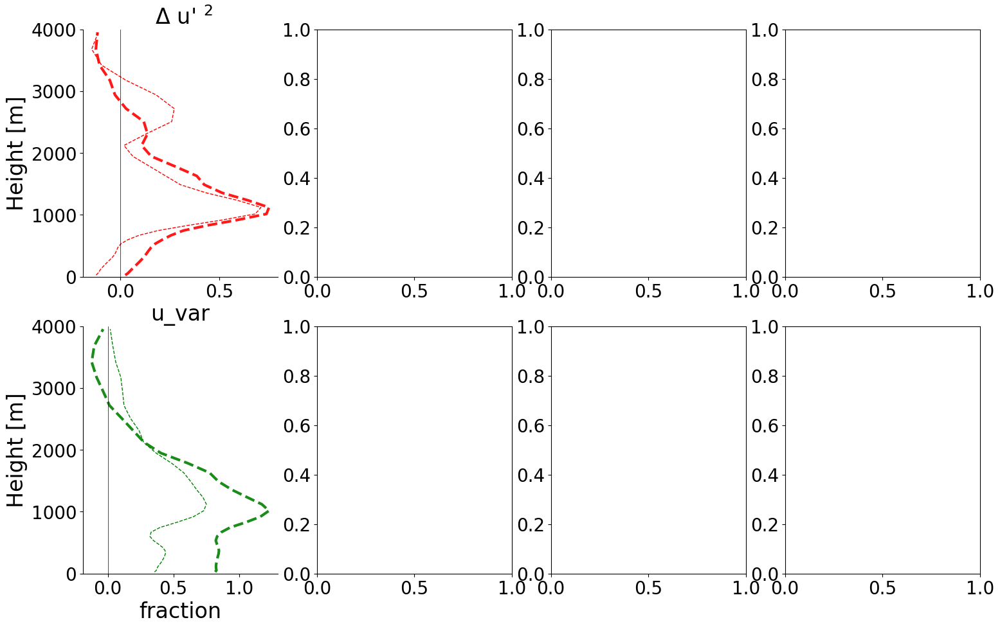

In [17]:
#%% Variances profiles by CC
#### Plot the delta normalised by the control. 
day = '2020'
day = filtered[exps[0]].time 
klp = 5
f_scale = 100*domain_sml/(klp*2)
fig, axs = plt.subplots(2,4,figsize=(18,14))
for idx,var in enumerate(['u','v','w','tke']):
    for ide, exp in enumerate(exps[1:]):
        for idt, time_sel in enumerate([time_g1[group][exp],time_g2[group][exp]]):
            labels = [r'CC|'+lab[ide+1]+"\n"+'> CC|ctrl' , r'CC|'+lab[ide+1]+"\n"+'< CC|ctrl']
            ##########################        
            ### for each scene calculate mean flux in Sh (and Dp) pixels
            #   multiply by the fraction of Sh (and Dp) pixels
            #   average over time 
            if var == 'tke':
                filtered[exps[0]][var].sel(time=time_sel).mean(('x','y'))\
                    .mean('time').sel(klp=klp).isel(z=slice(1,-1)).plot(y='z',ax=axs[ide,idx],\
                                            label=lab[ide],lw=1,c=col[0],ls=['-','--'][idt])
                harm3d[exps[0]][var].sel(time=time_sel).mean(('x','y'))\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[ide,idx],\
                                            label=lab[ide],lw=5,c=col[0],ls=['-','--'][idt],alpha=0.9)
                ## all pixels 
                filtered[exp][var].sel(time=time_sel).mean(('x','y'))\
                    .mean('time').sel(klp=klp).isel(z=slice(1,-1)).plot(y='z',ax=axs[idx],\
                                            label=lab[ide],lw=1,c=col[ide+1],ls=['-','--'][idt])
                harm3d[exp][var].sel(time=time_sel).mean(('x','y'))\
                    .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[ide,idx],\
                                            label=lab[ide],lw=5,c=col[ide+1],ls=['-','--'][idt],alpha=0.9)
                axs[ide,idx].set_xlim(left=0)
            else: 
                ## delta variance 
                ## normalised
                ## filtered
                (((filtered[exp][var+'_pf']**2).sel(time=time_sel).mean(('x','y','time')).interp(z=harm3d[exps[0]].z)-\
                    (filtered[exps[0]][var+'_pf']**2).sel(time=time_sel).mean(('x','y','time')))\
                    /(filtered[exps[0]][var+'_pf']**2).sel(time=time_sel).mean(('x','y','time')))\
                    .sel(klp=klp).sel(z=slice(1,4000)).plot(y='z',ax=axs[ide,idx],\
                                    label=lab[ide]+' '+str(np.around(f_scale/100,1))+'km',\
                                        lw=1,c=col[ide+1],ls=['-','--'][idt])   
                ## 2.5 km resolution 
                ((harm3d[exp][var+'_var'].sel(time=day).mean(('x','y','time')).interp(z=harm3d[exps[0]].z)-\
                    harm3d[exps[0]][var+'_var'].sel(time=day).mean(('x','y','time')))\
                    /harm3d[exps[0]][var+'_var'].sel(time=day).mean(('x','y','time')))\
                    .sel(z=slice(1,4000)).plot(y='z',ax=axs[ide,idx],\
                                    label=lab[ide]+' 2.5km',lw=3,c=col[ide+1],ls=['-','--'][idt],alpha=0.9)

        axs[ide,idx].axvline(0,c='k',lw=0.5)
        axs[ide,idx].set_ylim([0,4000])
        axs[ide,idx].spines['top'].set_visible(False)
        axs[ide,idx].spines['right'].set_visible(False)
    axs[1,idx].set_xlabel(r'$m^2\,s^{-2}$')
    axs[1,idx].set_xlabel(r'fraction')
    axs[1,idx].set_title('')
    if var == 'u':
        axs[0,idx].set_title(r" $\Delta$ u' $^2$",fontsize=24)
    elif var == 'v':
        axs[0,idx].set_title(r"$\Delta$ v' $^2$",fontsize=24)
    elif var == 'w':
        axs[0,idx].set_title(r"$\Delta$ w' $^2$",fontsize=24)
#             axs[idx].set_xlim(left=0,right=4.5)
    elif var == 'hus':
        axs[0,idx].set_title('Specific humidity variance',fontsize=24)
    elif var == 'ta':
        axs[0,idx].set_title('Temperature variance',fontsize=24)
    elif var == 'tke':
        axs[0,idx].set_title('Resolved TKE',fontsize=24)
        axs[1,idx].set_xlabel(r'$m^{2}\,s^{-2}$')
            

axs[ide,1].get_yaxis().set_visible(False) 
axs[ide,2].get_yaxis().set_visible(False) 
axs[ide,3].get_yaxis().set_visible(False) 
axs[ide,0].legend(fontsize=18)
plt.tight_layout()
plt.savefig(figure_dir+'variance_prof_TKE_byCC.pdf')

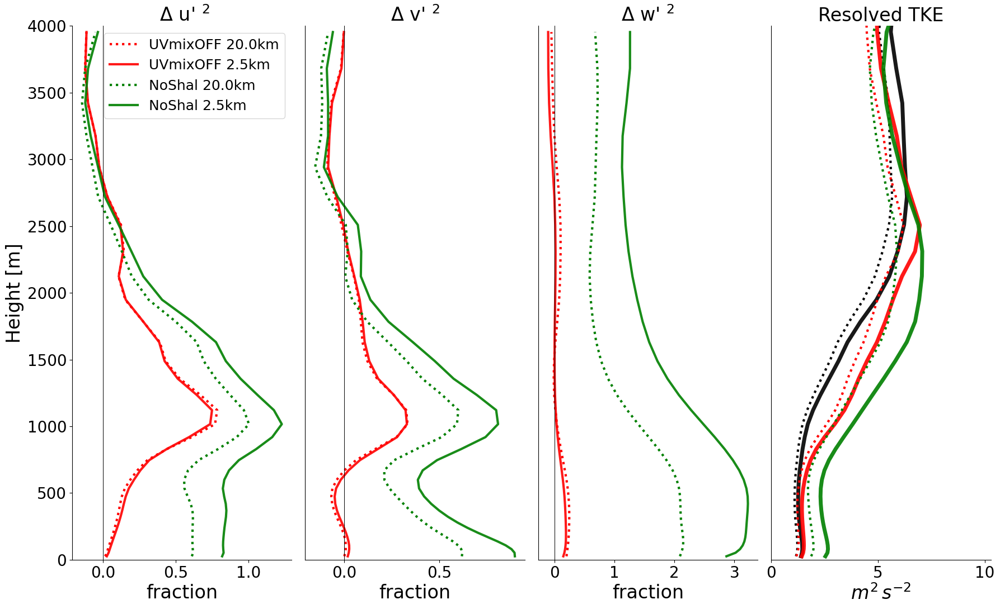

In [36]:
#%% Variances profiles 
#### Plot the delta normalised by the control. 
day = '2020'
day = filtered[exps[0]].time 
klp = 5
f_scale = 100*domain_sml/(klp*2)
fig, axs = plt.subplots(1,4,figsize=(18,11))
for ide, exp in enumerate(exps):
    for idx,var in enumerate(['u','v','w','tke']):
        ### for each scene calculate mean flux in Sh (and Dp) pixels
        #   multiply by the fraction of Sh (and Dp) pixels
        #   average over time 
        if var == 'tke':
            ## all pixels 
            filtered[exp][var].sel(time=day).mean(('x','y'))\
                .mean('time').sel(klp=klp).isel(z=slice(1,-1)).plot(y='z',ax=axs[idx],\
                                        label=lab[ide],lw=3,c=col[ide],ls=':')
            harm3d[exp][var].sel(time=day).mean(('x','y'))\
                .mean('time').isel(z=slice(1,-1)).plot(y='z',ax=axs[idx],\
                                        label=lab[ide],lw=5,c=col[ide],ls='-',alpha=0.9)
        else: 
            ## delta variance 
            if exp != exps[0]:
                ## normalised
                ## filtered
                (((filtered[exp][var+'_pf']**2).sel(time=day).mean(('x','y','time')).interp(z=harm3d[exps[0]].z)-\
                    (filtered[exps[0]][var+'_pf']**2).sel(time=day).mean(('x','y','time')))\
                    /(filtered[exps[0]][var+'_pf']**2).sel(time=day).mean(('x','y','time')))\
                    .sel(klp=klp).sel(z=slice(1,4000)).plot(y='z',ax=axs[idx],\
                                    label=lab[ide]+' '+str(np.around(f_scale/100,1))+'km',\
                                        lw=3,c=col[ide],ls=':')   
                ## 2.5 km resolution 
                ((harm3d[exp][var+'_var'].sel(time=day).mean(('x','y','time')).interp(z=harm3d[exps[0]].z)-\
                    harm3d[exps[0]][var+'_var'].sel(time=day).mean(('x','y','time')))\
                    /harm3d[exps[0]][var+'_var'].sel(time=day).mean(('x','y','time')))\
                    .sel(z=slice(1,4000)).plot(y='z',ax=axs[idx],\
                                    label=lab[ide]+' 2.5km',lw=3,c=col[ide],ls='-',alpha=0.9)

        axs[idx].axvline(0,c='k',lw=0.5)
        axs[idx].set_ylim([0,4000])
        axs[idx].set_xlabel(r'$m^2\,s^{-2}$')
        axs[idx].set_xlabel(r'fraction')
        if var == 'u':
            axs[idx].set_title(r" $\Delta$ u' $^2$",fontsize=24)
        elif var == 'v':
            axs[idx].set_title(r"$\Delta$ v' $^2$",fontsize=24)
        elif var == 'w':
            axs[idx].set_title(r"$\Delta$ w' $^2$",fontsize=24)
#             axs[idx].set_xlim(left=0,right=4.5)
        elif var == 'hus':
            axs[idx].set_title('Specific humidity variance',fontsize=24)
        elif var == 'ta':
            axs[idx].set_title('Temperature variance',fontsize=24)
        elif var == 'tke':
            axs[idx].set_title('Resolved TKE',fontsize=24)
            axs[idx].set_xlabel(r'$m^{2}\,s^{-2}$')
            axs[idx].set_xlim(left=0)
        axs[idx].spines['top'].set_visible(False)
        axs[idx].spines['right'].set_visible(False)
axs[1].get_yaxis().set_visible(False) 
axs[2].get_yaxis().set_visible(False) 
axs[3].get_yaxis().set_visible(False) 
axs[0].legend(fontsize=18)
plt.tight_layout()
plt.savefig(figure_dir+'variance_prof_TKE.pdf')